<a href="https://colab.research.google.com/github/Iqbalrzl/Efficient-Deepfake-Detection-MobileNetV3-ECA-KD/blob/main/Deteksi_DeepFake_Efisien_Berbasis_MobileNetV3_dengan_Lightweight_Attention_dan_Knowledge_Distillation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Helper

In [ ]:
import numpy as np
import random
import torch

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [ ]:
def evaluate_model(
    model,
    test_loader,
    criterion,
    test_metrics,
    device,
    input_size=(1, 3, 224, 224)
):
    """
    Runs a full evaluation on a model, measuring performance and efficiency.

    Args:
        model (nn.Module): The trained model to evaluate.
        test_loader (DataLoader): DataLoader for the test set.
        criterion (nn.Module): The loss function. (Can be DistillationLoss or standard BCE)
        test_metrics (MetricCollection): A torchmetrics.MetricCollection instance.
        device (str): 'cuda' or 'cpu'.
        input_size (tuple): Input dimensions (B, C, H, W) for the speed test.

    Returns:
        dict: A dictionary containing all scalar metrics.
    """
    print("--- Starting Final Evaluation ---")
    model.to(device)
    model.eval()
    test_metrics.to(device)

    all_results = {}
    test_loss = 0.0

    # --- 1. Performance ---
    print("--- Evaluating Performance Metrics ---")
    val_pbar = tqdm(test_loader, desc="Evaluating Test Set", unit="batch")

    with torch.no_grad():
        for inputs, labels in val_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            labels_unsqueezed = labels.float().unsqueeze(1)

            with autocast(enabled=(device == 'cuda')):
                outputs = model(inputs)

                # Check if this is a KD loss or standard loss
                # This makes it robust for both evaluation types
                if hasattr(criterion, 'hard_criterion'):
                    # Use the hard_loss for evaluation
                    loss = criterion.hard_criterion(outputs, labels_unsqueezed)
                else:
                    # Use the standard loss
                    loss = criterion(outputs, labels_unsqueezed)

                preds_sigmoid = outputs.sigmoid()

            test_loss += loss.item()
            test_metrics.update(preds_sigmoid, labels_unsqueezed)
            val_pbar.set_postfix(loss=loss.item())

    # Compute final metrics
    avg_test_loss = test_loss / len(test_loader)
    metrics_computed = test_metrics.compute()
    test_metrics.reset()

    # Store performance metrics
    all_results['test_loss'] = avg_test_loss
    for key, value in metrics_computed.items():
        all_results[key] = value.item() # e.g., 'val_acc', 'val_f1'

    print("--- Evaluating Efficiency Metrics ---")
    # --- 2. Efficiency (Inference Time, FPS) ---
    avg_time, fps = _measure_inference_speed(
        model,
        device,
        input_size=input_size
    )

    # Store efficiency metrics
    all_results['avg_inference_time_ms'] = avg_time
    all_results['throughput_fps'] = fps

    print("--- Evaluation Complete ---")

    # Print final results
    print("\n--- Final Test Results ---")
    for key, value in all_results.items():
        if 'loss' in key or 'time' in key:
            print(f"   {key}: {value:.4f}")
        elif 'fps' in key:
            print(f"   {key}: {value:.2f}")
        else:
            print(f"   {key}: {value:.4f}") # For Acc, F1, etc.

    return all_results

In [ ]:
import os

def get_experiment_paths(
    name: str,
    base_checkpoint_dir: str,
    base_backup_dir: str,
    base_log_dir: str
) -> tuple:
    """
    Generates and creates unique paths for a specific experiment run.

    Args:
        name (str): The unique name for this experiment (e.g., "run_01", "finetune_5_epochs").
        base_checkpoint_dir (str): The root folder for ALL checkpoints (e.g., .../checkpoint).
        base_backup_dir (str): The root folder for ALL backups (e.g., .../backup).
        base_log_dir (str): The root folder for ALL logs (e.g., .../logs).

    Returns:
        tuple: (exp_checkpoint_dir, exp_backup_path, exp_log_dir)
               Paths ready to be passed to the 'train_model' function.
    """

    exp_checkpoint_dir = os.path.join(base_checkpoint_dir, name)
    os.makedirs(exp_checkpoint_dir, exist_ok=True)

    exp_log_dir = os.path.join(base_log_dir, name)
    os.makedirs(exp_log_dir, exist_ok=True)

    backup_filename = f"{name}_latest_backup.pth"
    exp_backup_path = os.path.join(base_backup_dir, backup_filename)

    print(f"--- Paths for Experiment: '{name}' ---")
    print(f"Checkpoint Dir: {exp_checkpoint_dir}")
    print(f"Backup File: {exp_backup_path}")
    print(f"Log Dir: {exp_log_dir}")
    print("---------------------------------------")

    return exp_checkpoint_dir, exp_backup_path, exp_log_dir

In [ ]:
import torch
import torch.nn as nn
import os
from collections import OrderedDict

def load_model_weights(model: nn.Module, weights_path: str, device: str) -> nn.Module:
    """
    Loads model weights from a .pth file and returns the model in .eval() mode.

     Args:
        model (nn.Module): The "empty" model architecture (e.g., MobileNetV3_()).
        weights_path (str): The full path to the .pth file containing the weights.
        device (str): The device ('cuda' or 'cpu') to load the model onto.

    Returns:
        nn.Module: The model with loaded weights, moved to the specified device.
    """

    if not os.path.exists(weights_path):
        print(f"Error: Weights file not found at {weights_path}")
        print("Returning the original model without loading weights.")
        return model.to(device)

    try:
        # Load the checkpoint onto the specified device
        checkpoint = torch.load(weights_path, map_location=torch.device(device))

        state_dict = None

        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            print(f"Detected a backup file. Loading 'model_state_dict'...")
            state_dict = checkpoint['model_state_dict']
        else:
            print(f"Detected a direct state_dict file...")
            state_dict = checkpoint

        first_key = next(iter(state_dict.keys()))

        if first_key.startswith('module.'):
            # Create a new state_dict without the 'module.' prefix
            new_state_dict = OrderedDict()
            for k, v in state_dict.items():
                name = k[7:] # Remove 'module.' (7 characters)
                new_state_dict[name] = v
            state_dict = new_state_dict

        # Load the state_dict into the model architecture
        model.load_state_dict(state_dict)

        # Move the entire model to the device
        model.to(device)

        # Set the model to evaluation mode
        model.eval()

        print(f"Successfully loaded weights from: {weights_path}")

    except Exception as e:
        print(f"Error loading weights: {e}")
        print("Returning the original model without loading weights.")
        return model.to(device)

    return model

In [ ]:
def format_si(num, format_str="%.2f"):
    """
    Formats a number into SI (powers of 1000) units.
    Corrected version for FLOPs and Params.
    e.g., 1_230_000_000 -> "1.23G"
    """
    if num == 0:
        return "0"
    if num >= 1e12:
        return (format_str % (num / 1e12)) + "T"  # Tera
    if num >= 1e9:
        return (format_str % (num / 1e9)) + "G"   # Giga
    if num >= 1e6:
        return (format_str % (num / 1e6)) + "M"   # Mega
    if num >= 1e3:
        return (format_str % (num / 1e3)) + "K"   # Kilo
    return format_str % num  # Base

In [ ]:
def _measure_inference_speed(model, device, input_size=(1, 3, 224, 224), num_runs=500):
    """
    Internal helper function to robustly measure latency (ms) and throughput (FPS).
    Runs on a single sample to measure pure, un-batched latency.
    """
    model.to(device)
    model.eval()

    # Create a single dummy input
    dummy_input = torch.randn(input_size, device=device)

    # --- 1. Warm-up (Crucial) ---
    # Run a few iterations first to "warm up"
    # CUDA caches and kernels.
    print(f"   Running {num_runs//10} warm-up iterations...")
    for _ in range(num_runs // 10):
        with torch.no_grad():
            with autocast(enabled=(device == 'cuda')):
                _ = model(dummy_input)

    # Synchronize CUDA (MANDATORY for accurate GPU timing)
    if device == 'cuda':
        torch.cuda.synchronize()

    # --- 2. Time Measurement ---
    print(f"   Running {num_runs} measurement iterations...")
    start_time = time.perf_counter()

    for _ in range(num_runs):
        with torch.no_grad():
            with autocast(enabled=(device == 'cuda')):
                _ = model(dummy_input)

    # Synchronize CUDA again at the end
    if device == 'cuda':
        torch.cuda.synchronize()

    end_time = time.perf_counter()

    # --- 3. Result Calculation ---
    total_time_ms = (end_time - start_time) * 1000
    avg_inference_time = total_time_ms / num_runs
    throughput_fps = 1000.0 / avg_inference_time

    return avg_inference_time, throughput_fps

In [ ]:
def _measure_flops_params(model, device, input_size=(1, 3, 224, 224)):
    """Helper to measure raw FLOPs and Params."""
    model.to(device)
    model.eval()

    # Create a dummy input on the correct device
    dummy_input = torch.randn(input_size, device=device)

    print(f" -> Calculating FLOPs & Params (input: {input_size})...")
    try:
        flops, params = profile(model, inputs=(dummy_input, ), verbose=False)
        return flops, params
    except Exception as e:
        print(f" -> Warning: Failed to calculate FLOPs/Params: {e}")
        return -1.0, -1.0

In [ ]:
import pandas as pd
import os
from collections import OrderedDict
from typing import Optional

def save_metrics_report(
    save_directory: str,
    file_name: str = "final_test_metrics.csv",
    performance_metrics: Optional[dict] = None,
    efficiency_metrics: Optional[dict] = None
) -> dict:
    """
    Saves performance and/or efficiency metrics to a CSV based on
    which dictionaries are provided.

    Args:
        save_directory (str): Path to the directory for saving the CSV.
        file_name (str, optional): Name of the output CSV file.
        performance_metrics (dict, optional): Dict from evaluate_performance.
        efficiency_metrics (dict, optional): Dict from evaluate_efficiency.

    Returns:
        dict: The final dictionary of metrics that were saved.

    Raises:
        ValueError: If neither metrics dictionary is provided.
    """

    final_metrics = OrderedDict()
    save_mode_str = ""

    if performance_metrics and efficiency_metrics:
        print("\n--- Saving Metrics (Both) ---")
        final_metrics.update(performance_metrics)
        final_metrics.update(efficiency_metrics)
        save_mode_str = "Both"
    elif performance_metrics:
        print("\n--- Saving Metrics (Performance Only) ---")
        final_metrics.update(performance_metrics)
        save_mode_str = "Performance"
    elif efficiency_metrics:
        print("\n--- Saving Metrics (Efficiency Only) ---")
        final_metrics.update(efficiency_metrics)
        save_mode_str = "Efficiency"
    else:
        raise ValueError("At least one metrics dictionary (performance_metrics or "
                         "efficiency_metrics) must be provided.")

    df_results = pd.DataFrame([final_metrics])
    os.makedirs(save_directory, exist_ok=True)
    save_path = os.path.join(save_directory, file_name)
    df_results.to_csv(save_path, index=False)

    print(f"\nFinal metrics ({save_mode_str}) saved to {save_path}")
    print("--- Evaluation Complete ---")

    print(f"\nFinal Metrics Report ({save_mode_str}):")
    for key, value in final_metrics.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
        else:
            print(f"  {key}: {value}")

    return final_metrics

#**Deteksi DeepFake Efisien Berbasis MobileNetV3 dengan Lightweight Attention dan Knowledge Distillation**



In [ ]:
!lscpu

Architecture:                x86_64
  CPU op-mode(s):            32-bit, 64-bit
  Address sizes:             46 bits physical, 48 bits virtual
  Byte Order:                Little Endian
CPU(s):                      2
  On-line CPU(s) list:       0,1
Vendor ID:                   GenuineIntel
  Model name:                Intel(R) Xeon(R) CPU @ 2.20GHz
    CPU family:              6
    Model:                   79
    Thread(s) per core:      2
    Core(s) per socket:      1
    Socket(s):               1
    Stepping:                0
    BogoMIPS:                4399.99
    Flags:                   fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pg
                             e mca cmov pat pse36 clflush mmx fxsr sse sse2 ss h
                             t syscall nx pdpe1gb rdtscp lm constant_tsc rep_goo
                             d nopl xtopology nonstop_tsc cpuid tsc_known_freq p
                             ni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2ap
                   

In [ ]:
!nvidia-smi

Sun Nov 16 17:39:05 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   72C    P0             35W /   72W |    1311MiB /  23034MiB |      1%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

##Libraries

---

In [ ]:
!pip install -q thop
!pip install -q torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 12.5 MB/s eta 0:00:00


In [ ]:
# Misc
import os
import math
import random
import time
import json
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from functools import partial
from typing import Any, Callable, Dict, List, Optional, Sequence
from thop import profile

# Torch
import torch
from torch import Tensor
import torch.nn as nn
from torch.nn.parameter import Parameter
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, TensorDataset
from torch.utils.tensorboard import SummaryWriter
from torch.cuda.amp import autocast, GradScaler
import torchvision.transforms as T
import torchvision.models as models
from torchvision.models import (
  mobilenet_v3_large,
  mobilenet_v3_small,
  MobileNet_V3_Large_Weights,
  MobileNet_V3_Small_Weights,
  convnext_base,
  ConvNeXt_Base_Weights
)
from torchvision.models.mobilenetv3 import (
    InvertedResidualConfig,
    MobileNetV3,
    _mobilenet_v3_conf,
    _mobilenet_v3,
)
from torchvision.models._utils import _make_divisible
from torchvision.models._api import WeightsEnum
from torchvision.datasets import ImageFolder
from torchvision.ops.misc import Conv2dNormActivation
from torchvision.utils import _log_api_usage_once
from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary
import torchmetrics
from torchmetrics import MetricCollection, Accuracy, F1Score, Precision, Recall , ConfusionMatrix

##**Global Configuration**

---

In [ ]:
set_seed(42)
NUM_CLASSES = 1
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
INPUT_SIZE = (1, 3, 224, 224)
CLASS_NAMES = ['Fake', 'Real']

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

Using device: cpu


##**---DATASET------------------------**

---

###**FaceForensic++**

> [Paper](https://arxiv.org/abs/1901.08971)

> [Github](https://github.com/ondyari/FaceForensics)

###**Configuration**

In [ ]:
TRAIN_DIR = '/content/drive/MyDrive/Tugas-Akhir/Dataset/preprocessed/balanced/train'
VAL_DIR   = '/content/drive/MyDrive/Tugas-Akhir/Dataset/preprocessed/balanced/val'
TEST_DIR  = '/content/drive/MyDrive/Tugas-Akhir/Dataset/preprocessed/balanced/test'

In [ ]:
TRAIN_DIR = '/content/drive/MyDrive/Tugas-Akhir/Dataset/final/train'
VAL_DIR   = '/content/drive/MyDrive/Tugas-Akhir/Dataset/final/val'
TEST_DIR  = '/content/drive/MyDrive/Tugas-Akhir/Dataset/final/test'

###**Data Augmentation**

In [ ]:
train_transforms = T.Compose([
    T.Resize(IMG_SIZE),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    T.RandomAffine(degrees=15, translate=None, scale=(0.9, 1.1)),
    T.RandomApply([
        T.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 1.0))
    ], p=0.5),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transforms = T.Compose([
    T.Resize(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = ImageFolder(TRAIN_DIR, transform=train_transforms)
val_dataset = ImageFolder(VAL_DIR, transform=val_test_transforms)
test_dataset = ImageFolder(TEST_DIR, transform=val_test_transforms)

print(f"Class mapping: {train_dataset.class_to_idx}")

Class mapping: {'fake': 0, 'real': 1}


###**Load Dataset**

In [ ]:
num_workers = 2

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)

###Cross-Dataset (Celeb-DF-v2)

In [ ]:
CELEB_TEST_DIR = "/content/drive/MyDrive/Tugas-Akhir/Dataset-2/Celeb-DF-v2/preprocessed"

In [ ]:
val_test_transforms = T.Compose([
    T.Resize(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
celeb_test_dataset = ImageFolder(CELEB_TEST_DIR, transform=val_test_transforms)

In [ ]:
num_workers = 2
celeb_test_loader = DataLoader(
    celeb_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)

##**---ECA------------------------------**

---

###**Module**

In [ ]:
class eca_layer(nn.Module):
    """
    Constructs a ECA module.

    Args:
        channel: Number of channels of the input feature map
        k_size: Adaptive selection of kernel size
    """
    def __init__(self, channel, gamma=2, b=1):
        super(eca_layer, self).__init__()

        # Adaptive K size
        t = (math.log2(channel) + b) / gamma
        k = int(t)

        # Nearest odd
        k_size = k if k % 2 else k + 1

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv = nn.Conv1d(1, 1,
                              kernel_size=k_size,
                              padding=(k_size - 1) // 2,
                              bias=False)
        self.sigmoid = nn.Sigmoid()

        # super(eca_layer, self).__init__()
        # self.avg_pool = nn.AdaptiveAvgPool2d(1)
        # self.conv = nn.Conv1d(1, 1, kernel_size=k_size, padding=(k_size - 1) // 2, bias=False)
        # self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # feature descriptor on the global spatial information
        y = self.avg_pool(x)

        # Two different branches of ECA module
        y = self.conv(y.squeeze(-1).transpose(-1, -2)).transpose(-1, -2).unsqueeze(-1)

        # Multi-scale information fusion
        y = self.sigmoid(y)

        return x * y.expand_as(x)

In [ ]:
class ECA_InvertedResidual(nn.Module):
    """
    Custom InvertedResidual of MobileNetV3.
    (Squeeze-and-Excite (SE) -> Efficient Channel Attention (ECA)).
    """
    def __init__(
        self,
        cnf: InvertedResidualConfig,
        norm_layer: Callable[..., nn.Module],
    ):
        super().__init__()
        if not (1 <= cnf.stride <= 2):
            raise ValueError("illegal stride value")

        self.use_res_connect = cnf.stride == 1 and cnf.input_channels == cnf.out_channels

        layers: List[nn.Module] = []
        activation_layer = nn.Hardswish if cnf.use_hs else nn.ReLU

        # expand
        if cnf.expanded_channels != cnf.input_channels:
            layers.append(
                Conv2dNormActivation(
                    cnf.input_channels,
                    cnf.expanded_channels,
                    kernel_size=1,
                    norm_layer=norm_layer,
                    activation_layer=activation_layer,
                )
            )

        # depthwise
        stride = 1 if cnf.dilation > 1 else cnf.stride
        layers.append(
            Conv2dNormActivation(
                cnf.expanded_channels,
                cnf.expanded_channels,
                kernel_size=cnf.kernel,
                stride=stride,
                dilation=cnf.dilation,
                groups=cnf.expanded_channels,
                norm_layer=norm_layer,
                activation_layer=activation_layer,
            )
        )

        # ECA
        if cnf.use_se:
          # Adaptive k size
          layers.append(eca_layer(cnf.expanded_channels))

        # if cnf.use_se:
        #     # k_size=5
        #     layers.append(eca_layer(cnf.expanded_channels, k_size=5))

        # project
        layers.append(
            Conv2dNormActivation(
                cnf.expanded_channels,
                cnf.out_channels,
                kernel_size=1,
                norm_layer=norm_layer,
                activation_layer=None,
            )
        )

        self.block = nn.Sequential(*layers)
        self.out_channels = cnf.out_channels
        self._is_cn = cnf.stride > 1

    def forward(self, input: Tensor) -> Tensor:
        result = self.block(input)
        if self.use_res_connect:
            result += input
        return result

###**Builder**

In [ ]:
def eca_mobilenet_v3_large(
    *, weights: Optional[Any] = None, progress: bool = True, **kwargs: Any
) -> MobileNetV3:
    """
    MobileNetV3-Large with ECA Module builder.
    """
    #'ECA_InvertedResidual' as block
    kwargs["block"] = ECA_InvertedResidual

    inverted_residual_setting, last_channel = _mobilenet_v3_conf(
        "mobilenet_v3_large", **kwargs
    )
    return _mobilenet_v3(
        inverted_residual_setting, last_channel, weights, progress, **kwargs
    )

In [ ]:
def eca_mobilenet_v3_small(
    *, weights: Optional[Any] = None, progress: bool = True, **kwargs: Any
) -> MobileNetV3:
    """
    MobileNetV3-Small with ECA Module builder.
    """
    # 'ECA_InvertedResidual' as block
    kwargs["block"] = ECA_InvertedResidual

    inverted_residual_setting, last_channel = _mobilenet_v3_conf(
        "mobilenet_v3_small", **kwargs
    )
    return _mobilenet_v3(
        inverted_residual_setting, last_channel, weights, progress, **kwargs
    )

###**Partial Weights**

In [ ]:
def transfer_partial_weights(source_state_dict: Dict[str, Any],
                             target_model: nn.Module):
    """
    Transfer weights from source_state_dict to target_model.

    Only weights with name and shape that fits will be transfered'

    Args:
        source_state_dict: state_dict from pretrained model (source).
        target_model: Instance custom model (target) to transfer weights.

    Returns:
        LoadResult Object with 'missing_keys' dan 'unexpected_keys'.
    """

    print("Filtering pretrained weights to match custom model.")
    target_sd = target_model.state_dict()
    filtered_sd = {}
    total_params = 0
    transfer_params = 0

    for k, v_source in source_state_dict.items():
        total_params += v_source.numel()
        if k in target_sd:
            v_target = target_sd[k]
            if v_source.shape == v_target.shape:
                filtered_sd[k] = v_source
                transfer_params += v_source.numel()
            else:
                print(f"  > Warning: Skip '{k}' (the shape doesn't match: "
                      f"source {v_source.shape} vs target {v_target.shape})")
        else:
            print(f"  > Info: Key '{k}' not present in target model (skipped).")

    print(f"Filter completed. {transfer_params / total_params:.2%} parameters will be transferred.")
    print("\nTransfering partial weights...")
    load_result = target_model.load_state_dict(filtered_sd, strict=False)

    return load_result

##**---MODEL------------------------**

---

###**MobileNetV3 (Baseline)**

####Setup & Configuration

In [ ]:
BASELINE_MODEL_NAME = "MobileNetV3"

BASELINE_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_MODEL_NAME}"
os.makedirs(BASELINE_DIR, exist_ok=True)

BASELINE_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_MODEL_NAME}/metrics"
os.makedirs(BASELINE_METRICS_DIR, exist_ok=True)

BASELINE_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_MODEL_NAME}/checkpoint'
os.makedirs(BASELINE_CHECKPOINT_DIR, exist_ok=True)

BASELINE_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_MODEL_NAME}/backup'
os.makedirs(BASELINE_BACKUP_DIR, exist_ok=True)

BASELINE_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_MODEL_NAME}/logs'
os.makedirs(BASELINE_LOG_DIR, exist_ok=True)

In [ ]:
class MobileNetV3_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 model_type: str = 'large',
                 pretrained_weights: str ='IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.4):
        """
        Args:
            num_classes (int): Number of output classes for the new classifier.
            model_type (str): 'large' or 'small'.
            pretrained_weights (str): ImageNet weights version (e.g., 'IMAGENET1K_V1')
                                      to transfer. Set to None to skip transfer.
            fine_tune (bool):
                - True (default): All model weights (including base) will be trained.
                - False: Freezes the base model (Feature Extraction), trains only
                         the new classifier.
        """
        super().__init__()

        if pretrained_weights:
            if model_type == 'large':
                self.base_model = models.mobilenet_v3_large(weights=pretrained_weights)
            elif model_type == 'small':
                self.base_model = models.mobilenet_v3_small(weights=pretrained_weights)
            else:
                raise ValueError("model_type must be 'large' or 'small'")
        else:
            if model_type == 'large':
                self.base_model = models.mobilenet_v3_large(weights=None)
            elif model_type == 'small':
                self.base_model = models.mobilenet_v3_small(weights=None)
            else:
                raise ValueError("model_type must be 'large' or 'small'")

        in_features = self.base_model.classifier[0].in_features

        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p),
            nn.Linear(in_features, num_classes)
        )

        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        return self.base_model(x)

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch between fine-tuning and feature extraction.

        Args:
            fine_tune (bool):
                - True: Unfreezes the entire model for fine-tuning.
                - False: Freezes the backbone (features + avgpool),
                         only training the classifier.
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # Freeze the backbone (features and avgpool)
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
baseline_model = MobileNetV3_(
    num_classes=NUM_CLASSES,
    model_type='large',
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=True,
    dropout_p=0.4
    ).to(DEVICE)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 150MB/s]


Setting mode to: FINE_TUNE

--- Initialization Complete. Initial mode: FINE_TUNE ---


In [ ]:
baseline_small_model = MobileNetV3_(
    num_classes=NUM_CLASSES,
    model_type='small',
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=True,
    dropout_p=0.4
    ).to(DEVICE)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:00<00:00, 125MB/s]

Setting mode to: FINE_TUNE

--- Initialization Complete. Initial mode: FINE_TUNE ---


####Summary

In [ ]:
summary(baseline_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4         [-1, 16, 112, 112]             144
       BatchNorm2d-5         [-1, 16, 112, 112]              32
              ReLU-6         [-1, 16, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             256
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 64, 112, 112]           1,024
      BatchNorm2d-11         [-1, 64, 112, 112]             128
             ReLU-12         [-1, 64, 112, 112]               0
           Conv2d-13           [-1, 64, 56, 56]             576
      BatchNorm2d-14           [-1, 64,

In [ ]:
summary(baseline_small_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4           [-1, 16, 56, 56]             144
       BatchNorm2d-5           [-1, 16, 56, 56]              32
              ReLU-6           [-1, 16, 56, 56]               0
 AdaptiveAvgPool2d-7             [-1, 16, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             136
              ReLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 16, 1, 1]             144
      Hardsigmoid-11             [-1, 16, 1, 1]               0
SqueezeExcitation-12           [-1, 16, 56, 56]               0
           Conv2d-13           [-1, 16, 56, 56]             256
      BatchNorm2d-14           [-1, 16,

###**MobileNetV3 Efficient Channel Attention (ECA)**

####Setup & Configuration

In [ ]:
ECA_MODEL_NAME = "MobileNetV3_ECA"

ECA_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{ECA_MODEL_NAME}"
os.makedirs(ECA_DIR, exist_ok=True)

ECA_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{ECA_MODEL_NAME}/metrics"
os.makedirs(ECA_METRICS_DIR, exist_ok=True)

ECA_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{ECA_MODEL_NAME}/checkpoint'
os.makedirs(ECA_CHECKPOINT_DIR, exist_ok=True)

ECA_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{ECA_MODEL_NAME}/backup'
os.makedirs(ECA_BACKUP_DIR, exist_ok=True)

ECA_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{ECA_MODEL_NAME}/logs'
os.makedirs(ECA_LOG_DIR, exist_ok=True)

In [ ]:
class MobileNetV3_ECA(nn.Module):
    def __init__(self,
                 num_classes: int,
                 model_type: str = 'large',
                 pretrained_weights: str = 'IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.4):
        """
        Args:
            num_classes (int): Number of output classes for the new classifier.
            model_type (str): 'large' or 'small'.
            pretrained_weights (str): ImageNet weights version (e.g., 'IMAGENET1K_V1')
                                      to transfer. Set to None to skip transfer.
            fine_tune (bool):
                - True (default): All model weights (including base) will be trained.
                - False: Freezes the base model (Feature Extraction), trains only
                         the new classifier.
        """
        super().__init__()

        if model_type == 'large':
            self.base_model = eca_mobilenet_v3_large(weights=None)
        elif model_type == 'small':
            self.base_model = eca_mobilenet_v3_small(weights=None)
        else:
            raise ValueError("model_type must be 'large' or 'small'")

        in_features = self.base_model.classifier[0].in_features

        if pretrained_weights:
            if model_type == 'large':
                source_model = models.mobilenet_v3_large(weights=pretrained_weights)
            else:
                source_model = models.mobilenet_v3_small(weights=pretrained_weights)

            source_sd = source_model.state_dict()
            del source_model

            load_result = transfer_partial_weights(source_sd, self.base_model)

            print("\n--- TRANSFER RESULT ---")
            print(f"Missing Keys (New ECA Layers & Classifier): {len(load_result.missing_keys)}")
            print(f"Unexpected Keys (Old SE Layers): {len(load_result.unexpected_keys)}\n")

        else:
            print("\nNo pretrained_weights provided. Model will be trained from scratch.")

        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p),
            nn.Linear(in_features, num_classes)
        )

        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")


    def forward(self, x: Tensor) -> Tensor:
        return self.base_model(x)

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch between fine-tuning and feature extraction.

        Args:
            fine_tune (bool):
                - True: Unfreezes the entire model for fine-tuning.
                - False: Freezes the backbone (features + avgpool),
                         only training the classifier.
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            # Unfreeze the entire base model
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # Freeze the backbone (features and avgpool)
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
eca_model = MobileNetV3_ECA(
        num_classes=NUM_CLASSES,
        model_type='large',
        pretrained_weights='IMAGENET1K_V1',
        fine_tune=True,
        dropout_p=0.4
        ).to(DEVICE)

Filtering pretrained weights to match custom model.
  > Info: Key 'features.4.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features

In [ ]:
eca_small_model = MobileNetV3_ECA(
        num_classes=NUM_CLASSES,
        model_type='small',
        pretrained_weights='IMAGENET1K_V1',
        fine_tune=True,
        dropout_p=0.4
        ).to(DEVICE)

Filtering pretrained weights to match custom model.
  > Info: Key 'features.1.block.1.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.1.block.1.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.1.block.1.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.1.block.1.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features

####Summary

In [ ]:
summary(eca_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4         [-1, 16, 112, 112]             144
       BatchNorm2d-5         [-1, 16, 112, 112]              32
              ReLU-6         [-1, 16, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             256
       BatchNorm2d-8         [-1, 16, 112, 112]              32
ECA_InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 64, 112, 112]           1,024
      BatchNorm2d-11         [-1, 64, 112, 112]             128
             ReLU-12         [-1, 64, 112, 112]               0
           Conv2d-13           [-1, 64, 56, 56]             576
      BatchNorm2d-14           [-1, 6

In [ ]:
summary(eca_small_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4           [-1, 16, 56, 56]             144
       BatchNorm2d-5           [-1, 16, 56, 56]              32
              ReLU-6           [-1, 16, 56, 56]               0
 AdaptiveAvgPool2d-7             [-1, 16, 1, 1]               0
            Conv1d-8                [-1, 1, 16]               3
           Sigmoid-9             [-1, 16, 1, 1]               0
        eca_layer-10           [-1, 16, 56, 56]               0
           Conv2d-11           [-1, 16, 56, 56]             256
      BatchNorm2d-12           [-1, 16, 56, 56]              32
ECA_InvertedResidual-13           [-1, 16, 56, 56]               0
           Conv2d-14           [-1, 

##**---KD------------------------------**

---

###**Distillation Loss**

In [ ]:
class BinaryDistillationLoss(nn.Module):
    """
    Knowledge Distillation (Hinton, 2015) implementation for Binary Classification.
    Combines a Hard Loss (vs ground truth) and a Soft Loss (vs teacher).

    Designed to work with models that output logits of shape [Batch, 1].
    """
    def __init__(self, temperature=4.0, alpha=0.5, hard_criterion=None):
        """
        Args:
            temperature (float): The temperature to soften probabilities.
            alpha (float): The weight for the hard loss.
                           loss = alpha * hard_loss + (1 - alpha) * soft_loss
            hard_criterion: The loss function for the hard loss.
                            Defaults to BCEWithLogitsLoss for binary tasks.
        """
        super().__init__()
        self.T = temperature
        self.alpha = alpha

        # Default to BCEWithLogitsLoss, which matches your setup
        self.hard_criterion = hard_criterion or nn.BCEWithLogitsLoss()

        # KLDivLoss expects log-prob input, prob target
        self.kl_div = nn.KLDivLoss(reduction='batchmean')

    def _to_2class_logits(self, logits_1d):
        """
        Converts binary logits [B, 1] into 2-class logits [B, 2].
        P(class 1) = sigmoid(x) -> logit [0, x]
        P(class 0) = 1 - sigmoid(x)
        """
        # [B, 1] -> [B, 2]
        # Logit for class 0 is 0
        # Logit for class 1 is the 1d logit
        return torch.cat([torch.zeros_like(logits_1d), logits_1d], dim=1)

    def forward(self, student_logits, labels, teacher_logits):
        """
        Args:
            student_logits (Tensor): Logits from the student [B, 1]
            labels (Tensor): Ground truth labels [B, 1] (float)
            teacher_logits (Tensor): Logits from the teacher [B, 1]
        """
        T = self.T

        # --- Calculate Soft Loss (Student vs Teacher) ---

        # 1. Convert logits [B, 1] -> [B, 2]
        student_logits_2c = self._to_2class_logits(student_logits / T)
        teacher_logits_2c = self._to_2class_logits(teacher_logits / T)

        # 2. Calculate softened probabilities
        # Input for KLDiv
        log_p_s = F.log_softmax(student_logits_2c, dim=1)
        # Target for KLDiv
        p_t = F.softmax(teacher_logits_2c, dim=1)

        # 3. Calculate KL Divergence
        # The (T*T) scaling is standard from Hinton's paper to
        # re-balance the gradient from the soft loss.
        loss_soft = self.kl_div(log_p_s, p_t) * (T * T)

        # --- Calculate Hard Loss (Student vs Labels) ---
        # Use the original [B, 1] logits
        loss_hard = self.hard_criterion(student_logits, labels)

        # --- Combine Losses ---
        loss = self.alpha * loss_hard + (1 - self.alpha) * loss_soft

        # Return the combined loss and its parts for logging
        return loss, {"hard": loss_hard.item(), "soft": loss_soft.item()}

###**Teacher: ConvNeXt-Base**

####Setup & Configuration

In [ ]:
TEACHER_1_MODEL_NAME = "ConvNeXt"

TEACHER_1_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_1_MODEL_NAME}"
os.makedirs(TEACHER_1_DIR, exist_ok=True)

TEACHER_1_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_1_MODEL_NAME}/metrics"
os.makedirs(TEACHER_1_METRICS_DIR, exist_ok=True)

TEACHER_1_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_1_MODEL_NAME}/checkpoint'
os.makedirs(TEACHER_1_CHECKPOINT_DIR, exist_ok=True)

TEACHER_1_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_1_MODEL_NAME}/backup'
os.makedirs(TEACHER_1_BACKUP_DIR, exist_ok=True)

TEACHER_1_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_1_MODEL_NAME}/logs'
os.makedirs(TEACHER_1_LOG_DIR, exist_ok=True)

In [ ]:
class ConvNeXt(nn.Module):
    def __init__(self,
                 num_classes: int,
                 model_type: str = 'base',
                 pretrained_weights: str = 'IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.5):
        """
        Args:
            num_classes (int): Number of output classes.
            model_type (str): 'tiny', 'small', 'base', or 'large'.
            pretrained_weights (str): Weights to transfer. Set to None for no transfer.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout value for the new classifier head.
        """
        super().__init__()

        model_map = {
            'tiny': (models.convnext_tiny, models.ConvNeXt_Tiny_Weights),
            'small': (models.convnext_small, models.ConvNeXt_Small_Weights),
            'base': (models.convnext_base, models.ConvNeXt_Base_Weights),
            'large': (models.convnext_large, models.ConvNeXt_Large_Weights),
        }

        if model_type not in model_map:
            raise ValueError(f"model_type must be one of {list(model_map.keys())}")

        model_fn, weights_enum = model_map[model_type]

        weights = None
        if pretrained_weights:
            try:
                weights = getattr(weights_enum, pretrained_weights)
                print(f"Loading base model with weights: {pretrained_weights}")
            except AttributeError:
                print(f"Warning: Weights '{pretrained_weights}' not found for {model_type}. "
                      "Loading without weights.")
        else:
            print("Loading base model without pretrained weights (from scratch).")

        self.base_model = model_fn(weights=weights)

        original_layernorm = self.base_model.classifier[0]
        original_flatten = self.base_model.classifier[1]

        in_features = self.base_model.classifier[2].in_features

        self.base_model.classifier = nn.Sequential(
            original_layernorm,
            original_flatten,
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")


    def forward(self, x: Tensor) -> Tensor:
        return self.base_model(x)

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch between fine-tuning and feature extraction.

        Args:
            fine_tune (bool):
                - True: Unfreezes the entire model for fine-tuning.
                - False: Freezes the backbone (features + avgpool),
                         only training the classifier.
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            # Unfreeze the entire base model
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # Freeze the backbone (features and avgpool)
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
teacher_1_model = ConvNeXt(
        num_classes=NUM_CLASSES,
        model_type='base',
        pretrained_weights='IMAGENET1K_V1',
        fine_tune=True,
        dropout_p=0.5
    ).to(DEVICE)

Loading base model with weights: IMAGENET1K_V1
Downloading: "https://download.pytorch.org/models/convnext_base-6075fbad.pth" to /root/.cache/torch/hub/checkpoints/convnext_base-6075fbad.pth


100%|██████████| 338M/338M [00:01<00:00, 229MB/s]


Setting mode to: FINE_TUNE

--- Initialization Complete. Initial mode: FINE_TUNE ---


####Summary

In [ ]:
summary(teacher_1_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 56, 56]           6,272
       LayerNorm2d-2          [-1, 128, 56, 56]             256
            Conv2d-3          [-1, 128, 56, 56]           6,400
           Permute-4          [-1, 56, 56, 128]               0
         LayerNorm-5          [-1, 56, 56, 128]             256
            Linear-6          [-1, 56, 56, 512]          66,048
              GELU-7          [-1, 56, 56, 512]               0
            Linear-8          [-1, 56, 56, 128]          65,664
           Permute-9          [-1, 128, 56, 56]               0
  StochasticDepth-10          [-1, 128, 56, 56]               0
          CNBlock-11          [-1, 128, 56, 56]               0
           Conv2d-12          [-1, 128, 56, 56]           6,400
          Permute-13          [-1, 56, 56, 128]               0
        LayerNorm-14          [-1, 56, 

###**Teacher: ConvNeXtV2-Base**

####Setup & Configuration

In [ ]:
!pip install -q timm
import timm

In [ ]:
TEACHER_2_MODEL_NAME = "ConvNeXtV2-Base"

TEACHER_2_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_2_MODEL_NAME}"
os.makedirs(TEACHER_2_DIR, exist_ok=True)

TEACHER_2_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_2_MODEL_NAME}/metrics"
os.makedirs(TEACHER_2_METRICS_DIR, exist_ok=True)

TEACHER_2_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_2_MODEL_NAME}/checkpoint'
os.makedirs(TEACHER_2_CHECKPOINT_DIR, exist_ok=True)

TEACHER_2_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_2_MODEL_NAME}/backup'
os.makedirs(TEACHER_2_BACKUP_DIR, exist_ok=True)

TEACHER_2_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{TEACHER_2_MODEL_NAME}/logs'
os.makedirs(TEACHER_2_LOG_DIR, exist_ok=True)

In [ ]:
class ConvNeXtV2Base_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained: bool = True,
                 fine_tune: bool = True,
                 dropout_p: float = 0.4):
        """
        Args:
            num_classes (int): Number of output classes.
            pretrained (bool): Whether to load ImageNet weights.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout probability for the new classifier.
        """
        super().__init__()

        # --- 1. Load Base Model from timm ---
        print("Loading ConvNeXt V2-Base from timm...")
        # 'convnextv2_base' usually refers to the FCMAE pre-trained model fine-tuned on ImageNet
        raw_model = timm.create_model('convnextv2_base', pretrained=pretrained)

        # Get the number of input features.
        # For ConvNeXt-Base, this is typically 1024.
        in_features = raw_model.num_features

        # --- IMPORTANT: Reset Classifier & Global Pooling ---
        # We remove the original head and the global pooling.
        # This ensures we get the raw 4D feature maps (B, C, H, W).
        raw_model.reset_classifier(0, global_pool='')

        # --- 2. REFACTORING Structure ---
        # We create the structure expected by your optimizer:
        # model.base_model.features
        # model.base_model.avgpool
        # model.base_model.classifier

        self.base_model = nn.Module()

        # Group the ConvNeXt backbone as 'features'
        self.base_model.features = raw_model

        # Define Average Pooling explicitly
        # ConvNeXt traditionally uses Global Average Pooling
        self.base_model.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Define the new Classifier
        # Note: Original ConvNeXt uses LayerNorm before the linear layer.
        # Here we use a standard Dropout -> Linear head for consistency with your other models.
        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        # --- 3. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for ConvNeXt V2-Base. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        # 1. Extract features (returns 4D tensor: B x 1024 x H x W)
        x = self.base_model.features(x)

        # 2. Average Pooling (returns B x 1024 x 1 x 1)
        x = self.base_model.avgpool(x)

        # 3. Flatten (returns B x 1024)
        x = torch.flatten(x, 1)

        # 4. Classify
        x = self.base_model.classifier(x)
        return x

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """Public method to switch modes."""
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
teacher_2_model = ConvNeXtV2Base_(
    num_classes=NUM_CLASSES,
    pretrained=True,
    fine_tune=False,
    dropout_p=0.4
).to(DEVICE)

Loading ConvNeXt V2-Base from timm...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/355M [00:00<?, ?B/s]

Setting mode to: FEATURE_EXTRACTION

--- Initialization Complete for ConvNeXt V2-Base. Initial mode: FEATURE_EXTRACTION ---


####Summary

In [ ]:
summary(teacher_2_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 56, 56]           6,272
       LayerNorm2d-2          [-1, 128, 56, 56]             256
          Identity-3          [-1, 128, 56, 56]               0
            Conv2d-4          [-1, 128, 56, 56]           6,400
         LayerNorm-5          [-1, 56, 56, 128]             256
            Linear-6          [-1, 56, 56, 512]          66,048
              GELU-7          [-1, 56, 56, 512]               0
           Dropout-8          [-1, 56, 56, 512]               0
GlobalResponseNorm-9          [-1, 56, 56, 512]           1,024
           Linear-10          [-1, 56, 56, 128]          65,664
          Dropout-11          [-1, 56, 56, 128]               0
GlobalResponseNormMlp-12          [-1, 56, 56, 128]               0
         Identity-13          [-1, 128, 56, 56]               0
         Identity-14          [-1, 

###**Teacher: DINOv2**

####Setup & Configuration

In [ ]:
!pip install -q timm
import timm

In [ ]:
DINOV2_MODEL_NAME = "DINOv2-Base"

DINOV2_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{DINOV2_MODEL_NAME}"
os.makedirs(DINOV2_DIR, exist_ok=True)

DINOV2_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{DINOV2_MODEL_NAME}/metrics"
os.makedirs(DINOV2_METRICS_DIR, exist_ok=True)

DINOV2_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{DINOV2_MODEL_NAME}/checkpoint'
os.makedirs(DINOV2_CHECKPOINT_DIR, exist_ok=True)

DINOV2_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{DINOV2_MODEL_NAME}/backup'
os.makedirs(DINOV2_BACKUP_DIR, exist_ok=True)

DINOV2_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/{DINOV2_MODEL_NAME}/logs'
os.makedirs(DINOV2_LOG_DIR, exist_ok=True)

In [ ]:
class SelectClsToken(nn.Module):
    """
    Custom 'Pooling' layer for Vision Transformers.
    Instead of Average Pooling pixels, we select the [CLS] token (index 0).
    """
    def forward(self, x):
        # x shape: (Batch_Size, Num_Tokens, Embed_Dim)
        # We take the first token (CLS token)
        return x[:, 0]

class DinoV2Base_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained: bool = True,
                 fine_tune: bool = True,
                 dropout_p: float = 0.0):
        """
        Args:
            num_classes (int): Number of output classes.
            pretrained (bool): Whether to load DINOv2 weights.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout probability for the new classifier.
        """
        super().__init__()

        # --- 1. Load Base Model from timm ---
        print("Loading DINOv2-Base (ViT) from timm...")

        # --- KEY FIX HERE ---
        # We explicitly set img_size=224.
        # timm will automatically interpolate the positional embeddings
        # from the original 518x518 to fit 224x224.
        raw_model = timm.create_model(
            'vit_base_patch14_dinov2.lvd142m',
            pretrained=pretrained,
            img_size=224
        )

        # Get embedding dimension (768 for ViT-Base)
        embed_dim = raw_model.embed_dim

        # Remove the original head.
        raw_model.reset_classifier(0, global_pool='')

        # --- 2. REFACTORING Structure ---
        self.base_model = nn.Module()
        self.base_model.features = raw_model

        # Use our custom CLS token selector defined previously
        self.base_model.avgpool = SelectClsToken()

        # Define the new Classifier
        self.base_model.classifier = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(embed_dim, num_classes)
        )

        # --- 3. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for DINOv2-Base. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        # 1. Extract features (returns Sequence: B x Num_Tokens x 768)
        x = self.base_model.features(x)
        # 2. Select CLS Token
        x = self.base_model.avgpool(x)
        # 3. Flatten (no-op, consistent API)
        x = torch.flatten(x, 1)
        # 4. Classify
        x = self.base_model.classifier(x)
        return x

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """Public method to switch modes."""
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
dinov2_model = DinoV2Base_(
    num_classes=NUM_CLASSES,
    pretrained=True,
    fine_tune=False,
    dropout_p=0.0 # Lower dropout is often better for pre-trained ViTs
).to(DEVICE)

Loading DINOv2-Base (ViT) from timm...


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Setting mode to: FEATURE_EXTRACTION

--- Initialization Complete for DINOv2-Base. Initial mode: FEATURE_EXTRACTION ---


####Summary

In [ ]:
summary(dinov2_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 768, 16, 16]         452,352
          Identity-2             [-1, 256, 768]               0
        PatchEmbed-3             [-1, 256, 768]               0
           Dropout-4             [-1, 257, 768]               0
          Identity-5             [-1, 257, 768]               0
          Identity-6             [-1, 257, 768]               0
         LayerNorm-7             [-1, 257, 768]           1,536
            Linear-8            [-1, 257, 2304]       1,771,776
          Identity-9          [-1, 12, 257, 64]               0
         Identity-10          [-1, 12, 257, 64]               0
         Identity-11             [-1, 257, 768]               0
           Linear-12             [-1, 257, 768]         590,592
          Dropout-13             [-1, 257, 768]               0
        Attention-14             [-1, 2

###**Student: MobilenetV3 Baseline (KD)**

####Setup & Configuration

In [ ]:
BASELINE_KD_MODEL_NAME = "MobileNetV3_KD"

BASELINE_KD_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_KD_MODEL_NAME}"
os.makedirs(BASELINE_KD_DIR, exist_ok=True)

BASELINE_KD_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_KD_MODEL_NAME}/metrics"
os.makedirs(BASELINE_KD_METRICS_DIR, exist_ok=True)

BASELINE_KD_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_KD_MODEL_NAME}/checkpoint'
os.makedirs(BASELINE_KD_CHECKPOINT_DIR, exist_ok=True)

BASELINE_KD_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_KD_MODEL_NAME}/backup'
os.makedirs(BASELINE_KD_BACKUP_DIR, exist_ok=True)

BASELINE_KD_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{BASELINE_KD_MODEL_NAME}/logs'
os.makedirs(BASELINE_KD_LOG_DIR, exist_ok=True)

####Initialization

In [ ]:
baseline_kd_model = MobileNetV3_(
    num_classes=NUM_CLASSES,
    model_type='large',
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=True,
    dropout_p=0.4
    ).to(DEVICE)

Setting mode to: FINE_TUNE

--- Initialization Complete. Initial mode: FINE_TUNE ---


####Summary

In [ ]:
summary(baseline_kd_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4         [-1, 16, 112, 112]             144
       BatchNorm2d-5         [-1, 16, 112, 112]              32
              ReLU-6         [-1, 16, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             256
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 64, 112, 112]           1,024
      BatchNorm2d-11         [-1, 64, 112, 112]             128
             ReLU-12         [-1, 64, 112, 112]               0
           Conv2d-13           [-1, 64, 56, 56]             576
      BatchNorm2d-14           [-1, 64,

###**Student: MobileNetV3 ECA (KD)**

####Setup & Configuration

In [ ]:
KD_MODEL_NAME = "MobileNetV3_ECA_KD"

KD_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{KD_MODEL_NAME}"
os.makedirs(KD_DIR, exist_ok=True)

KD_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/{KD_MODEL_NAME}/metrics"
os.makedirs(KD_METRICS_DIR, exist_ok=True)

KD_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{KD_MODEL_NAME}/checkpoint'
os.makedirs(KD_CHECKPOINT_DIR, exist_ok=True)

KD_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{KD_MODEL_NAME}/backup'
os.makedirs(KD_BACKUP_DIR, exist_ok=True)

KD_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/{KD_MODEL_NAME}/logs'
os.makedirs(KD_LOG_DIR, exist_ok=True)

####Initialization

In [ ]:
kd_model = MobileNetV3_ECA(
        num_classes=NUM_CLASSES,
        model_type='large',
        pretrained_weights='IMAGENET1K_V1',
        fine_tune=True,
        dropout_p=0.4
        ).to(DEVICE)

Filtering pretrained weights to match custom model.
  > Info: Key 'features.4.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.4.block.2.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features.5.block.2.fc2.bias' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc1.weight' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc1.bias' not present in target model (skipped).
  > Info: Key 'features.6.block.2.fc2.weight' not present in target model (skipped).
  > Info: Key 'features

####Summary

In [ ]:
summary(eca_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             432
       BatchNorm2d-2         [-1, 16, 112, 112]              32
         Hardswish-3         [-1, 16, 112, 112]               0
            Conv2d-4         [-1, 16, 112, 112]             144
       BatchNorm2d-5         [-1, 16, 112, 112]              32
              ReLU-6         [-1, 16, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             256
       BatchNorm2d-8         [-1, 16, 112, 112]              32
ECA_InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 64, 112, 112]           1,024
      BatchNorm2d-11         [-1, 64, 112, 112]             128
             ReLU-12         [-1, 64, 112, 112]               0
           Conv2d-13           [-1, 64, 56, 56]             576
      BatchNorm2d-14           [-1, 6

##**---BENCHMARK MODEL------------**

###**Xception**

####Setup & Configuration

In [ ]:
!pip install -q timm
import timm

In [ ]:
XCEPTION_MODEL_NAME = "Xception"

XCEPTION_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{XCEPTION_MODEL_NAME}"
os.makedirs(XCEPTION_DIR, exist_ok=True)

XCEPTION_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{XCEPTION_MODEL_NAME}/metrics"
os.makedirs(XCEPTION_METRICS_DIR, exist_ok=True)

XCEPTION_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{XCEPTION_MODEL_NAME}/checkpoint'
os.makedirs(XCEPTION_CHECKPOINT_DIR, exist_ok=True)

XCEPTION_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{XCEPTION_MODEL_NAME}/backup'
os.makedirs(XCEPTION_BACKUP_DIR, exist_ok=True)

XCEPTION_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{XCEPTION_MODEL_NAME}/logs'
os.makedirs(XCEPTION_LOG_DIR, exist_ok=True)

In [ ]:
class Xception_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained: bool = True,
                 fine_tune: bool = True,
                 dropout_p: float = 0.4):
        """
        Args:
            num_classes (int): Number of output classes.
            pretrained (bool): Whether to load ImageNet weights.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout probability for the new classifier.
        """
        super().__init__()

        # --- 1. Load Base Model from timm ---
        # We load Xception and strip the original classifier immediately
        print("Loading Xception from timm...")
        raw_model = timm.create_model('xception', pretrained=pretrained)

        # Get the number of input features for the classifier (usually 2048 for Xception)
        in_features = raw_model.num_features

        # Remove the original classification head and global pooling from raw_model
        # reset_classifier(0) makes it return the raw feature maps (4D tensor)
        raw_model.reset_classifier(0, global_pool='')

        # --- 2. REFACTORING Structure ---
        # We create a dummy container to mimic the structure your optimizer expects:
        # model.base_model.features
        # model.base_model.avgpool
        # model.base_model.classifier

        self.base_model = nn.Module()

        # Group the entire Xception backbone (without head) as 'features'
        self.base_model.features = raw_model

        # Define Average Pooling explicitly
        self.base_model.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Define the new Classifier
        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        # --- 3. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for Xception. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        """
        Forward pass explicitly utilizing the refactored components.
        """
        # 1. Extract features (returns 4D tensor: B x C x H x W)
        x = self.base_model.features(x)

        # 2. Average Pooling (returns B x C x 1 x 1)
        x = self.base_model.avgpool(x)

        # 3. Flatten (returns B x C)
        x = torch.flatten(x, 1)

        # 4. Classify
        x = self.base_model.classifier(x)
        return x

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch modes.
        (Identical to all other model classes)
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
xception_model = Xception_(
    num_classes=NUM_CLASSES,
    pretrained=True,
    fine_tune=False,
    dropout_p=0.4
).to(DEVICE)

####Summary

In [ ]:
summary(xception_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 111, 111]             864
       BatchNorm2d-2         [-1, 32, 111, 111]              64
              ReLU-3         [-1, 32, 111, 111]               0
            Conv2d-4         [-1, 64, 109, 109]          18,432
       BatchNorm2d-5         [-1, 64, 109, 109]             128
              ReLU-6         [-1, 64, 109, 109]               0
            Conv2d-7         [-1, 64, 109, 109]             576
            Conv2d-8        [-1, 128, 109, 109]           8,192
   SeparableConv2d-9        [-1, 128, 109, 109]               0
      BatchNorm2d-10        [-1, 128, 109, 109]             256
             ReLU-11        [-1, 128, 109, 109]               0
           Conv2d-12        [-1, 128, 109, 109]           1,152
           Conv2d-13        [-1, 128, 109, 109]          16,384
  SeparableConv2d-14        [-1, 128, 1

###**EfficientNet-B0**

####Setup & Configuration

In [ ]:
EFFICIENTNET_MODEL_NAME = "EfficientNet-B0"

EFFICIENTNET_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{EFFICIENTNET_MODEL_NAME}"
os.makedirs(EFFICIENTNET_DIR, exist_ok=True)

EFFICIENTNET_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{EFFICIENTNET_MODEL_NAME}/metrics"
os.makedirs(EFFICIENTNET_METRICS_DIR, exist_ok=True)

EFFICIENTNET_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{EFFICIENTNET_MODEL_NAME}/checkpoint'
os.makedirs(EFFICIENTNET_CHECKPOINT_DIR, exist_ok=True)

EFFICIENTNET_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{EFFICIENTNET_MODEL_NAME}/backup'
os.makedirs(EFFICIENTNET_BACKUP_DIR, exist_ok=True)

EFFICIENTNET_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{EFFICIENTNET_MODEL_NAME}/logs'
os.makedirs(EFFICIENTNET_LOG_DIR, exist_ok=True)

In [ ]:
class EfficientNetB0_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained_weights: str ='IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.2):
        """
        Args:
            num_classes (int): Number of output classes for the new classifier.
            pretrained_weights (str): ImageNet weights version (e.g., 'IMAGENET1K_V1')
                                      to transfer. Set to None to skip transfer.
            fine_tune (bool):
                - True (default): All model weights (including base) will be trained.
                - False: Freezes the base model (Feature Extraction), trains only
                         the new classifier.
            dropout_p (float): Dropout probability. Default for EfficientNet is 0.2.
        """
        super().__init__()

        # --- 1. Load EfficientNet-B0 Base Model ---
        if pretrained_weights:
            self.base_model = models.efficientnet_b0(weights=pretrained_weights)
        else:
            self.base_model = models.efficientnet_b0(weights=None)

        # --- 2. Get in_features (KEY DIFFERENCE) ---
        # The original EfficientNetB0 classifier is:
        # (0): Dropout(p=0.2, inplace=True)
        # (1): Linear(in_features=1280, out_features=1000, bias=True)
        # We need in_features from the Linear layer [1]

        in_features = self.base_model.classifier[1].in_features

        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        # --- 4. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for EfficientNet-B0. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        """Forward method (identical to MobileNetV3_)"""
        return self.base_model(x)

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch modes.
        This logic (freezing .features and .avgpool)
        also works for EfficientNet in torchvision.
        (Identical to MobileNetV3_)
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
efficientnet_model = EfficientNetB0_(
    num_classes=NUM_CLASSES,
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=True,
    dropout_p=0.2
).to(DEVICE)

####Summary

In [ ]:
summary(efficientnet_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12         [-1, 32, 112, 112]               0
           Conv2d-13         [-1, 16, 112, 112]             512
      BatchNorm2d-14         [-1, 16, 1

###**Resnet-18**

####Setup & Configuration

In [ ]:
RESNET_MODEL_NAME = "ResNet-18"

RESNET_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{RESNET_MODEL_NAME}"
os.makedirs(RESNET_DIR, exist_ok=True)

RESNET_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{RESNET_MODEL_NAME}/metrics"
os.makedirs(RESNET_METRICS_DIR, exist_ok=True)

RESNET_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{RESNET_MODEL_NAME}/checkpoint'
os.makedirs(RESNET_CHECKPOINT_DIR, exist_ok=True)

RESNET_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{RESNET_MODEL_NAME}/backup'
os.makedirs(RESNET_BACKUP_DIR, exist_ok=True)

RESNET_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{RESNET_MODEL_NAME}/logs'
os.makedirs(RESNET_LOG_DIR, exist_ok=True)

In [ ]:
class ResNet18_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained_weights: str ='IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.4):
        """
        Args:
            num_classes (int): Number of output classes.
            pretrained_weights (str): ImageNet weights version.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout probability for the new classifier.
        """
        super().__init__()

        # --- 1. Load Base Model ---
        if pretrained_weights:
            self.base_model = models.resnet18(weights=pretrained_weights)
        else:
            self.base_model = models.resnet18(weights=None)

        # --- 2. Get in_features ---
        # In ResNet, the final layer is .fc
        in_features = self.base_model.fc.in_features

        # --- 3. REFACTORING ResNet ---
        # Match optimizer (model.features, model.avgpool, model.classifier),

        # Group all feature-extraction layers into .features
        self.base_model.features = nn.Sequential(
            self.base_model.conv1,
            self.base_model.bn1,
            self.base_model.relu,
            self.base_model.maxpool,
            self.base_model.layer1,
            self.base_model.layer2,
            self.base_model.layer3,
            self.base_model.layer4
        )

        # Replace .fc with .classifier
        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        # --- 4. Delete Old References ---
        # Delete the original attributes that are now grouped into .features
        # and the original .fc that is now .classifier.
        # This prevents them from being counted twice by the optimizer.
        del self.base_model.conv1
        del self.base_model.bn1
        del self.base_model.relu
        del self.base_model.maxpool
        del self.base_model.layer1
        del self.base_model.layer2
        del self.base_model.layer3
        del self.base_model.layer4
        del self.base_model.fc

        # --- 5. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for ResNet-18. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        """
        Override forward because we broke the original ResNet forward()
        by deleting its layer references.
        """
        x = self.base_model.features(x)
        x = self.base_model.avgpool(x)
        # Flatten for the classifier
        x = torch.flatten(x, 1)
        x = self.base_model.classifier(x)
        return x

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch modes.
        This now works because we created .features, .avgpool, and .classifier.
        (Identical to MobileNetV3_ and EfficientNetB0_ classes)
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
resnet_model = ResNet18_(
    num_classes=NUM_CLASSES,
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=True,
    dropout_p=0.4
).to(DEVICE)

####Summary

In [ ]:
summary(resnet_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

###**ShuffleNetV2**

####Setup & Configuration

In [ ]:
SHUFFLENET_MODEL_NAME = "ShuffleNetV2-x1-0"

SHUFFLENET_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{SHUFFLENET_MODEL_NAME}"
os.makedirs(SHUFFLENET_DIR, exist_ok=True)

SHUFFLENET_METRICS_DIR = f"/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{SHUFFLENET_MODEL_NAME}/metrics"
os.makedirs(SHUFFLENET_METRICS_DIR, exist_ok=True)

SHUFFLENET_CHECKPOINT_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{SHUFFLENET_MODEL_NAME}/checkpoint'
os.makedirs(SHUFFLENET_CHECKPOINT_DIR, exist_ok=True)

SHUFFLENET_BACKUP_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{SHUFFLENET_MODEL_NAME}/backup'
os.makedirs(SHUFFLENET_BACKUP_DIR, exist_ok=True)

SHUFFLENET_LOG_DIR = f'/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/{SHUFFLENET_MODEL_NAME}/logs'
os.makedirs(SHUFFLENET_LOG_DIR, exist_ok=True)

In [ ]:
class ShuffleNetV2_(nn.Module):
    def __init__(self,
                 num_classes: int = 1,
                 pretrained_weights: str ='IMAGENET1K_V1',
                 fine_tune: bool = True,
                 dropout_p: float = 0.4): # Using 0.4 to match your MobileNet
        """
        Args:
            num_classes (int): Number of output classes.
            pretrained_weights (str): ImageNet weights version.
            fine_tune (bool): True for fine-tuning, False for feature extraction.
            dropout_p (float): Dropout probability for the new classifier.
        """
        super().__init__()

        # --- 1. Load Base Model ---
        # We use shufflenet_v2_x1_0 here
        if pretrained_weights:
            self.base_model = models.shufflenet_v2_x1_0(weights=pretrained_weights)
        else:
            self.base_model = models.shufflenet_v2_x1_0(weights=None)

        # --- 2. Get in_features ---
        # In ShuffleNetV2, the final layer is .fc
        # For shufflenet_v2_x1_0, in_features is 1024
        in_features = self.base_model.fc.in_features

        # --- 3. REFACTORING ShuffleNetV2 ---
        # Group all feature-extraction layers into .features
        self.base_model.features = nn.Sequential(
            self.base_model.conv1,
            self.base_model.maxpool,
            self.base_model.stage2,
            self.base_model.stage3,
            self.base_model.stage4,
            self.base_model.conv5
        )

        # .avgpool: ShuffleNetV2 does this as an operation (x.mean())
        # in its forward pass. We create an equivalent module to
        # make it visible to the optimizer.
        self.base_model.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Replace .fc with .classifier (following your pattern)
        self.base_model.classifier = nn.Sequential(
            nn.Dropout(p=dropout_p, inplace=True),
            nn.Linear(in_features, num_classes)
        )

        # --- 4. Delete Old References ---
        # Delete original attributes now grouped/replaced
        del self.base_model.conv1
        del self.base_model.maxpool
        del self.base_model.stage2
        del self.base_model.stage3
        del self.base_model.stage4
        del self.base_model.conv5
        del self.base_model.fc

        # --- 5. Set Training Mode ---
        self.set_fine_tune_mode(fine_tune)

        print(f"\n--- Initialization Complete for ShuffleNetV2-x1-0. Initial mode: {'FINE_TUNE' if fine_tune else 'FEATURE_EXTRACTION'} ---")

    def forward(self, x):
        """
        We MUST override forward because we broke the original one.
        """
        x = self.base_model.features(x)
        x = self.base_model.avgpool(x)
        # Flatten for the classifier
        x = torch.flatten(x, 1)
        x = self.base_model.classifier(x)
        return x

    def set_fine_tune_mode(self, fine_tune: bool = True):
        """
        Public method to switch modes.
        (Identical to all other model classes)
        """
        if fine_tune:
            print("Setting mode to: FINE_TUNE")
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            print("Setting mode to: FEATURE_EXTRACTION")
            # 1. Freeze features
            for param in self.base_model.features.parameters():
                param.requires_grad = False
            # 2. Freeze avgpool
            for param in self.base_model.avgpool.parameters():
                param.requires_grad = False
            # 3. Ensure the new classifier is unfrozen
            for param in self.base_model.classifier.parameters():
                param.requires_grad = True

####Initialization

In [ ]:
shufflenet_model = ShuffleNetV2_(
    num_classes=NUM_CLASSES,
    pretrained_weights='IMAGENET1K_V1',
    fine_tune=False,
    dropout_p=0.4
).to(DEVICE)

####Summary

In [ ]:
summary(shufflenet_model.to(DEVICE), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 24, 112, 112]             648
       BatchNorm2d-2         [-1, 24, 112, 112]              48
              ReLU-3         [-1, 24, 112, 112]               0
         MaxPool2d-4           [-1, 24, 56, 56]               0
            Conv2d-5           [-1, 24, 28, 28]             216
       BatchNorm2d-6           [-1, 24, 28, 28]              48
            Conv2d-7           [-1, 58, 28, 28]           1,392
       BatchNorm2d-8           [-1, 58, 28, 28]             116
              ReLU-9           [-1, 58, 28, 28]               0
           Conv2d-10           [-1, 58, 56, 56]           1,392
      BatchNorm2d-11           [-1, 58, 56, 56]             116
             ReLU-12           [-1, 58, 56, 56]               0
           Conv2d-13           [-1, 58, 28, 28]             522
      BatchNorm2d-14           [-1, 58,

##**---TRAINING------------------------**

---

###**Definition**

####Regular Train

In [ ]:
def train_model(
    model,
    criterion,
    optimizer,
    scheduler,
    train_loader,
    val_loader,
    train_metrics,
    val_metrics,
    EPOCHS,
    DEVICE,
    PATIENCE,
    LOG_DIR,
    CHECKPOINT_DIR,
    BACKUP_PATH
):
    """
    Modular function to train a PyTorch model with logging, checkpointing,
    early stopping, backup/restore capabilities, AMP, and LR scheduling.

    Args:
        model (nn.Module): The model to be trained.
        criterion (nn.Module): The loss function.
        optimizer (optim.Optimizer): The optimizer (e.g., Adam, SGD).
        scheduler (torch.optim.lr_scheduler._LRScheduler): The LR scheduler.
        train_loader (DataLoader): DataLoader for the training data.
        val_loader (DataLoader): DataLoader for the validation data.
        train_metrics : Metrics for train.
        val_metrics : Metrics for validation.
        EPOCHS (int): The maximum number of epochs.
        DEVICE (str): The device to train on ('cuda' or 'cpu').
        PATIENCE (int): Number of epochs for early stopping patience.
        LOG_DIR (str): Path to the directory for saving TensorBoard logs and history.csv.
        CHECKPOINT_DIR (str): Path to the directory for saving the best model checkpoint.
        BACKUP_PATH (str): Full file path for saving and loading the latest backup.

    Returns:
        tuple: (model, history)
    """

    # --- 1. Initialization ---
    writer = SummaryWriter(log_dir=LOG_DIR)
    scaler = GradScaler(enabled=(DEVICE == 'cuda'))

    # Initialize metrics
    train_metrics.to(DEVICE)
    val_metrics.to(DEVICE)

    epochs_no_improve = 0
    best_val_acc = 0.0
    best_weights = None
    start_epoch = 0
    history = defaultdict(list)

    # --- 2. Load Backup (if exists) ---
    if os.path.exists(BACKUP_PATH):
        print(f"--- Loading backup from {BACKUP_PATH} ---")
        try:
            checkpoint = torch.load(BACKUP_PATH, map_location='cpu')
            model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            start_epoch = checkpoint['epoch'] + 1
            best_val_acc = checkpoint.get('best_val_acc', 0.0)
            history_saved = checkpoint.get('history', {})
            history = defaultdict(list, {k: list(v) for k, v in history_saved.items()})

            if DEVICE == 'cuda' and 'scaler_state_dict' in checkpoint:
                scaler.load_state_dict(checkpoint['scaler_state_dict'])
                print("Loaded GradScaler state.")

            if scheduler and 'scheduler_state_dict' in checkpoint:
                scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
                print("Loaded scheduler state.")

            print(f"Resuming from epoch {start_epoch}")
        except Exception as e:
            print(f"Failed to load backup: {e}. Starting from scratch.")
            start_epoch = 0
            best_val_acc = 0.0
            history = defaultdict(list)

    model.to(DEVICE)

    print(f"--- Starting Training on {DEVICE} ---")
    train_start_time = time.time()

    # --- 3. Training Loop ---
    for epoch in range(start_epoch, EPOCHS):

        # --- Training Phase ---
        model.train()
        train_loss = 0.0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]", unit="batch")

        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            labels_unsqueezed = labels.float().unsqueeze(1)

            # 1. Forward pass (with autocast)
            with autocast(enabled=(DEVICE == 'cuda')):
                outputs = model(inputs)
                loss = criterion(outputs, labels_unsqueezed)

            # 2. Backward pass (with GradScaler)
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # 3. Update metrics
            train_loss += loss.item()
            with torch.no_grad():
                preds_sigmoid = outputs.sigmoid()
                train_metrics.update(preds_sigmoid, labels_unsqueezed)
            train_pbar.set_postfix(loss=loss.item())

        avg_train_loss = train_loss / len(train_loader)
        train_metrics_computed = train_metrics.compute()
        train_metrics.reset()

        # --- Validation Phase ---
        model.eval()
        val_loss = 0.0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]", unit="batch")

        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                labels_unsqueezed = labels.float().unsqueeze(1)

                with autocast(enabled=(DEVICE == 'cuda')):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels_unsqueezed)
                    preds_sigmoid = outputs.sigmoid()

                val_loss += loss.item()
                val_metrics.update(preds_sigmoid, labels_unsqueezed)
                val_pbar.set_postfix(loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        val_metrics_computed = val_metrics.compute()
        val_metrics.reset()

        # --- 4. Print, Log, & Update History ---
        current_lr = optimizer.param_groups[0]['lr']
        print(f"\nEpoch {epoch+1}/{EPOCHS}:")

        # --- Log Train ---
        history['train_loss'].append(avg_train_loss)
        writer.add_scalar('Loss/train', avg_train_loss, epoch)
        log_str_train = f"   Train Loss: {avg_train_loss:.4f}"

        for key, value in train_metrics_computed.items():
            val_item = value.item()
            clean_key = key.replace('train_', '').capitalize()
            tb_key = clean_key.replace('Acc', 'Accuracy')

            history[f'{key}'].append(val_item)
            writer.add_scalar(f'{tb_key}/train', val_item, epoch)
            log_str_train += f" | {clean_key}: {val_item:.4f}"
        print(log_str_train)

        # --- Log Val ---
        history['val_loss'].append(avg_val_loss)
        writer.add_scalar('Loss/val', avg_val_loss, epoch)
        log_str_val = f"   Val Loss  : {avg_val_loss:.4f}"

        for key, value in val_metrics_computed.items():
            val_item = value.item()
            clean_key = key.replace('val_', '').capitalize()
            tb_key = clean_key.replace('Acc', 'Accuracy')

            history[f'{key}'].append(val_item)
            writer.add_scalar(f'{tb_key}/val', val_item, epoch)
            log_str_val += f" | {clean_key}: {val_item:.4f}"
        print(log_str_val)

        # --- Log LR ---
        print(f"   LR        : {current_lr:.6f}")
        history['lr'].append(current_lr)
        writer.add_scalar('LearningRate', current_lr, epoch)
        writer.flush()

        # --- 5. Callbacks (Checkpoint, Early Stopping, & Scheduler) ---

        epoch_val_acc = val_metrics_computed['val_acc'].item()

        # ModelCheckpoint (Save Best Only based on val_acc)
        if epoch_val_acc > best_val_acc:
            print(f"   Val Acc improved from {best_val_acc:.4f} to {epoch_val_acc:.4f}. Saving model...")
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            checkpoint_path = os.path.join(CHECKPOINT_DIR, f'cp-best-epoch-{epoch+1:02d}.pth')
            torch.save(model.state_dict(), checkpoint_path)
            best_weights = model.state_dict()
        else:
            epochs_no_improve += 1
            print(f"   Val Acc did not improve. {epochs_no_improve}/{PATIENCE}")

        # LR Scheduler Step
        if scheduler:
            # Check if ReduceLROnPlateau
            if isinstance(scheduler, ReduceLROnPlateau):
                scheduler.step(avg_val_loss)
            else:
                # For another scheduler (i.e CosineAnnealingLR)
                scheduler.step()

        # BackupAndRestore
        print("   Saving backup...")
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler_state_dict': scaler.state_dict(),
            'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
            'best_val_acc': best_val_acc,
            'history': dict(history)
        }, BACKUP_PATH)

        # Early Stopping
        if epochs_no_improve >= PATIENCE:
            print(f"Early stopping triggered based on 'val_accuracy' after {PATIENCE} epochs with no improvement.")
            break

    # --- 6. Post-Training ---
    train_end_time = time.time()
    total_train_time = train_end_time - train_start_time
    print(f"--- Training Finished. Total Time: {total_train_time:.2f} seconds ---")

    if best_weights:
        print("--- Loading Best Weights (Best val_acc) ---")
        model.load_state_dict(best_weights)
    else:
        print("--- No best weights saved (training might have been interrupted or not improved) ---")

    writer.close()

    # --- 7. Save History ---
    history_path = os.path.join(LOG_DIR, 'history.csv')
    try:
        df_history = pd.DataFrame(history)
        total_epochs_run = len(df_history['train_loss'])
        df_history['epoch'] = range(1, total_epochs_run + 1)
        cols = ['epoch'] + [col for col in df_history.columns if col != 'epoch']
        df_history = df_history[cols]
        df_history.to_csv(history_path, index=False)
        print(f"History saved to {history_path}")
    except Exception as e:
        print(f"Failed to save history: {e}")

    return model, history, total_train_time

####KD Train

In [ ]:
def train_kd_model(
    teacher_model,
    student_model,
    criterion,
    optimizer,
    scheduler,
    train_loader,
    val_loader,
    train_metrics,
    val_metrics,
    EPOCHS,
    DEVICE,
    PATIENCE,
    LOG_DIR,
    CHECKPOINT_DIR,
    BACKUP_PATH
):
    """
    Modular training function adapted for Knowledge Distillation (Logit-based).
    Trains the student_model using the teacher_model as a guide.

    Args:
        teacher_model (nn.Module): The teacher model (will be frozen).
        student_model (nn.Module): The student model (will be trained).
        criterion (nn.Module): The distillation loss function (e.g., BinaryDistillationLoss).
        optimizer (optim.Optimizer): Optimizer for the student model.
        scheduler (torch.optim.lr_scheduler._LRScheduler): The LR scheduler.
        train_loader (DataLoader): DataLoader for the training data.
        val_loader (DataLoader): DataLoader for the validation data.
        train_metrics (MetricCollection): Metrics for training.
        val_metrics (MetricCollection): Metrics for validation.
        EPOCHS (int): The maximum number of epochs.
        DEVICE (str): The device to train on ('cuda' or 'cpu').
        PATIENCE (int): Number of epochs for early stopping patience.
        LOG_DIR (str): Path to the directory for saving TensorBoard logs and history.csv.
        CHECKPOINT_DIR (str): Path to the directory for saving the best model checkpoint.
        BACKUP_PATH (str): Full file path for saving and loading the latest backup.

    Returns:
        tuple: (student_model, history, total_train_time)
    """

    # --- 1. Initialization ---
    writer = SummaryWriter(log_dir=LOG_DIR)
    scaler = GradScaler(enabled=(DEVICE == 'cuda'))

    train_metrics.to(DEVICE)
    val_metrics.to(DEVICE)

    epochs_no_improve = 0
    best_val_acc = 0.0
    best_weights = None
    start_epoch = 0
    history = defaultdict(list)

    # --- KD: Freeze Teacher Model ---
    teacher_model.to(DEVICE)
    teacher_model.eval()
    for p in teacher_model.parameters():
        p.requires_grad_(False)
    print("--- Teacher model has been frozen (eval mode) ---")


    # --- 2. Load Backup (if exists) ---
    # Backup applies to the STUDENT only
    if os.path.exists(BACKUP_PATH):
        print(f"--- Loading backup for STUDENT from {BACKUP_PATH} ---")
        try:
            checkpoint = torch.load(BACKUP_PATH, map_location='cpu')
            student_model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            start_epoch = checkpoint['epoch'] + 1
            best_val_acc = checkpoint.get('best_val_acc', 0.0)
            history_saved = checkpoint.get('history', {})
            history = defaultdict(list, {k: list(v) for k, v in history_saved.items()})

            if DEVICE == 'cuda' and 'scaler_state_dict' in checkpoint:
                scaler.load_state_dict(checkpoint['scaler_state_dict'])
                print("Loaded GradScaler state.")

            if scheduler and 'scheduler_state_dict' in checkpoint:
                scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
                print("Loaded scheduler state.")

            print(f"Resuming from epoch {start_epoch}")
        except Exception as e:
            print(f"Failed to load backup: {e}. Starting from scratch.")
            start_epoch = 0
            best_val_acc = 0.0
            history = defaultdict(list)

    student_model.to(DEVICE)

    print(f"--- Starting KD Training on {DEVICE} ---")
    train_start_time = time.time()

    # --- 3. Training Loop ---
    for epoch in range(start_epoch, EPOCHS):

        # --- Training Phase (KD) ---
        student_model.train()
        train_loss = 0.0
        train_hard_loss = 0.0
        train_soft_loss = 0.0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train KD]", unit="batch")

        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            labels_unsqueezed = labels.float().unsqueeze(1)

            # --- Forward Pass (KD) ---
            with autocast(enabled=(DEVICE == 'cuda')):
                # 1. Get teacher logits (no gradient)
                with torch.no_grad():
                    teacher_logits = teacher_model(inputs)

                # 2. Get student logits (with gradient)
                student_logits = student_model(inputs)

                # 3. Calculate distillation loss (combined)
                # 'criterion' is an instance of BinaryDistillationLoss
                loss, loss_parts = criterion(student_logits, labels_unsqueezed, teacher_logits)

            # 2. Backward pass
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # 3. Update metrics
            train_loss += loss.item()
            train_hard_loss += loss_parts.get('hard', 0.0)
            train_soft_loss += loss_parts.get('soft', 0.0)

            with torch.no_grad():
                preds_sigmoid = student_logits.sigmoid()
                train_metrics.update(preds_sigmoid, labels_unsqueezed)
            train_pbar.set_postfix(loss=loss.item())

        avg_train_loss = train_loss / len(train_loader)
        avg_train_hard_loss = train_hard_loss / len(train_loader)
        avg_train_soft_loss = train_soft_loss / len(train_loader)
        train_metrics_computed = train_metrics.compute()
        train_metrics.reset()

        # --- Validation Phase (Evaluates STUDENT) ---
        student_model.eval()
        val_loss = 0.0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val Student]", unit="batch")

        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                labels_unsqueezed = labels.float().unsqueeze(1)

                with autocast(enabled=(DEVICE == 'cuda')):
                    student_logits = student_model(inputs)

                    # --- Val Loss ---
                    # Only care about the 'hard' performance (vs ground truth)
                    # Access the 'hard_criterion' from within the KD loss
                    loss = criterion.hard_criterion(student_logits, labels_unsqueezed)

                    preds_sigmoid = student_logits.sigmoid()

                val_loss += loss.item()
                val_metrics.update(preds_sigmoid, labels_unsqueezed)
                val_pbar.set_postfix(loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        val_metrics_computed = val_metrics.compute()
        val_metrics.reset()

        # --- 4. Print, Log, & Update History ---
        current_lr = optimizer.param_groups[0]['lr']
        print(f"\nEpoch {epoch+1}/{EPOCHS}:")

        # --- Log Train ---
        history['train_loss'].append(avg_train_loss)
        history['train_hard_loss'].append(avg_train_hard_loss)
        history['train_soft_loss'].append(avg_train_soft_loss)
        writer.add_scalar('Loss/train_total', avg_train_loss, epoch)
        writer.add_scalar('Loss/train_hard', avg_train_hard_loss, epoch)
        writer.add_scalar('Loss/train_soft', avg_train_soft_loss, epoch)

        # Print combined, hard, and soft losses
        log_str_train = f"   Train Loss: {avg_train_loss:.4f} (Hard: {avg_train_hard_loss:.4f}, Soft: {avg_train_soft_loss:.4f})"

        for key, value in train_metrics_computed.items():
            val_item = value.item()
            clean_key = key.replace('train_', '').capitalize()
            tb_key = clean_key.replace('Acc', 'Accuracy')
            history[f'{key}'].append(val_item)
            writer.add_scalar(f'{tb_key}/train', val_item, epoch)
            log_str_train += f" | {clean_key}: {val_item:.4f}"
        print(log_str_train)

        # --- Log Val ---
        history['val_loss'].append(avg_val_loss)
        writer.add_scalar('Loss/val_hard', avg_val_loss, epoch)
        log_str_val = f"   Val Loss  : {avg_val_loss:.4f}"

        for key, value in val_metrics_computed.items():
            val_item = value.item()
            clean_key = key.replace('val_', '').capitalize()
            tb_key = clean_key.replace('Acc', 'Accuracy')
            history[f'{key}'].append(val_item)
            writer.add_scalar(f'{tb_key}/val', val_item, epoch)
            log_str_val += f" | {clean_key}: {val_item:.4f}"
        print(log_str_val)

        # --- Log LR ---
        print(f"   LR        : {current_lr:.6f}")
        history['lr'].append(current_lr)
        writer.add_scalar('LearningRate', current_lr, epoch)
        writer.flush()

        # --- 5. Callbacks (for the STUDENT) ---
        epoch_val_acc = val_metrics_computed['val_acc'].item()

        if epoch_val_acc > best_val_acc:
            print(f"   Val Acc improved from {best_val_acc:.4f} to {epoch_val_acc:.4f}. Saving STUDENT model...")
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            checkpoint_path = os.path.join(CHECKPOINT_DIR, f'cp-best-epoch-{epoch+1:02d}.pth')
            torch.save(student_model.state_dict(), checkpoint_path)
            best_weights = student_model.state_dict()
        else:
            epochs_no_improve += 1
            print(f"   Val Acc did not improve. {epochs_no_improve}/{PATIENCE}")

        if scheduler:
            if isinstance(scheduler, ReduceLROnPlateau):
                scheduler.step(avg_val_loss) # Step based on val_hard_loss
            else:
                scheduler.step()

        print("   Saving backup (STUDENT)...")
        torch.save({
            'epoch': epoch,
            'model_state_dict': student_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler_state_dict': scaler.state_dict(),
            'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
            'best_val_acc': best_val_acc,
            'history': dict(history)
        }, BACKUP_PATH)

        if epochs_no_improve >= PATIENCE:
            print(f"Early stopping triggered based on 'val_accuracy' after {PATIENCE} epochs with no improvement.")
            break

    # --- 6. Post-Training ---
    train_end_time = time.time()
    total_train_time = train_end_time - train_start_time
    print(f"--- Training Finished. Total Time: {total_train_time:.2f} seconds ---")

    if best_weights:
        print("--- Loading Best STUDENT Weights (Best val_acc) ---")
        student_model.load_state_dict(best_weights)
    else:
        print("--- No best weights saved (training might have been interrupted or not improved) ---")

    writer.close()

    # --- 7. Save History ---
    history_path = os.path.join(LOG_DIR, 'history.csv')
    try:
        df_history = pd.DataFrame(history)
        total_epochs_run = len(df_history['train_loss'])
        df_history['epoch'] = range(1, total_epochs_run + 1)
        cols = ['epoch'] + [col for col in df_history.columns if col != 'epoch']
        df_history = df_history[cols]
        df_history.to_csv(history_path, index=False)
        print(f"History saved to {history_path}")
    except Exception as e:
        print(f"Failed to save history: {e}")

    return student_model, history, total_train_time

###**MobileNetV3 Baseline**

####Stage 1 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-1-final'
baseline_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(baseline_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE  # Wait 5 epoch before reducing
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    BASELINE_CHECKPOINT_DIR,
    BASELINE_BACKUP_DIR,
    BASELINE_LOG_DIR
)

baseline_stage_1, baseline_stage_1_history, baseline_stage_1_time = train_model(
    model=baseline_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-1-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/backup/Stage-1-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/logs/Stage-1-final
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.2317 | Acc: 0.9043 | Auc: 0.9669 | F1: 0.9051 | Precision: 0.8980 | Recall: 0.9122
   Val Loss  : 0.2723 | Acc: 0.8936 | Auc: 0.9642 | F1: 0.8893 | Precision: 0.9265 | Recall: 0.8550
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.8936. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.2337 | Acc: 0.9024 | Auc: 0.9664 | F1: 0.9031 | Precision: 0.8969 | Recall: 0.9094
   Val Loss  : 0.3110 | Acc: 0.8800 | Auc: 0.9642 | F1: 0.8702 | Precision: 0.9478 | Recall: 0.8043
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.2326 | Acc: 0.9060 | Auc: 0.9666 | F1: 0.9067 | Precision: 0.8996 | Recall: 0.9139
   Val Loss  : 0.2652 | Acc: 0.8946 | Auc: 0.9643 | F1: 0.8911 | Precision: 0.9221 | Recall: 0.8621
   LR        : 0.001000
   Val Acc improved from 0.8936 to 0.8946. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.2327 | Acc: 0.9038 | Auc: 0.9667 | F1: 0.9047 | Precision: 0.8964 | Recall: 0.9132
   Val Loss  : 0.2901 | Acc: 0.8868 | Auc: 0.9635 | F1: 0.8802 | Precision: 0.9349 | Recall: 0.8314
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
   Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0> 
  Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
     ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^ ^ ^ ^ ^ ^ 
  File "/usr/l


Epoch 5/10:
   Train Loss: 0.2217 | Acc: 0.9087 | Auc: 0.9696 | F1: 0.9095 | Precision: 0.9019 | Recall: 0.9172
   Val Loss  : 0.2811 | Acc: 0.8879 | Auc: 0.9630 | F1: 0.8834 | Precision: 0.9203 | Recall: 0.8493
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.2310 | Acc: 0.9051 | Auc: 0.9673 | F1: 0.9059 | Precision: 0.8978 | Recall: 0.9142
   Val Loss  : 0.2797 | Acc: 0.8900 | Auc: 0.9627 | F1: 0.8859 | Precision: 0.9200 | Recall: 0.8543
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.2194 | Acc: 0.9080 | Auc: 0.9704 | F1: 0.9086 | Precision: 0.9028 | Recall: 0.9144
   Val Loss  : 0.2762 | Acc: 0.8946 | Auc: 0.9618 | F1: 0.8927 | Precision: 0.9096 | Recall: 0.8764
   LR        : 0.001000
   Val Acc did not improve. 4/5
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.2235 | Acc: 0.9097 | Auc: 0.9692 | F1: 0.9107 | Precision: 0.9010 | Recall: 0.9206
   Val Loss  : 0.2939 | Acc: 0.8889 | Auc: 0.9622 | F1: 0.8839 | Precision: 0.9257 | Recall: 0.8457
   LR        : 0.000100
   Val Acc did not improve. 5/5
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 5 epochs with no improvement.
--- Training Finished. Total Time: 682.68 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/logs/Stage-1-final/history.csv


####Stage 2 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-2-final'
baseline_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': baseline_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': baseline_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': baseline_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE # Wait 5 epoch before reducing
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    BASELINE_CHECKPOINT_DIR,
    BASELINE_BACKUP_DIR,
    BASELINE_LOG_DIR
)

baseline_trained, baseline_training_history, baseline_training_time = train_model(
    model=baseline_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-2-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/backup/Stage-2-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/logs/Stage-2-final
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.2260 | Acc: 0.9047 | Auc: 0.9685 | F1: 0.9054 | Precision: 0.8986 | Recall: 0.9122
   Val Loss  : 0.2686 | Acc: 0.8921 | Auc: 0.9647 | F1: 0.8877 | Precision: 0.9256 | Recall: 0.8529
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.8921. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.2141 | Acc: 0.9124 | Auc: 0.9717 | F1: 0.9130 | Precision: 0.9073 | Recall: 0.9187
   Val Loss  : 0.2824 | Acc: 0.8925 | Auc: 0.9631 | F1: 0.8880 | Precision: 0.9270 | Recall: 0.8521
   LR        : 0.000010
   Val Acc improved from 0.8921 to 0.8925. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.2171 | Acc: 0.9112 | Auc: 0.9708 | F1: 0.9118 | Precision: 0.9050 | Recall: 0.9187
   Val Loss  : 0.2651 | Acc: 0.8964 | Auc: 0.9645 | F1: 0.8937 | Precision: 0.9179 | Recall: 0.8707
   LR        : 0.000010
   Val Acc improved from 0.8925 to 0.8964. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.2032 | Acc: 0.9164 | Auc: 0.9745 | F1: 0.9170 | Precision: 0.9105 | Recall: 0.9236
   Val Loss  : 0.2837 | Acc: 0.8904 | Auc: 0.9657 | F1: 0.8840 | Precision: 0.9383 | Recall: 0.8357
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.1991 | Acc: 0.9200 | Auc: 0.9755 | F1: 0.9205 | Precision: 0.9146 | Recall: 0.9265
   Val Loss  : 0.2723 | Acc: 0.8961 | Auc: 0.9651 | F1: 0.8919 | Precision: 0.9288 | Recall: 0.8579
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.1942 | Acc: 0.9208 | Auc: 0.9768 | F1: 0.9214 | Precision: 0.9145 | Recall: 0.9285
   Val Loss  : 0.2777 | Acc: 0.8932 | Auc: 0.9654 | F1: 0.8890 | Precision: 0.9258 | Recall: 0.8550
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.1945 | Acc: 0.9172 | Auc: 0.9767 | F1: 0.9178 | Precision: 0.9113 | Recall: 0.9244
   Val Loss  : 0.2905 | Acc: 0.8893 | Auc: 0.9665 | F1: 0.8832 | Precision: 0.9346 | Recall: 0.8371
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.1904 | Acc: 0.9228 | Auc: 0.9774 | F1: 0.9233 | Precision: 0.9176 | Recall: 0.9290
   Val Loss  : 0.2949 | Acc: 0.8921 | Auc: 0.9662 | F1: 0.8862 | Precision: 0.9378 | Recall: 0.8400
   LR        : 0.000010
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.1836 | Acc: 0.9256 | Auc: 0.9791 | F1: 0.9260 | Precision: 0.9208 | Recall: 0.9312
   Val Loss  : 0.2697 | Acc: 0.8932 | Auc: 0.9667 | F1: 0.8897 | Precision: 0.9199 | Recall: 0.8614
   LR        : 0.000010
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.1713 | Acc: 0.9305 | Auc: 0.9818 | F1: 0.9313 | Precision: 0.9211 | Recall: 0.9417
   Val Loss  : 0.2860 | Acc: 0.8911 | Auc: 0.9665 | F1: 0.8859 | Precision: 0.9301 | Recall: 0.8457
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.1706 | Acc: 0.9315 | Auc: 0.9818 | F1: 0.9318 | Precision: 0.9269 | Recall: 0.9368
   Val Loss  : 0.2853 | Acc: 0.8932 | Auc: 0.9662 | F1: 0.8883 | Precision: 0.9311 | Recall: 0.8493
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.1738 | Acc: 0.9319 | Auc: 0.9812 | F1: 0.9322 | Precision: 0.9278 | Recall: 0.9367
   Val Loss  : 0.2866 | Acc: 0.8921 | Auc: 0.9666 | F1: 0.8871 | Precision: 0.9303 | Recall: 0.8479
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.1672 | Acc: 0.9350 | Auc: 0.9824 | F1: 0.9356 | Precision: 0.9272 | Recall: 0.9442
   Val Loss  : 0.2857 | Acc: 0.8914 | Auc: 0.9662 | F1: 0.8865 | Precision: 0.9288 | Recall: 0.8479
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.1705 | Acc: 0.9312 | Auc: 0.9820 | F1: 0.9314 | Precision: 0.9281 | Recall: 0.9347
   Val Loss  : 0.2828 | Acc: 0.8932 | Auc: 0.9663 | F1: 0.8886 | Precision: 0.9291 | Recall: 0.8514
   LR        : 0.000001
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.1762 | Acc: 0.9271 | Auc: 0.9809 | F1: 0.9275 | Precision: 0.9220 | Recall: 0.9331
   Val Loss  : 0.2758 | Acc: 0.8964 | Auc: 0.9671 | F1: 0.8922 | Precision: 0.9302 | Recall: 0.8571
   LR        : 0.000001
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.1668 | Acc: 0.9337 | Auc: 0.9827 | F1: 0.9341 | Precision: 0.9286 | Recall: 0.9397
   Val Loss  : 0.2796 | Acc: 0.8961 | Auc: 0.9667 | F1: 0.8918 | Precision: 0.9302 | Recall: 0.8564
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.1714 | Acc: 0.9306 | Auc: 0.9817 | F1: 0.9311 | Precision: 0.9250 | Recall: 0.9372
   Val Loss  : 0.2763 | Acc: 0.8957 | Auc: 0.9669 | F1: 0.8915 | Precision: 0.9288 | Recall: 0.8571
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.1774 | Acc: 0.9271 | Auc: 0.9805 | F1: 0.9275 | Precision: 0.9220 | Recall: 0.9331
   Val Loss  : 0.2805 | Acc: 0.8954 | Auc: 0.9668 | F1: 0.8910 | Precision: 0.9301 | Recall: 0.8550
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 8301.44 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/logs/Stage-2-final/history.csv


In [ ]:
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

baseline_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = baseline_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.3585 | Test Acc: 0.8675 | Test AUC: 0.9466


####Load Best Model

In [ ]:
BASELINE_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-2/cp-best-epoch-26.pth'
baseline_best = load_model_weights(
    model=baseline_model,
    weights_path=BASELINE_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-2/cp-best-epoch-26.pth


###**MobileNetV3 ECA**

####Stage 1 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-1-final'
eca_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(eca_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    ECA_CHECKPOINT_DIR,
    ECA_BACKUP_DIR,
    ECA_LOG_DIR
)

eca_stage_1, eca_stage_1_history, eca_stage_1_time = train_model(
    model=eca_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-1-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/backup/Stage-1-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/logs/Stage-1-final
---------------------------------------


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


--- Starting Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6740 | Acc: 0.5813 | Auc: 0.6128 | F1: 0.5788 | Precision: 0.5823 | Recall: 0.5753
   Val Loss  : 0.6259 | Acc: 0.6521 | Auc: 0.7274 | F1: 0.6858 | Precision: 0.6253 | Recall: 0.7593
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6521. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6627 | Acc: 0.6044 | Auc: 0.6421 | F1: 0.6005 | Precision: 0.6064 | Recall: 0.5947
   Val Loss  : 0.6196 | Acc: 0.6686 | Auc: 0.7337 | F1: 0.6725 | Precision: 0.6646 | Recall: 0.6807
   LR        : 0.001000
   Val Acc improved from 0.6521 to 0.6686. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6580 | Acc: 0.6140 | Auc: 0.6562 | F1: 0.6101 | Precision: 0.6164 | Recall: 0.6039
   Val Loss  : 0.6196 | Acc: 0.6518 | Auc: 0.7227 | F1: 0.6753 | Precision: 0.6326 | Recall: 0.7243
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6534 | Acc: 0.6185 | Auc: 0.6611 | F1: 0.6138 | Precision: 0.6214 | Recall: 0.6062
   Val Loss  : 0.6180 | Acc: 0.6611 | Auc: 0.7359 | F1: 0.6024 | Precision: 0.7285 | Recall: 0.5136
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child processException ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
    Traceback (most recent 

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6578 | Acc: 0.6115 | Auc: 0.6544 | F1: 0.6067 | Precision: 0.6143 | Recall: 0.5993
   Val Loss  : 0.6112 | Acc: 0.6714 | Auc: 0.7360 | F1: 0.6937 | Precision: 0.6496 | Recall: 0.7443
   LR        : 0.001000
   Val Acc improved from 0.6686 to 0.6714. Saving model...
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6535 | Acc: 0.6216 | Auc: 0.6642 | F1: 0.6185 | Precision: 0.6236 | Recall: 0.6135
   Val Loss  : 0.6080 | Acc: 0.6818 | Auc: 0.7402 | F1: 0.6899 | Precision: 0.6728 | Recall: 0.7079
   LR        : 0.001000
   Val Acc improved from 0.6714 to 0.6818. Saving model...
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6531 | Acc: 0.6212 | Auc: 0.6640 | F1: 0.6177 | Precision: 0.6234 | Recall: 0.6121
   Val Loss  : 0.6096 | Acc: 0.6729 | Auc: 0.7352 | F1: 0.6766 | Precision: 0.6690 | Recall: 0.6843
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.6575 | Acc: 0.6147 | Auc: 0.6571 | F1: 0.6104 | Precision: 0.6172 | Recall: 0.6037
   Val Loss  : 0.6146 | Acc: 0.6664 | Auc: 0.7387 | F1: 0.6163 | Precision: 0.7253 | Recall: 0.5357
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.6541 | Acc: 0.6165 | Auc: 0.6618 | F1: 0.6105 | Precision: 0.6201 | Recall: 0.6011
   Val Loss  : 0.6117 | Acc: 0.6704 | Auc: 0.7326 | F1: 0.6655 | Precision: 0.6755 | Recall: 0.6557
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6553 | Acc: 0.6173 | Auc: 0.6626 | F1: 0.6097 | Precision: 0.6220 | Recall: 0.5979
   Val Loss  : 0.6097 | Acc: 0.6714 | Auc: 0.7405 | F1: 0.6937 | Precision: 0.6496 | Recall: 0.7443
   LR        : 0.001000
   Val Acc did not improve. 4/5
   Saving backup...
--- Training Finished. Total Time: 825.60 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/logs/Stage-1-final/history.csv


####Stage 2 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-2-final'
eca_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_ECA = 1e-4
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

criterion = nn.BCEWithLogitsLoss()

# Extract ECA Parameters
pretrained_feature_params = []
eca_params = []
for name, param in eca_stage_1.base_model.features.named_parameters():
    # Conv1d (ECA Layer)
    if param.dim() == 3:
        eca_params.append(param)
    # Conv2d (4D) dan BatchNorm (1D)
    else:
        pretrained_feature_params.append(param)
print(f" - Pretrained feature params: {len(pretrained_feature_params)}")
print(f" - New ECA params: {len(eca_params)}")

optimizer = optim.Adam([
    {'params': pretrained_feature_params, 'lr': LR_BACKBONE},
    {'params': eca_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': eca_params, 'lr': LR_ECA},
    {'params': eca_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
# optimizer = optim.Adam([
#     {'params': eca_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
#     {'params': eca_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
#     {'params': eca_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
# ])

scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE
 - Pretrained feature params: 138
 - New ECA params: 8


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    ECA_CHECKPOINT_DIR,
    ECA_BACKUP_DIR,
    ECA_LOG_DIR
)

eca_trained, eca_training_history, eca_training_time = train_model(
    model=eca_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection, #MODIFIED
    val_metrics=val_metrics_collection, #MODIFIED
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-2-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/backup/Stage-2-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/logs/Stage-2-final
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.6338 | Acc: 0.6392 | Auc: 0.6948 | F1: 0.6372 | Precision: 0.6408 | Recall: 0.6338
   Val Loss  : 0.5758 | Acc: 0.7111 | Auc: 0.7794 | F1: 0.7018 | Precision: 0.7251 | Recall: 0.6800
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.7111. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.6124 | Acc: 0.6629 | Auc: 0.7234 | F1: 0.6583 | Precision: 0.6674 | Recall: 0.6494
   Val Loss  : 0.5560 | Acc: 0.7225 | Auc: 0.7985 | F1: 0.7029 | Precision: 0.7564 | Recall: 0.6564
   LR        : 0.000010
   Val Acc improved from 0.7111 to 0.7225. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.5868 | Acc: 0.6880 | Auc: 0.7546 | F1: 0.6869 | Precision: 0.6893 | Recall: 0.6844
   Val Loss  : 0.5264 | Acc: 0.7389 | Auc: 0.8261 | F1: 0.7125 | Precision: 0.7927 | Recall: 0.6471
   LR        : 0.000010
   Val Acc improved from 0.7225 to 0.7389. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.5637 | Acc: 0.7078 | Auc: 0.7790 | F1: 0.7050 | Precision: 0.7118 | Recall: 0.6982
   Val Loss  : 0.5010 | Acc: 0.7507 | Auc: 0.8398 | F1: 0.7394 | Precision: 0.7746 | Recall: 0.7071
   LR        : 0.000010
   Val Acc improved from 0.7389 to 0.7507. Saving model...
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.5391 | Acc: 0.7297 | Auc: 0.8030 | F1: 0.7288 | Precision: 0.7313 | Recall: 0.7264
   Val Loss  : 0.4831 | Acc: 0.7700 | Auc: 0.8583 | F1: 0.7490 | Precision: 0.8242 | Recall: 0.6864
   LR        : 0.000010
   Val Acc improved from 0.7507 to 0.7700. Saving model...
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.5250 | Acc: 0.7318 | Auc: 0.8144 | F1: 0.7309 | Precision: 0.7334 | Recall: 0.7285
   Val Loss  : 0.4745 | Acc: 0.7721 | Auc: 0.8689 | F1: 0.7458 | Precision: 0.8432 | Recall: 0.6686
   LR        : 0.000010
   Val Acc improved from 0.7700 to 0.7721. Saving model...
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.4973 | Acc: 0.7553 | Auc: 0.8377 | F1: 0.7556 | Precision: 0.7546 | Recall: 0.7565
   Val Loss  : 0.4602 | Acc: 0.7782 | Auc: 0.8808 | F1: 0.7509 | Precision: 0.8564 | Recall: 0.6686
   LR        : 0.000010
   Val Acc improved from 0.7721 to 0.7782. Saving model...
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.4728 | Acc: 0.7706 | Auc: 0.8553 | F1: 0.7720 | Precision: 0.7674 | Recall: 0.7767
   Val Loss  : 0.4397 | Acc: 0.7936 | Auc: 0.8896 | F1: 0.7732 | Precision: 0.8580 | Recall: 0.7036
   LR        : 0.000010
   Val Acc improved from 0.7782 to 0.7936. Saving model...
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.4589 | Acc: 0.7800 | Auc: 0.8638 | F1: 0.7792 | Precision: 0.7821 | Recall: 0.7763
   Val Loss  : 0.4183 | Acc: 0.8057 | Auc: 0.8983 | F1: 0.7911 | Precision: 0.8555 | Recall: 0.7357
   LR        : 0.000010
   Val Acc improved from 0.7936 to 0.8057. Saving model...
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.4436 | Acc: 0.7833 | Auc: 0.8735 | F1: 0.7838 | Precision: 0.7822 | Recall: 0.7854
   Val Loss  : 0.4106 | Acc: 0.8168 | Auc: 0.9053 | F1: 0.8019 | Precision: 0.8730 | Recall: 0.7414
   LR        : 0.000010
   Val Acc improved from 0.8057 to 0.8168. Saving model...
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.4309 | Acc: 0.7983 | Auc: 0.8823 | F1: 0.7987 | Precision: 0.7969 | Recall: 0.8006
   Val Loss  : 0.4119 | Acc: 0.8161 | Auc: 0.9077 | F1: 0.7989 | Precision: 0.8811 | Recall: 0.7307
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
AssertionError: can only test a child process
 Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(),


Epoch 12/100:
   Train Loss: 0.4159 | Acc: 0.8093 | Auc: 0.8910 | F1: 0.8099 | Precision: 0.8073 | Recall: 0.8126
   Val Loss  : 0.4018 | Acc: 0.8211 | Auc: 0.9154 | F1: 0.8031 | Precision: 0.8926 | Recall: 0.7300
   LR        : 0.000010
   Val Acc improved from 0.8168 to 0.8211. Saving model...
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.4036 | Acc: 0.8132 | Auc: 0.8971 | F1: 0.8138 | Precision: 0.8111 | Recall: 0.8165
   Val Loss  : 0.3655 | Acc: 0.8404 | Auc: 0.9217 | F1: 0.8336 | Precision: 0.8702 | Recall: 0.8000
   LR        : 0.000010
   Val Acc improved from 0.8211 to 0.8404. Saving model...
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.3937 | Acc: 0.8178 | Auc: 0.9026 | F1: 0.8187 | Precision: 0.8149 | Recall: 0.8225
   Val Loss  : 0.3637 | Acc: 0.8439 | Auc: 0.9247 | F1: 0.8357 | Precision: 0.8824 | Recall: 0.7936
   LR        : 0.000010
   Val Acc improved from 0.8404 to 0.8439. Saving model...
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.3802 | Acc: 0.8289 | Auc: 0.9098 | F1: 0.8302 | Precision: 0.8240 | Recall: 0.8364
   Val Loss  : 0.3682 | Acc: 0.8421 | Auc: 0.9241 | F1: 0.8332 | Precision: 0.8832 | Recall: 0.7886
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.3792 | Acc: 0.8291 | Auc: 0.9102 | F1: 0.8301 | Precision: 0.8254 | Recall: 0.8347
   Val Loss  : 0.3385 | Acc: 0.8571 | Auc: 0.9313 | F1: 0.8547 | Precision: 0.8698 | Recall: 0.8400
   LR        : 0.000010
   Val Acc improved from 0.8439 to 0.8571. Saving model...
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.3642 | Acc: 0.8369 | Auc: 0.9172 | F1: 0.8386 | Precision: 0.8300 | Recall: 0.8474
   Val Loss  : 0.3527 | Acc: 0.8521 | Auc: 0.9331 | F1: 0.8427 | Precision: 0.9002 | Recall: 0.7921
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.3637 | Acc: 0.8380 | Auc: 0.9178 | F1: 0.8388 | Precision: 0.8345 | Recall: 0.8432
   Val Loss  : 0.3423 | Acc: 0.8543 | Auc: 0.9359 | F1: 0.8459 | Precision: 0.8974 | Recall: 0.8000
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.3478 | Acc: 0.8449 | Auc: 0.9249 | F1: 0.8458 | Precision: 0.8413 | Recall: 0.8503
   Val Loss  : 0.3558 | Acc: 0.8496 | Auc: 0.9344 | F1: 0.8395 | Precision: 0.9002 | Recall: 0.7864
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.3471 | Acc: 0.8446 | Auc: 0.9251 | F1: 0.8460 | Precision: 0.8386 | Recall: 0.8535
   Val Loss  : 0.3403 | Acc: 0.8611 | Auc: 0.9360 | F1: 0.8547 | Precision: 0.8958 | Recall: 0.8171
   LR        : 0.000010
   Val Acc improved from 0.8571 to 0.8611. Saving model...
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.3333 | Acc: 0.8515 | Auc: 0.9311 | F1: 0.8522 | Precision: 0.8481 | Recall: 0.8564
   Val Loss  : 0.3460 | Acc: 0.8543 | Auc: 0.9397 | F1: 0.8442 | Precision: 0.9072 | Recall: 0.7893
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.3255 | Acc: 0.8570 | Auc: 0.9346 | F1: 0.8577 | Precision: 0.8535 | Recall: 0.8619
   Val Loss  : 0.3449 | Acc: 0.8564 | Auc: 0.9366 | F1: 0.8497 | Precision: 0.8917 | Recall: 0.8114
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
        Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0> 
 ^^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^
^ ^^^ ^ ^ ^ ^ ^ ^^^^^

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.3199 | Acc: 0.8594 | Auc: 0.9368 | F1: 0.8603 | Precision: 0.8546 | Recall: 0.8661
   Val Loss  : 0.3358 | Acc: 0.8621 | Auc: 0.9389 | F1: 0.8560 | Precision: 0.8961 | Recall: 0.8193
   LR        : 0.000001
   Val Acc improved from 0.8611 to 0.8621. Saving model...
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.3201 | Acc: 0.8599 | Auc: 0.9365 | F1: 0.8615 | Precision: 0.8518 | Recall: 0.8715
   Val Loss  : 0.3377 | Acc: 0.8621 | Auc: 0.9392 | F1: 0.8554 | Precision: 0.8992 | Recall: 0.8157
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
if w.is_alive():
     if w.is_alive():
             ^^^^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.3211 | Acc: 0.8587 | Auc: 0.9363 | F1: 0.8596 | Precision: 0.8538 | Recall: 0.8656
   Val Loss  : 0.3346 | Acc: 0.8632 | Auc: 0.9396 | F1: 0.8570 | Precision: 0.8976 | Recall: 0.8200
   LR        : 0.000001
   Val Acc improved from 0.8621 to 0.8632. Saving model...
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.3183 | Acc: 0.8604 | Auc: 0.9375 | F1: 0.8615 | Precision: 0.8547 | Recall: 0.8685
   Val Loss  : 0.3323 | Acc: 0.8650 | Auc: 0.9394 | F1: 0.8597 | Precision: 0.8949 | Recall: 0.8271
   LR        : 0.000001
   Val Acc improved from 0.8632 to 0.8650. Saving model...
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.3188 | Acc: 0.8592 | Auc: 0.9373 | F1: 0.8603 | Precision: 0.8538 | Recall: 0.8669
   Val Loss  : 0.3330 | Acc: 0.8657 | Auc: 0.9400 | F1: 0.8599 | Precision: 0.8988 | Recall: 0.8243
   LR        : 0.000001
   Val Acc improved from 0.8650 to 0.8657. Saving model...
   Saving backup...


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.3112 | Acc: 0.8636 | Auc: 0.9405 | F1: 0.8643 | Precision: 0.8601 | Recall: 0.8685
   Val Loss  : 0.3320 | Acc: 0.8675 | Auc: 0.9395 | F1: 0.8625 | Precision: 0.8961 | Recall: 0.8314
   LR        : 0.000001
   Val Acc improved from 0.8657 to 0.8675. Saving model...
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.3141 | Acc: 0.8630 | Auc: 0.9392 | F1: 0.8635 | Precision: 0.8605 | Recall: 0.8664
   Val Loss  : 0.3354 | Acc: 0.8639 | Auc: 0.9399 | F1: 0.8577 | Precision: 0.8990 | Recall: 0.8200
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>    
self._shutdown_workers()
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        if w.is_alive():self._shutdown_workers()

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
      if w.is_alive(): 
      ^^  ^ ^^ ^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
 ^ ^ ^ ^  
   File "/usr/lib

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.3119 | Acc: 0.8629 | Auc: 0.9400 | F1: 0.8636 | Precision: 0.8593 | Recall: 0.8679
   Val Loss  : 0.3348 | Acc: 0.8639 | Auc: 0.9400 | F1: 0.8577 | Precision: 0.8990 | Recall: 0.8200
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.3149 | Acc: 0.8628 | Auc: 0.9388 | F1: 0.8638 | Precision: 0.8575 | Recall: 0.8701
   Val Loss  : 0.3342 | Acc: 0.8629 | Auc: 0.9404 | F1: 0.8564 | Precision: 0.8987 | Recall: 0.8179
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 32/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.3113 | Acc: 0.8646 | Auc: 0.9402 | F1: 0.8654 | Precision: 0.8600 | Recall: 0.8710
   Val Loss  : 0.3332 | Acc: 0.8646 | Auc: 0.9407 | F1: 0.8584 | Precision: 0.8998 | Recall: 0.8207
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 33/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.3134 | Acc: 0.8649 | Auc: 0.9396 | F1: 0.8654 | Precision: 0.8617 | Recall: 0.8692
   Val Loss  : 0.3313 | Acc: 0.8657 | Auc: 0.9401 | F1: 0.8602 | Precision: 0.8969 | Recall: 0.8264
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 34/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.3110 | Acc: 0.8635 | Auc: 0.9404 | F1: 0.8644 | Precision: 0.8585 | Recall: 0.8704
   Val Loss  : 0.3330 | Acc: 0.8661 | Auc: 0.9399 | F1: 0.8606 | Precision: 0.8970 | Recall: 0.8271
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 35/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.3143 | Acc: 0.8640 | Auc: 0.9391 | F1: 0.8651 | Precision: 0.8576 | Recall: 0.8728
   Val Loss  : 0.3309 | Acc: 0.8675 | Auc: 0.9401 | F1: 0.8625 | Precision: 0.8961 | Recall: 0.8314
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 36/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.3137 | Acc: 0.8612 | Auc: 0.9394 | F1: 0.8621 | Precision: 0.8570 | Recall: 0.8672
   Val Loss  : 0.3306 | Acc: 0.8661 | Auc: 0.9407 | F1: 0.8604 | Precision: 0.8982 | Recall: 0.8257
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 37/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.3099 | Acc: 0.8657 | Auc: 0.9407 | F1: 0.8663 | Precision: 0.8626 | Recall: 0.8700
   Val Loss  : 0.3306 | Acc: 0.8682 | Auc: 0.9407 | F1: 0.8627 | Precision: 0.9005 | Recall: 0.8279
   LR        : 0.000001
   Val Acc improved from 0.8675 to 0.8682. Saving model...
   Saving backup...


Epoch 38/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.3131 | Acc: 0.8645 | Auc: 0.9394 | F1: 0.8659 | Precision: 0.8571 | Recall: 0.8749
   Val Loss  : 0.3314 | Acc: 0.8686 | Auc: 0.9406 | F1: 0.8633 | Precision: 0.8994 | Recall: 0.8300
   LR        : 0.000001
   Val Acc improved from 0.8682 to 0.8686. Saving model...
   Saving backup...


Epoch 39/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.3115 | Acc: 0.8674 | Auc: 0.9401 | F1: 0.8680 | Precision: 0.8644 | Recall: 0.8715
   Val Loss  : 0.3322 | Acc: 0.8657 | Auc: 0.9411 | F1: 0.8596 | Precision: 0.9006 | Recall: 0.8221
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 40/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 40/100:
   Train Loss: 0.3098 | Acc: 0.8620 | Auc: 0.9408 | F1: 0.8630 | Precision: 0.8569 | Recall: 0.8692
   Val Loss  : 0.3299 | Acc: 0.8671 | Auc: 0.9416 | F1: 0.8615 | Precision: 0.8997 | Recall: 0.8264
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 41/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 41/100:
   Train Loss: 0.3072 | Acc: 0.8681 | Auc: 0.9420 | F1: 0.8688 | Precision: 0.8638 | Recall: 0.8739
   Val Loss  : 0.3305 | Acc: 0.8664 | Auc: 0.9413 | F1: 0.8607 | Precision: 0.8995 | Recall: 0.8250
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 42/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
  Exception ignored in:      <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^

   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
      assert self._parent_pid == os.getpid(), 'can only test a child process'  
    ^ ^ ^ ^    ^ ^ ^^^^^^^^^^^^^
^  Fi


Epoch 42/100:
   Train Loss: 0.3056 | Acc: 0.8681 | Auc: 0.9426 | F1: 0.8689 | Precision: 0.8637 | Recall: 0.8742
   Val Loss  : 0.3313 | Acc: 0.8650 | Auc: 0.9414 | F1: 0.8588 | Precision: 0.8998 | Recall: 0.8214
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 43/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 43/100:
   Train Loss: 0.3045 | Acc: 0.8660 | Auc: 0.9428 | F1: 0.8668 | Precision: 0.8620 | Recall: 0.8717
   Val Loss  : 0.3326 | Acc: 0.8629 | Auc: 0.9414 | F1: 0.8565 | Precision: 0.8981 | Recall: 0.8186
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 44/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 44/100:
   Train Loss: 0.3050 | Acc: 0.8660 | Auc: 0.9428 | F1: 0.8665 | Precision: 0.8635 | Recall: 0.8696
   Val Loss  : 0.3310 | Acc: 0.8664 | Auc: 0.9418 | F1: 0.8604 | Precision: 0.9008 | Recall: 0.8236
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 45/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 45/100:
   Train Loss: 0.3063 | Acc: 0.8673 | Auc: 0.9422 | F1: 0.8684 | Precision: 0.8611 | Recall: 0.8758
   Val Loss  : 0.3311 | Acc: 0.8682 | Auc: 0.9413 | F1: 0.8625 | Precision: 0.9018 | Recall: 0.8264
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 46/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
     Exception ignored in:   ^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():    
assert self._parent_pid == os.getpid(), 'can only test a child process' 
            ^ ^ ^ ^ ^ ^^^^^^^^^^^^^^
^^  F

Epoch 46/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 46/100:
   Train Loss: 0.3002 | Acc: 0.8683 | Auc: 0.9444 | F1: 0.8695 | Precision: 0.8620 | Recall: 0.8771
   Val Loss  : 0.3275 | Acc: 0.8707 | Auc: 0.9411 | F1: 0.8665 | Precision: 0.8956 | Recall: 0.8393
   LR        : 0.000001
   Val Acc improved from 0.8686 to 0.8707. Saving model...
   Saving backup...


Epoch 47/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 47/100:
   Train Loss: 0.3126 | Acc: 0.8618 | Auc: 0.9397 | F1: 0.8625 | Precision: 0.8583 | Recall: 0.8667
   Val Loss  : 0.3243 | Acc: 0.8711 | Auc: 0.9422 | F1: 0.8667 | Precision: 0.8969 | Recall: 0.8386
   LR        : 0.000001
   Val Acc improved from 0.8707 to 0.8711. Saving model...
   Saving backup...


Epoch 48/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 48/100:
   Train Loss: 0.3054 | Acc: 0.8674 | Auc: 0.9426 | F1: 0.8681 | Precision: 0.8638 | Recall: 0.8724
   Val Loss  : 0.3228 | Acc: 0.8736 | Auc: 0.9420 | F1: 0.8699 | Precision: 0.8956 | Recall: 0.8457
   LR        : 0.000001
   Val Acc improved from 0.8711 to 0.8736. Saving model...
   Saving backup...


Epoch 49/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 49/100:
   Train Loss: 0.3064 | Acc: 0.8672 | Auc: 0.9423 | F1: 0.8678 | Precision: 0.8634 | Recall: 0.8724
   Val Loss  : 0.3300 | Acc: 0.8675 | Auc: 0.9419 | F1: 0.8618 | Precision: 0.9004 | Recall: 0.8264
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 50/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 50/100:
   Train Loss: 0.3025 | Acc: 0.8670 | Auc: 0.9436 | F1: 0.8684 | Precision: 0.8597 | Recall: 0.8772
   Val Loss  : 0.3263 | Acc: 0.8704 | Auc: 0.9420 | F1: 0.8659 | Precision: 0.8967 | Recall: 0.8371
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 51/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 51/100:
   Train Loss: 0.3010 | Acc: 0.8664 | Auc: 0.9442 | F1: 0.8669 | Precision: 0.8635 | Recall: 0.8704
   Val Loss  : 0.3273 | Acc: 0.8693 | Auc: 0.9425 | F1: 0.8640 | Precision: 0.9002 | Recall: 0.8307
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 52/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 52/100:
   Train Loss: 0.2955 | Acc: 0.8724 | Auc: 0.9463 | F1: 0.8733 | Precision: 0.8671 | Recall: 0.8796
   Val Loss  : 0.3283 | Acc: 0.8689 | Auc: 0.9416 | F1: 0.8643 | Precision: 0.8958 | Recall: 0.8350
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 53/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 53/100:
   Train Loss: 0.3000 | Acc: 0.8701 | Auc: 0.9446 | F1: 0.8710 | Precision: 0.8654 | Recall: 0.8767
   Val Loss  : 0.3276 | Acc: 0.8714 | Auc: 0.9423 | F1: 0.8666 | Precision: 0.9006 | Recall: 0.8350
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 54/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 54/100:
   Train Loss: 0.3003 | Acc: 0.8712 | Auc: 0.9445 | F1: 0.8717 | Precision: 0.8687 | Recall: 0.8747
   Val Loss  : 0.3297 | Acc: 0.8689 | Auc: 0.9423 | F1: 0.8634 | Precision: 0.9013 | Recall: 0.8286
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 55/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 55/100:
   Train Loss: 0.3067 | Acc: 0.8642 | Auc: 0.9420 | F1: 0.8648 | Precision: 0.8611 | Recall: 0.8686
   Val Loss  : 0.3246 | Acc: 0.8725 | Auc: 0.9424 | F1: 0.8682 | Precision: 0.8984 | Recall: 0.8400
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 56/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 56/100:
   Train Loss: 0.3053 | Acc: 0.8651 | Auc: 0.9426 | F1: 0.8661 | Precision: 0.8600 | Recall: 0.8722
   Val Loss  : 0.3279 | Acc: 0.8704 | Auc: 0.9423 | F1: 0.8653 | Precision: 0.9004 | Recall: 0.8329
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 57/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
      Exception ignored in:  ^^^^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    ^self._shutdown_workers()
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
assert self._parent_pid == os.getpid(), 'can only test a child process'    
if w.is_alive(): 
               ^  ^^^^^^^^^^^^^^^^^^^^^^
^


Epoch 57/100:
   Train Loss: 0.2977 | Acc: 0.8717 | Auc: 0.9454 | F1: 0.8725 | Precision: 0.8671 | Recall: 0.8781
   Val Loss  : 0.3276 | Acc: 0.8711 | Auc: 0.9421 | F1: 0.8663 | Precision: 0.8993 | Recall: 0.8357
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 58/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 58/100:
   Train Loss: 0.3012 | Acc: 0.8709 | Auc: 0.9441 | F1: 0.8721 | Precision: 0.8641 | Recall: 0.8803
   Val Loss  : 0.3299 | Acc: 0.8696 | Auc: 0.9426 | F1: 0.8641 | Precision: 0.9027 | Recall: 0.8286
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 59/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 59/100:
   Train Loss: 0.2953 | Acc: 0.8748 | Auc: 0.9465 | F1: 0.8757 | Precision: 0.8693 | Recall: 0.8822
   Val Loss  : 0.3309 | Acc: 0.8675 | Auc: 0.9424 | F1: 0.8617 | Precision: 0.9010 | Recall: 0.8257
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 60/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 60/100:
   Train Loss: 0.3036 | Acc: 0.8658 | Auc: 0.9431 | F1: 0.8665 | Precision: 0.8616 | Recall: 0.8715
   Val Loss  : 0.3282 | Acc: 0.8700 | Auc: 0.9423 | F1: 0.8650 | Precision: 0.8997 | Recall: 0.8329
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 61/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    if w.is_alive():
can only test a child process: self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    
      Exception ignored in:  ^^^^^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^
^Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_alive():

           

Epoch 61/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 61/100:
   Train Loss: 0.3042 | Acc: 0.8649 | Auc: 0.9431 | F1: 0.8656 | Precision: 0.8611 | Recall: 0.8700
   Val Loss  : 0.3307 | Acc: 0.8689 | Auc: 0.9421 | F1: 0.8634 | Precision: 0.9013 | Recall: 0.8286
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 62/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 62/100:
   Train Loss: 0.3011 | Acc: 0.8684 | Auc: 0.9440 | F1: 0.8693 | Precision: 0.8633 | Recall: 0.8754
   Val Loss  : 0.3298 | Acc: 0.8679 | Auc: 0.9422 | F1: 0.8624 | Precision: 0.8998 | Recall: 0.8279
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 63/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 63/100:
   Train Loss: 0.2961 | Acc: 0.8711 | Auc: 0.9459 | F1: 0.8722 | Precision: 0.8651 | Recall: 0.8793
   Val Loss  : 0.3295 | Acc: 0.8679 | Auc: 0.9427 | F1: 0.8621 | Precision: 0.9011 | Recall: 0.8264
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 5279.40 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/logs/Stage-2-final/history.csv


In [ ]:
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

eca_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = eca_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.4063 | Test Acc: 0.8307 | Test AUC: 0.9212


####Load Best Model

In [ ]:
ECA_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-2/cp-best-epoch-35.pth'
eca_best = load_model_weights(
    model=eca_model,
    weights_path=ECA_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-2/cp-best-epoch-35.pth


###**Teacher: ConvNeXt**

####Stage 1 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-1-final'
teacher_1_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(teacher_1_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    TEACHER_1_CHECKPOINT_DIR,
    TEACHER_1_BACKUP_DIR,
    TEACHER_1_LOG_DIR
)

teacher_1_stage_1, teacher_1_stage_1_history, teacher_1_stage_1_time = train_model(
    model=teacher_1_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/checkpoint/Stage-1-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/backup/Stage-1-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/logs/Stage-1-final
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    ^self._shutdown_workers()
^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        if w.is_alive():assert self._parent_pid == os.getpid(), 'can only test a child process'

             ^  ^ ^ ^^^^ ^^^^^^^^^^
^  File


Epoch 1/10:
   Train Loss: 0.6815 | Acc: 0.5619 | Auc: 0.5918 | F1: 0.5589 | Precision: 0.5628 | Recall: 0.5550
   Val Loss  : 0.6508 | Acc: 0.6239 | Auc: 0.6923 | F1: 0.6721 | Precision: 0.5958 | Recall: 0.7707
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6239. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6614 | Acc: 0.6021 | Auc: 0.6415 | F1: 0.6060 | Precision: 0.6001 | Recall: 0.6119
   Val Loss  : 0.6521 | Acc: 0.5921 | Auc: 0.7148 | F1: 0.4002 | Precision: 0.7560 | Recall: 0.2721
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^^^^^^^
<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

    Traceback (most recent call last):
assert self._parent_pid == os.getpid(), 'can only test a child process'  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

      self._shutdown_workers() 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive(): 
        ^ ^^ ^ ^^^^^^^^^^^^^^^^^^^^^

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6531 | Acc: 0.6135 | Auc: 0.6591 | F1: 0.6143 | Precision: 0.6130 | Recall: 0.6156
   Val Loss  : 0.6279 | Acc: 0.6596 | Auc: 0.7185 | F1: 0.6536 | Precision: 0.6654 | Recall: 0.6421
   LR        : 0.001000
   Val Acc improved from 0.6239 to 0.6596. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6515 | Acc: 0.6177 | Auc: 0.6640 | F1: 0.6166 | Precision: 0.6184 | Recall: 0.6149
   Val Loss  : 0.6329 | Acc: 0.6257 | Auc: 0.7191 | F1: 0.5342 | Precision: 0.7071 | Recall: 0.4293
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6471 | Acc: 0.6268 | Auc: 0.6731 | F1: 0.6271 | Precision: 0.6266 | Recall: 0.6276
   Val Loss  : 0.6245 | Acc: 0.6443 | Auc: 0.7368 | F1: 0.5616 | Precision: 0.7317 | Recall: 0.4557
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^^^^^^^
<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]


assert self._parent_pid == os.getpid(), 'can only test a child process'    Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

     self._shutdown_workers()  
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
     if w.is_alive(): 
          ^ ^ ^^^Exception ignored in: ^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^^
^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^^^    ^^self._shutdown_workers()^^
^^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^
    ^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():^    
^assert self._parent_pid == os.getpid(), 'can only test a child process' ^ 
^  ^  ^  ^  ^  ^^ ^^ ^^ 

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6479 | Acc: 0.6248 | Auc: 0.6721 | F1: 0.6259 | Precision: 0.6241 | Recall: 0.6276
   Val Loss  : 0.6140 | Acc: 0.6718 | Auc: 0.7425 | F1: 0.6671 | Precision: 0.6767 | Recall: 0.6579
   LR        : 0.001000
   Val Acc improved from 0.6596 to 0.6718. Saving model...
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6465 | Acc: 0.6206 | Auc: 0.6720 | F1: 0.6205 | Precision: 0.6207 | Recall: 0.6203
   Val Loss  : 0.6178 | Acc: 0.6629 | Auc: 0.7348 | F1: 0.6480 | Precision: 0.6778 | Recall: 0.6207
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>^
Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():    assert self._parent_pid == os.getpid(), 'can only test a child process'

             ^ ^  ^ ^ ^^^^^^^^^^^^^^^^
^  F


Epoch 8/10:
   Train Loss: 0.6456 | Acc: 0.6267 | Auc: 0.6753 | F1: 0.6285 | Precision: 0.6254 | Recall: 0.6317
   Val Loss  : 0.6139 | Acc: 0.6689 | Auc: 0.7406 | F1: 0.6688 | Precision: 0.6690 | Recall: 0.6686
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.6433 | Acc: 0.6312 | Auc: 0.6789 | F1: 0.6334 | Precision: 0.6296 | Recall: 0.6374
   Val Loss  : 0.6457 | Acc: 0.6100 | Auc: 0.7333 | F1: 0.4324 | Precision: 0.7939 | Recall: 0.2971
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6441 | Acc: 0.6256 | Auc: 0.6766 | F1: 0.6250 | Precision: 0.6259 | Recall: 0.6240
   Val Loss  : 0.6180 | Acc: 0.6550 | Auc: 0.7457 | F1: 0.5833 | Precision: 0.7364 | Recall: 0.4829
   LR        : 0.001000
   Val Acc did not improve. 4/5
   Saving backup...
--- Training Finished. Total Time: 879.67 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/logs/Stage-1-final/history.csv


####Stage 2 ✅ ✅

In [ ]:
EXPERIMENT = 'Stage-2-final'
teacher_1_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': teacher_1_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': teacher_1_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': teacher_1_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    TEACHER_1_CHECKPOINT_DIR,
    TEACHER_1_BACKUP_DIR,
    TEACHER_1_LOG_DIR
)

teacher_1_trained, teacher_1_training_history, teacher_1_training_time = train_model(
    model=teacher_1_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/checkpoint/Stage-2-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/backup/Stage-2-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/logs/Stage-2-final
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78e8575edda0>
Traceback (most recent call last):
  File "/usr/lo

Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.5781 | Acc: 0.6923 | Auc: 0.7631 | F1: 0.6934 | Precision: 0.6909 | Recall: 0.6960
   Val Loss  : 0.4262 | Acc: 0.7925 | Auc: 0.9003 | F1: 0.7738 | Precision: 0.8503 | Recall: 0.7100
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.7925. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.4276 | Acc: 0.8006 | Auc: 0.8833 | F1: 0.8018 | Precision: 0.7972 | Recall: 0.8064
   Val Loss  : 0.2984 | Acc: 0.8668 | Auc: 0.9470 | F1: 0.8647 | Precision: 0.8784 | Recall: 0.8514
   LR        : 0.000010
   Val Acc improved from 0.7925 to 0.8668. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.3378 | Acc: 0.8496 | Auc: 0.9292 | F1: 0.8513 | Precision: 0.8417 | Recall: 0.8611
   Val Loss  : 0.2577 | Acc: 0.8925 | Auc: 0.9607 | F1: 0.8962 | Precision: 0.8661 | Recall: 0.9286
   LR        : 0.000010
   Val Acc improved from 0.8668 to 0.8925. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.2841 | Acc: 0.8794 | Auc: 0.9503 | F1: 0.8803 | Precision: 0.8735 | Recall: 0.8872
   Val Loss  : 0.2754 | Acc: 0.8893 | Auc: 0.9654 | F1: 0.8819 | Precision: 0.9445 | Recall: 0.8271
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.2441 | Acc: 0.8965 | Auc: 0.9635 | F1: 0.8973 | Precision: 0.8897 | Recall: 0.9051
   Val Loss  : 0.2216 | Acc: 0.9129 | Auc: 0.9727 | F1: 0.9114 | Precision: 0.9269 | Recall: 0.8964
   LR        : 0.000010
   Val Acc improved from 0.8925 to 0.9129. Saving model...
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.2189 | Acc: 0.9091 | Auc: 0.9706 | F1: 0.9099 | Precision: 0.9021 | Recall: 0.9178
   Val Loss  : 0.2441 | Acc: 0.9079 | Auc: 0.9743 | F1: 0.9034 | Precision: 0.9496 | Recall: 0.8614
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.1947 | Acc: 0.9215 | Auc: 0.9764 | F1: 0.9221 | Precision: 0.9143 | Recall: 0.9301
   Val Loss  : 0.2164 | Acc: 0.9175 | Auc: 0.9765 | F1: 0.9153 | Precision: 0.9405 | Recall: 0.8914
   LR        : 0.000010
   Val Acc improved from 0.9129 to 0.9175. Saving model...
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.1797 | Acc: 0.9287 | Auc: 0.9797 | F1: 0.9293 | Precision: 0.9223 | Recall: 0.9364
   Val Loss  : 0.2161 | Acc: 0.9207 | Auc: 0.9799 | F1: 0.9180 | Precision: 0.9503 | Recall: 0.8879
   LR        : 0.000010
   Val Acc improved from 0.9175 to 0.9207. Saving model...
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.1562 | Acc: 0.9373 | Auc: 0.9849 | F1: 0.9377 | Precision: 0.9322 | Recall: 0.9432
   Val Loss  : 0.2319 | Acc: 0.9164 | Auc: 0.9789 | F1: 0.9130 | Precision: 0.9519 | Recall: 0.8771
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.1517 | Acc: 0.9399 | Auc: 0.9856 | F1: 0.9403 | Precision: 0.9350 | Recall: 0.9456
   Val Loss  : 0.2048 | Acc: 0.9321 | Auc: 0.9795 | F1: 0.9324 | Precision: 0.9291 | Recall: 0.9357
   LR        : 0.000010
   Val Acc improved from 0.9207 to 0.9321. Saving model...
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.1385 | Acc: 0.9433 | Auc: 0.9879 | F1: 0.9436 | Precision: 0.9383 | Recall: 0.9489
   Val Loss  : 0.1982 | Acc: 0.9304 | Auc: 0.9811 | F1: 0.9320 | Precision: 0.9107 | Recall: 0.9543
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.1248 | Acc: 0.9490 | Auc: 0.9904 | F1: 0.9492 | Precision: 0.9440 | Recall: 0.9546
   Val Loss  : 0.2763 | Acc: 0.9175 | Auc: 0.9804 | F1: 0.9134 | Precision: 0.9613 | Recall: 0.8700
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.1171 | Acc: 0.9544 | Auc: 0.9914 | F1: 0.9545 | Precision: 0.9511 | Recall: 0.9581
   Val Loss  : 0.2970 | Acc: 0.9061 | Auc: 0.9808 | F1: 0.8999 | Precision: 0.9633 | Recall: 0.8443
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.1108 | Acc: 0.9567 | Auc: 0.9921 | F1: 0.9569 | Precision: 0.9538 | Recall: 0.9600
   Val Loss  : 0.2292 | Acc: 0.9325 | Auc: 0.9815 | F1: 0.9312 | Precision: 0.9495 | Recall: 0.9136
   LR        : 0.000010
   Val Acc improved from 0.9321 to 0.9325. Saving model...
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.1000 | Acc: 0.9610 | Auc: 0.9937 | F1: 0.9612 | Precision: 0.9568 | Recall: 0.9656
   Val Loss  : 0.2230 | Acc: 0.9325 | Auc: 0.9808 | F1: 0.9321 | Precision: 0.9372 | Recall: 0.9271
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.0943 | Acc: 0.9633 | Auc: 0.9944 | F1: 0.9633 | Precision: 0.9618 | Recall: 0.9649
   Val Loss  : 0.1967 | Acc: 0.9386 | Auc: 0.9838 | F1: 0.9391 | Precision: 0.9318 | Recall: 0.9464
   LR        : 0.000010
   Val Acc improved from 0.9325 to 0.9386. Saving model...
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.0984 | Acc: 0.9601 | Auc: 0.9939 | F1: 0.9603 | Precision: 0.9557 | Recall: 0.9649
   Val Loss  : 0.2231 | Acc: 0.9271 | Auc: 0.9839 | F1: 0.9251 | Precision: 0.9523 | Recall: 0.8993
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.0850 | Acc: 0.9676 | Auc: 0.9954 | F1: 0.9676 | Precision: 0.9658 | Recall: 0.9694
   Val Loss  : 0.2518 | Acc: 0.9221 | Auc: 0.9839 | F1: 0.9191 | Precision: 0.9560 | Recall: 0.8850
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.0894 | Acc: 0.9664 | Auc: 0.9949 | F1: 0.9665 | Precision: 0.9633 | Recall: 0.9697
   Val Loss  : 0.2645 | Acc: 0.9236 | Auc: 0.9848 | F1: 0.9201 | Precision: 0.9633 | Recall: 0.8807
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.0735 | Acc: 0.9722 | Auc: 0.9965 | F1: 0.9723 | Precision: 0.9709 | Recall: 0.9736
   Val Loss  : 0.2439 | Acc: 0.9350 | Auc: 0.9830 | F1: 0.9342 | Precision: 0.9465 | Recall: 0.9221
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.0731 | Acc: 0.9719 | Auc: 0.9965 | F1: 0.9720 | Precision: 0.9691 | Recall: 0.9750
   Val Loss  : 0.2181 | Acc: 0.9368 | Auc: 0.9839 | F1: 0.9364 | Precision: 0.9422 | Recall: 0.9307
   LR        : 0.000010
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.0690 | Acc: 0.9734 | Auc: 0.9969 | F1: 0.9734 | Precision: 0.9723 | Recall: 0.9746
   Val Loss  : 0.2143 | Acc: 0.9361 | Auc: 0.9837 | F1: 0.9368 | Precision: 0.9266 | Recall: 0.9471
   LR        : 0.000010
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.0596 | Acc: 0.9783 | Auc: 0.9977 | F1: 0.9783 | Precision: 0.9746 | Recall: 0.9821
   Val Loss  : 0.2456 | Acc: 0.9286 | Auc: 0.9849 | F1: 0.9260 | Precision: 0.9608 | Recall: 0.8936
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.0533 | Acc: 0.9807 | Auc: 0.9982 | F1: 0.9807 | Precision: 0.9784 | Recall: 0.9831
   Val Loss  : 0.2466 | Acc: 0.9289 | Auc: 0.9849 | F1: 0.9264 | Precision: 0.9602 | Recall: 0.8950
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.0503 | Acc: 0.9805 | Auc: 0.9984 | F1: 0.9805 | Precision: 0.9784 | Recall: 0.9826
   Val Loss  : 0.2517 | Acc: 0.9300 | Auc: 0.9850 | F1: 0.9276 | Precision: 0.9609 | Recall: 0.8964
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.0498 | Acc: 0.9823 | Auc: 0.9984 | F1: 0.9823 | Precision: 0.9796 | Recall: 0.9851
   Val Loss  : 0.2497 | Acc: 0.9350 | Auc: 0.9847 | F1: 0.9331 | Precision: 0.9607 | Recall: 0.9071
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.0466 | Acc: 0.9822 | Auc: 0.9987 | F1: 0.9823 | Precision: 0.9789 | Recall: 0.9857
   Val Loss  : 0.2601 | Acc: 0.9311 | Auc: 0.9849 | F1: 0.9288 | Precision: 0.9610 | Recall: 0.8986
   LR        : 0.000001
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.0471 | Acc: 0.9811 | Auc: 0.9986 | F1: 0.9812 | Precision: 0.9791 | Recall: 0.9832
   Val Loss  : 0.2372 | Acc: 0.9379 | Auc: 0.9851 | F1: 0.9370 | Precision: 0.9507 | Recall: 0.9236
   LR        : 0.000001
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.0455 | Acc: 0.9831 | Auc: 0.9986 | F1: 0.9832 | Precision: 0.9803 | Recall: 0.9861
   Val Loss  : 0.2469 | Acc: 0.9346 | Auc: 0.9851 | F1: 0.9331 | Precision: 0.9551 | Recall: 0.9121
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.0483 | Acc: 0.9817 | Auc: 0.9985 | F1: 0.9818 | Precision: 0.9803 | Recall: 0.9832
   Val Loss  : 0.2522 | Acc: 0.9325 | Auc: 0.9851 | F1: 0.9307 | Precision: 0.9563 | Recall: 0.9064
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.0449 | Acc: 0.9841 | Auc: 0.9987 | F1: 0.9841 | Precision: 0.9836 | Recall: 0.9846
   Val Loss  : 0.2469 | Acc: 0.9350 | Auc: 0.9851 | F1: 0.9335 | Precision: 0.9552 | Recall: 0.9129
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 5271.48 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/logs/Stage-2-final/history.csv


In [ ]:
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

teacher_1_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = teacher_1_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.3176 | Test Acc: 0.9182 | Test AUC: 0.9738


####Load Best Model ✅

In [ ]:
TEACHER_1_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/checkpoint/Stage-2-final/cp-best-epoch-16.pth'
teacher_1_best = load_model_weights(
    model=teacher_1_model,
    weights_path=TEACHER_1_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/checkpoint/Stage-2-final/cp-best-epoch-16.pth


###Teacher: ConvNeXtV2

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
teacher_2_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(teacher_2_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    TEACHER_2_CHECKPOINT_DIR,
    TEACHER_2_BACKUP_DIR,
    TEACHER_2_LOG_DIR
)
teacher_2_stage_1, teacher_2_stage_1_history, teacher_2_stage_1_time = train_model(
    model=teacher_2_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/logs/Stage-1
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6719 | Acc: 0.5842 | Auc: 0.6151 | F1: 0.5851 | Precision: 0.5838 | Recall: 0.5864
   Val Loss  : 0.6396 | Acc: 0.6407 | Auc: 0.7084 | F1: 0.6927 | Precision: 0.6051 | Recall: 0.8100
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6407. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1600, in _shutdown_workers
    self._pin_memory_thread.join()
  File "/usr/lib/python3.12/threading.py", line 1146, in join
    raise RuntimeError("cannot join current thread")
RuntimeError: cannot join current thread
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6478 | Acc: 0.6175 | Auc: 0.6674 | F1: 0.6176 | Precision: 0.6175 | Recall: 0.6176
   Val Loss  : 0.6395 | Acc: 0.6254 | Auc: 0.7263 | F1: 0.7056 | Precision: 0.5811 | Recall: 0.8979
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()    
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():    
if w.is_alive(): 
             ^^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'

  File "/usr/lib/pytho


Epoch 3/10:
   Train Loss: 0.6421 | Acc: 0.6258 | Auc: 0.6771 | F1: 0.6276 | Precision: 0.6247 | Recall: 0.6306
   Val Loss  : 0.6196 | Acc: 0.6518 | Auc: 0.7229 | F1: 0.6796 | Precision: 0.6293 | Recall: 0.7386
   LR        : 0.001000
   Val Acc improved from 0.6407 to 0.6518. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6382 | Acc: 0.6313 | Auc: 0.6853 | F1: 0.6317 | Precision: 0.6310 | Recall: 0.6324
   Val Loss  : 0.6268 | Acc: 0.6379 | Auc: 0.7283 | F1: 0.7009 | Precision: 0.5970 | Recall: 0.8486
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6343 | Acc: 0.6370 | Auc: 0.6909 | F1: 0.6388 | Precision: 0.6357 | Recall: 0.6419
   Val Loss  : 0.6198 | Acc: 0.6536 | Auc: 0.7233 | F1: 0.6893 | Precision: 0.6249 | Recall: 0.7686
   LR        : 0.001000
   Val Acc improved from 0.6518 to 0.6536. Saving model...
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    Exception ignored in: self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
if w.is_alive():
     self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive():
  ^^ ^ ^ ^ ^  ^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^

   File "/usr/lib/pytho

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6349 | Acc: 0.6308 | Auc: 0.6895 | F1: 0.6303 | Precision: 0.6311 | Recall: 0.6296
   Val Loss  : 0.6189 | Acc: 0.6568 | Auc: 0.7256 | F1: 0.6960 | Precision: 0.6246 | Recall: 0.7857
   LR        : 0.001000
   Val Acc improved from 0.6536 to 0.6568. Saving model...
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6371 | Acc: 0.6353 | Auc: 0.6887 | F1: 0.6369 | Precision: 0.6341 | Recall: 0.6397
   Val Loss  : 0.6115 | Acc: 0.6611 | Auc: 0.7391 | F1: 0.7030 | Precision: 0.6256 | Recall: 0.8021
   LR        : 0.001000
   Val Acc improved from 0.6568 to 0.6611. Saving model...
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Epoch 8/10:
   Train Loss: 0.6368 | Acc: 0.6322 | Auc: 0.6903 | F1: 0.6326 | Precision: 0.6318 | Recall: 0.6335
   Val Loss  : 0.6133 | Acc: 0.6671 | Auc: 0.7253 | F1: 0.6732 | Precision: 0.6612 | Recall: 0.6857
   LR        : 0.001000
   Val Acc improved from 0.6611 to 0.6671. Saving model...
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.6336 | Acc: 0.6392 | Auc: 0.6946 | F1: 0.6422 | Precision: 0.6370 | Recall: 0.6475
   Val Loss  : 0.6125 | Acc: 0.6639 | Auc: 0.7421 | F1: 0.7089 | Precision: 0.6252 | Recall: 0.8186
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>^
Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    
self._shutdown_workers()AssertionError
:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
can o

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6416 | Acc: 0.6340 | Auc: 0.6846 | F1: 0.6339 | Precision: 0.6340 | Recall: 0.6338
   Val Loss  : 0.6094 | Acc: 0.6657 | Auc: 0.7412 | F1: 0.7051 | Precision: 0.6308 | Recall: 0.7993
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...
--- Training Finished. Total Time: 3920.35 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
teacher_2_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 5e-6
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': teacher_2_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': teacher_2_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': teacher_2_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    TEACHER_2_CHECKPOINT_DIR,
    TEACHER_2_BACKUP_DIR,
    TEACHER_2_LOG_DIR
)
teacher_2_trained, teacher_2_training_history, teacher_2_training_time = train_model(
    model=teacher_2_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/checkpoint/Stage-2
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/backup/Stage-2_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/logs/Stage-2
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.5039 | Acc: 0.7467 | Auc: 0.8305 | F1: 0.7471 | Precision: 0.7458 | Recall: 0.7485
   Val Loss  : 0.3703 | Acc: 0.8346 | Auc: 0.9261 | F1: 0.8483 | Precision: 0.7834 | Recall: 0.9250
   LR        : 0.000005
   Val Acc improved from 0.0000 to 0.8346. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.3135 | Acc: 0.8637 | Auc: 0.9394 | F1: 0.8649 | Precision: 0.8572 | Recall: 0.8728
   Val Loss  : 0.2812 | Acc: 0.8761 | Auc: 0.9582 | F1: 0.8698 | Precision: 0.9162 | Recall: 0.8279
   LR        : 0.000005
   Val Acc improved from 0.8346 to 0.8761. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.2207 | Acc: 0.9097 | Auc: 0.9697 | F1: 0.9105 | Precision: 0.9021 | Recall: 0.9190
   Val Loss  : 0.2349 | Acc: 0.9025 | Auc: 0.9671 | F1: 0.9042 | Precision: 0.8889 | Recall: 0.9200
   LR        : 0.000005
   Val Acc improved from 0.8761 to 0.9025. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.1829 | Acc: 0.9253 | Auc: 0.9792 | F1: 0.9259 | Precision: 0.9178 | Recall: 0.9342
   Val Loss  : 0.2550 | Acc: 0.8986 | Auc: 0.9711 | F1: 0.8934 | Precision: 0.9415 | Recall: 0.8500
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.1465 | Acc: 0.9419 | Auc: 0.9865 | F1: 0.9423 | Precision: 0.9359 | Recall: 0.9489
   Val Loss  : 0.2287 | Acc: 0.9057 | Auc: 0.9742 | F1: 0.9037 | Precision: 0.9232 | Recall: 0.8850
   LR        : 0.000005
   Val Acc improved from 0.9025 to 0.9057. Saving model...
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.1244 | Acc: 0.9501 | Auc: 0.9902 | F1: 0.9503 | Precision: 0.9456 | Recall: 0.9551
   Val Loss  : 0.2012 | Acc: 0.9221 | Auc: 0.9781 | F1: 0.9238 | Precision: 0.9042 | Recall: 0.9443
   LR        : 0.000005
   Val Acc improved from 0.9057 to 0.9221. Saving model...
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.1055 | Acc: 0.9576 | Auc: 0.9930 | F1: 0.9577 | Precision: 0.9537 | Recall: 0.9618
   Val Loss  : 0.2330 | Acc: 0.9189 | Auc: 0.9791 | F1: 0.9163 | Precision: 0.9474 | Recall: 0.8871
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.0864 | Acc: 0.9678 | Auc: 0.9951 | F1: 0.9680 | Precision: 0.9628 | Recall: 0.9732
   Val Loss  : 0.2596 | Acc: 0.9132 | Auc: 0.9774 | F1: 0.9099 | Precision: 0.9460 | Recall: 0.8764
   LR        : 0.000005
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.0707 | Acc: 0.9746 | Auc: 0.9966 | F1: 0.9747 | Precision: 0.9712 | Recall: 0.9782
   Val Loss  : 0.2730 | Acc: 0.9146 | Auc: 0.9797 | F1: 0.9108 | Precision: 0.9539 | Recall: 0.8714
   LR        : 0.000005
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.0741 | Acc: 0.9719 | Auc: 0.9964 | F1: 0.9721 | Precision: 0.9679 | Recall: 0.9762
   Val Loss  : 0.2501 | Acc: 0.9225 | Auc: 0.9803 | F1: 0.9201 | Precision: 0.9498 | Recall: 0.8921
   LR        : 0.000005
   Val Acc improved from 0.9221 to 0.9225. Saving model...
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.0587 | Acc: 0.9785 | Auc: 0.9977 | F1: 0.9786 | Precision: 0.9761 | Recall: 0.9811
   Val Loss  : 0.2269 | Acc: 0.9261 | Auc: 0.9807 | F1: 0.9251 | Precision: 0.9370 | Recall: 0.9136
   LR        : 0.000005
   Val Acc improved from 0.9225 to 0.9261. Saving model...
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.0577 | Acc: 0.9783 | Auc: 0.9977 | F1: 0.9784 | Precision: 0.9756 | Recall: 0.9812
   Val Loss  : 0.2250 | Acc: 0.9282 | Auc: 0.9822 | F1: 0.9268 | Precision: 0.9457 | Recall: 0.9086
   LR        : 0.000005
   Val Acc improved from 0.9261 to 0.9282. Saving model...
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.0352 | Acc: 0.9878 | Auc: 0.9992 | F1: 0.9878 | Precision: 0.9858 | Recall: 0.9899
   Val Loss  : 0.2459 | Acc: 0.9268 | Auc: 0.9816 | F1: 0.9249 | Precision: 0.9489 | Recall: 0.9021
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.0303 | Acc: 0.9902 | Auc: 0.9994 | F1: 0.9902 | Precision: 0.9885 | Recall: 0.9919
   Val Loss  : 0.2724 | Acc: 0.9236 | Auc: 0.9815 | F1: 0.9210 | Precision: 0.9527 | Recall: 0.8914
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.0285 | Acc: 0.9902 | Auc: 0.9994 | F1: 0.9902 | Precision: 0.9882 | Recall: 0.9922
   Val Loss  : 0.2935 | Acc: 0.9211 | Auc: 0.9814 | F1: 0.9181 | Precision: 0.9545 | Recall: 0.8843
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.0259 | Acc: 0.9913 | Auc: 0.9996 | F1: 0.9913 | Precision: 0.9902 | Recall: 0.9925
   Val Loss  : 0.2846 | Acc: 0.9254 | Auc: 0.9811 | F1: 0.9231 | Precision: 0.9515 | Recall: 0.8964
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.0280 | Acc: 0.9897 | Auc: 0.9994 | F1: 0.9897 | Precision: 0.9881 | Recall: 0.9912
   Val Loss  : 0.3136 | Acc: 0.9189 | Auc: 0.9811 | F1: 0.9156 | Precision: 0.9543 | Recall: 0.8800
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.0261 | Acc: 0.9906 | Auc: 0.9995 | F1: 0.9906 | Precision: 0.9888 | Recall: 0.9925
   Val Loss  : 0.3058 | Acc: 0.9225 | Auc: 0.9811 | F1: 0.9198 | Precision: 0.9533 | Recall: 0.8886
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.0224 | Acc: 0.9924 | Auc: 0.9997 | F1: 0.9924 | Precision: 0.9911 | Recall: 0.9937
   Val Loss  : 0.3106 | Acc: 0.9214 | Auc: 0.9811 | F1: 0.9185 | Precision: 0.9538 | Recall: 0.8857
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.0235 | Acc: 0.9920 | Auc: 0.9996 | F1: 0.9920 | Precision: 0.9911 | Recall: 0.9929
   Val Loss  : 0.2982 | Acc: 0.9243 | Auc: 0.9810 | F1: 0.9219 | Precision: 0.9521 | Recall: 0.8936
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.0221 | Acc: 0.9922 | Auc: 0.9997 | F1: 0.9922 | Precision: 0.9910 | Recall: 0.9933
   Val Loss  : 0.3108 | Acc: 0.9218 | Auc: 0.9811 | F1: 0.9189 | Precision: 0.9539 | Recall: 0.8864
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.0224 | Acc: 0.9922 | Auc: 0.9997 | F1: 0.9922 | Precision: 0.9918 | Recall: 0.9925
   Val Loss  : 0.2972 | Acc: 0.9243 | Auc: 0.9809 | F1: 0.9219 | Precision: 0.9514 | Recall: 0.8943
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.0227 | Acc: 0.9924 | Auc: 0.9996 | F1: 0.9924 | Precision: 0.9905 | Recall: 0.9944
   Val Loss  : 0.3030 | Acc: 0.9221 | Auc: 0.9808 | F1: 0.9196 | Precision: 0.9511 | Recall: 0.8900
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.0224 | Acc: 0.9926 | Auc: 0.9997 | F1: 0.9926 | Precision: 0.9911 | Recall: 0.9940
   Val Loss  : 0.3112 | Acc: 0.9225 | Auc: 0.9811 | F1: 0.9197 | Precision: 0.9547 | Recall: 0.8871
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.0229 | Acc: 0.9924 | Auc: 0.9997 | F1: 0.9924 | Precision: 0.9928 | Recall: 0.9921
   Val Loss  : 0.3051 | Acc: 0.9229 | Auc: 0.9809 | F1: 0.9202 | Precision: 0.9526 | Recall: 0.8900
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.0231 | Acc: 0.9918 | Auc: 0.9996 | F1: 0.9918 | Precision: 0.9904 | Recall: 0.9932
   Val Loss  : 0.3038 | Acc: 0.9225 | Auc: 0.9809 | F1: 0.9199 | Precision: 0.9519 | Recall: 0.8900
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.0231 | Acc: 0.9915 | Auc: 0.9996 | F1: 0.9915 | Precision: 0.9913 | Recall: 0.9918
   Val Loss  : 0.3009 | Acc: 0.9229 | Auc: 0.9810 | F1: 0.9204 | Precision: 0.9512 | Recall: 0.8914
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 8260.17 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/logs/Stage-2/history.csv


####Load Best Model

In [ ]:
TEACHER_2_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/checkpoint/Stage-2/cp-best-epoch-12.pth'
teacher_2_best = load_model_weights(
    model=teacher_2_model,
    weights_path=TEACHER_2_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/checkpoint/Stage-2/cp-best-epoch-12.pth


###**Teacher: DINOv2**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
dinov2_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 5e-4 # ViTs sometimes prefer slightly lower LR than CNNs
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(dinov2_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    DINOV2_CHECKPOINT_DIR,
    DINOV2_BACKUP_DIR,
    DINOV2_LOG_DIR
)
dinov2_stage_1, dinov2_stage_1_history, dinov2_stage_1_time = train_model(
    model=dinov2_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/logs/Stage-1
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6484 | Acc: 0.6147 | Auc: 0.6650 | F1: 0.6158 | Precision: 0.6140 | Recall: 0.6176
   Val Loss  : 0.6412 | Acc: 0.6214 | Auc: 0.7033 | F1: 0.6940 | Precision: 0.5824 | Recall: 0.8586
   LR        : 0.000500
   Val Acc improved from 0.0000 to 0.6214. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6048 | Acc: 0.6717 | Auc: 0.7372 | F1: 0.6765 | Precision: 0.6668 | Recall: 0.6865
   Val Loss  : 0.6085 | Acc: 0.6589 | Auc: 0.7410 | F1: 0.7030 | Precision: 0.6226 | Recall: 0.8071
   LR        : 0.000500
   Val Acc improved from 0.6214 to 0.6589. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
        if w.is_alive():
if w.is_alive(): 
             ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par


Epoch 3/10:
   Train Loss: 0.5821 | Acc: 0.6935 | Auc: 0.7639 | F1: 0.6992 | Precision: 0.6866 | Recall: 0.7122
   Val Loss  : 0.5881 | Acc: 0.6904 | Auc: 0.7660 | F1: 0.6651 | Precision: 0.7241 | Recall: 0.6150
   LR        : 0.000500
   Val Acc improved from 0.6589 to 0.6904. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.5682 | Acc: 0.7047 | Auc: 0.7792 | F1: 0.7111 | Precision: 0.6960 | Recall: 0.7268
   Val Loss  : 0.5812 | Acc: 0.6893 | Auc: 0.7671 | F1: 0.6739 | Precision: 0.7090 | Recall: 0.6421
   LR        : 0.000500
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.5583 | Acc: 0.7141 | Auc: 0.7881 | F1: 0.7197 | Precision: 0.7059 | Recall: 0.7340
   Val Loss  : 0.5722 | Acc: 0.6943 | Auc: 0.7711 | F1: 0.7054 | Precision: 0.6806 | Recall: 0.7321
   LR        : 0.000500
   Val Acc improved from 0.6904 to 0.6943. Saving model...
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.5500 | Acc: 0.7207 | Auc: 0.7961 | F1: 0.7270 | Precision: 0.7110 | Recall: 0.7436
   Val Loss  : 0.5665 | Acc: 0.7039 | Auc: 0.7836 | F1: 0.7347 | Precision: 0.6655 | Recall: 0.8200
   LR        : 0.000500
   Val Acc improved from 0.6943 to 0.7039. Saving model...
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.5415 | Acc: 0.7270 | Auc: 0.8045 | F1: 0.7336 | Precision: 0.7163 | Recall: 0.7518
   Val Loss  : 0.5615 | Acc: 0.7107 | Auc: 0.7816 | F1: 0.7166 | Precision: 0.7023 | Recall: 0.7314
   LR        : 0.000500
   Val Acc improved from 0.7039 to 0.7107. Saving model...
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.5360 | Acc: 0.7302 | Auc: 0.8085 | F1: 0.7357 | Precision: 0.7211 | Recall: 0.7508
   Val Loss  : 0.5572 | Acc: 0.7107 | Auc: 0.7869 | F1: 0.7132 | Precision: 0.7072 | Recall: 0.7193
   LR        : 0.000500
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.5364 | Acc: 0.7285 | Auc: 0.8069 | F1: 0.7329 | Precision: 0.7212 | Recall: 0.7449
   Val Loss  : 0.5552 | Acc: 0.7082 | Auc: 0.7890 | F1: 0.7002 | Precision: 0.7200 | Recall: 0.6814
   LR        : 0.000500
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.5285 | Acc: 0.7327 | Auc: 0.8150 | F1: 0.7387 | Precision: 0.7225 | Recall: 0.7557
   Val Loss  : 0.5590 | Acc: 0.7061 | Auc: 0.7865 | F1: 0.6930 | Precision: 0.7252 | Recall: 0.6636
   LR        : 0.000500
   Val Acc did not improve. 3/5
   Saving backup...
--- Training Finished. Total Time: 916.95 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
dinov2_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 5e-6 # Very low LR for ViT backbone to prevent destroying DINO features
LR_CLASSIFIER = 5e-5
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': dinov2_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': dinov2_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': dinov2_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    DINOV2_CHECKPOINT_DIR,
    DINOV2_BACKUP_DIR,
    DINOV2_LOG_DIR
)
dinov2_trained, dinov2_training_history, dinov2_training_time = train_model(
    model=dinov2_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/checkpoint/Stage-2
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/backup/Stage-2_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/logs/Stage-2
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.4457 | Acc: 0.7942 | Auc: 0.8762 | F1: 0.7971 | Precision: 0.7861 | Recall: 0.8085
   Val Loss  : 0.3806 | Acc: 0.8375 | Auc: 0.9513 | F1: 0.8163 | Precision: 0.9387 | Recall: 0.7221
   LR        : 0.000005
   Val Acc improved from 0.0000 to 0.8375. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.2407 | Acc: 0.9035 | Auc: 0.9638 | F1: 0.9047 | Precision: 0.8934 | Recall: 0.9162
   Val Loss  : 0.2255 | Acc: 0.9057 | Auc: 0.9728 | F1: 0.9024 | Precision: 0.9349 | Recall: 0.8721
   LR        : 0.000005
   Val Acc improved from 0.8375 to 0.9057. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.1738 | Acc: 0.9309 | Auc: 0.9809 | F1: 0.9317 | Precision: 0.9206 | Recall: 0.9432
   Val Loss  : 0.2417 | Acc: 0.9025 | Auc: 0.9738 | F1: 0.8977 | Precision: 0.9441 | Recall: 0.8557
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.1430 | Acc: 0.9433 | Auc: 0.9871 | F1: 0.9438 | Precision: 0.9359 | Recall: 0.9518
   Val Loss  : 0.1869 | Acc: 0.9271 | Auc: 0.9795 | F1: 0.9268 | Precision: 0.9315 | Recall: 0.9221
   LR        : 0.000005
   Val Acc improved from 0.9057 to 0.9271. Saving model...
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.1216 | Acc: 0.9527 | Auc: 0.9904 | F1: 0.9530 | Precision: 0.9464 | Recall: 0.9597
   Val Loss  : 0.2123 | Acc: 0.9161 | Auc: 0.9810 | F1: 0.9128 | Precision: 0.9498 | Recall: 0.8786
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del


Epoch 6/100:
   Train Loss: 0.1082 | Acc: 0.9588 | Auc: 0.9924 | F1: 0.9590 | Precision: 0.9535 | Recall: 0.9646
   Val Loss  : 0.2224 | Acc: 0.9261 | Auc: 0.9797 | F1: 0.9285 | Precision: 0.8985 | Recall: 0.9607
   LR        : 0.000005
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.0899 | Acc: 0.9664 | Auc: 0.9947 | F1: 0.9666 | Precision: 0.9615 | Recall: 0.9717
   Val Loss  : 0.1922 | Acc: 0.9325 | Auc: 0.9845 | F1: 0.9309 | Precision: 0.9536 | Recall: 0.9093
   LR        : 0.000005
   Val Acc improved from 0.9271 to 0.9325. Saving model...
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.0876 | Acc: 0.9679 | Auc: 0.9949 | F1: 0.9681 | Precision: 0.9634 | Recall: 0.9728
   Val Loss  : 0.1828 | Acc: 0.9396 | Auc: 0.9862 | F1: 0.9382 | Precision: 0.9617 | Recall: 0.9157
   LR        : 0.000005
   Val Acc improved from 0.9325 to 0.9396. Saving model...
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.0727 | Acc: 0.9728 | Auc: 0.9964 | F1: 0.9729 | Precision: 0.9689 | Recall: 0.9769
   Val Loss  : 0.2493 | Acc: 0.9300 | Auc: 0.9848 | F1: 0.9339 | Precision: 0.8849 | Recall: 0.9886
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.0655 | Acc: 0.9751 | Auc: 0.9971 | F1: 0.9752 | Precision: 0.9711 | Recall: 0.9793
   Val Loss  : 0.1787 | Acc: 0.9371 | Auc: 0.9854 | F1: 0.9363 | Precision: 0.9487 | Recall: 0.9243
   LR        : 0.000005
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.0677 | Acc: 0.9754 | Auc: 0.9969 | F1: 0.9755 | Precision: 0.9724 | Recall: 0.9786
   Val Loss  : 0.2220 | Acc: 0.9368 | Auc: 0.9821 | F1: 0.9370 | Precision: 0.9340 | Recall: 0.9400
   LR        : 0.000005
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()Exception ignored in: 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
    Traceback (most recent call last):
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

      self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive():^
^ ^  ^^    ^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ 
   File "/usr/lib/pyt


Epoch 12/100:
   Train Loss: 0.0576 | Acc: 0.9798 | Auc: 0.9978 | F1: 0.9799 | Precision: 0.9768 | Recall: 0.9829
   Val Loss  : 0.1727 | Acc: 0.9414 | Auc: 0.9856 | F1: 0.9410 | Precision: 0.9478 | Recall: 0.9343
   LR        : 0.000005
   Val Acc improved from 0.9396 to 0.9414. Saving model...
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.0557 | Acc: 0.9800 | Auc: 0.9979 | F1: 0.9800 | Precision: 0.9793 | Recall: 0.9807
   Val Loss  : 0.1550 | Acc: 0.9496 | Auc: 0.9875 | F1: 0.9494 | Precision: 0.9532 | Recall: 0.9457
   LR        : 0.000005
   Val Acc improved from 0.9414 to 0.9496. Saving model...
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.0628 | Acc: 0.9762 | Auc: 0.9975 | F1: 0.9763 | Precision: 0.9735 | Recall: 0.9792
   Val Loss  : 0.1723 | Acc: 0.9450 | Auc: 0.9878 | F1: 0.9457 | Precision: 0.9338 | Recall: 0.9579
   LR        : 0.000005
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.0402 | Acc: 0.9858 | Auc: 0.9989 | F1: 0.9858 | Precision: 0.9838 | Recall: 0.9878
   Val Loss  : 0.2093 | Acc: 0.9411 | Auc: 0.9849 | F1: 0.9424 | Precision: 0.9209 | Recall: 0.9650
   LR        : 0.000005
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.0472 | Acc: 0.9830 | Auc: 0.9985 | F1: 0.9830 | Precision: 0.9806 | Recall: 0.9854
   Val Loss  : 0.2005 | Acc: 0.9446 | Auc: 0.9858 | F1: 0.9450 | Precision: 0.9393 | Recall: 0.9507
   LR        : 0.000005
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.0444 | Acc: 0.9833 | Auc: 0.9987 | F1: 0.9834 | Precision: 0.9823 | Recall: 0.9844
   Val Loss  : 0.1913 | Acc: 0.9468 | Auc: 0.9879 | F1: 0.9460 | Precision: 0.9609 | Recall: 0.9314
   LR        : 0.000005
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.0408 | Acc: 0.9851 | Auc: 0.9989 | F1: 0.9851 | Precision: 0.9851 | Recall: 0.9850
   Val Loss  : 0.3005 | Acc: 0.9189 | Auc: 0.9836 | F1: 0.9148 | Precision: 0.9644 | Recall: 0.8700
   LR        : 0.000005
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.0401 | Acc: 0.9847 | Auc: 0.9989 | F1: 0.9847 | Precision: 0.9834 | Recall: 0.9860
   Val Loss  : 0.2571 | Acc: 0.9318 | Auc: 0.9896 | F1: 0.9280 | Precision: 0.9832 | Recall: 0.8786
   LR        : 0.000005
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_alive():

              ^ ^ ^ ^ ^^^^^^^^^^^^^^^^^
^  

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.0168 | Acc: 0.9947 | Auc: 0.9998 | F1: 0.9947 | Precision: 0.9935 | Recall: 0.9958
   Val Loss  : 0.1940 | Acc: 0.9479 | Auc: 0.9902 | F1: 0.9462 | Precision: 0.9764 | Recall: 0.9179
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.0109 | Acc: 0.9963 | Auc: 0.9999 | F1: 0.9963 | Precision: 0.9957 | Recall: 0.9969
   Val Loss  : 0.1686 | Acc: 0.9543 | Auc: 0.9901 | F1: 0.9535 | Precision: 0.9711 | Recall: 0.9364
   LR        : 0.000001
   Val Acc improved from 0.9496 to 0.9543. Saving model...
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.0086 | Acc: 0.9969 | Auc: 1.0000 | F1: 0.9969 | Precision: 0.9963 | Recall: 0.9976
   Val Loss  : 0.2216 | Acc: 0.9471 | Auc: 0.9900 | F1: 0.9452 | Precision: 0.9808 | Recall: 0.9121
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.0076 | Acc: 0.9979 | Auc: 0.9999 | F1: 0.9979 | Precision: 0.9976 | Recall: 0.9982
   Val Loss  : 0.1861 | Acc: 0.9546 | Auc: 0.9903 | F1: 0.9538 | Precision: 0.9725 | Recall: 0.9357
   LR        : 0.000001
   Val Acc improved from 0.9543 to 0.9546. Saving model...
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.0063 | Acc: 0.9982 | Auc: 1.0000 | F1: 0.9982 | Precision: 0.9978 | Recall: 0.9986
   Val Loss  : 0.1797 | Acc: 0.9571 | Auc: 0.9899 | F1: 0.9567 | Precision: 0.9658 | Recall: 0.9479
   LR        : 0.000001
   Val Acc improved from 0.9546 to 0.9571. Saving model...
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.0064 | Acc: 0.9978 | Auc: 1.0000 | F1: 0.9978 | Precision: 0.9976 | Recall: 0.9979
   Val Loss  : 0.1959 | Acc: 0.9554 | Auc: 0.9895 | F1: 0.9545 | Precision: 0.9726 | Recall: 0.9371
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.0050 | Acc: 0.9980 | Auc: 1.0000 | F1: 0.9980 | Precision: 0.9976 | Recall: 0.9983
   Val Loss  : 0.2048 | Acc: 0.9543 | Auc: 0.9895 | F1: 0.9533 | Precision: 0.9739 | Recall: 0.9336
   LR        : 0.000000
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.0046 | Acc: 0.9983 | Auc: 1.0000 | F1: 0.9983 | Precision: 0.9979 | Recall: 0.9987
   Val Loss  : 0.2015 | Acc: 0.9561 | Auc: 0.9897 | F1: 0.9552 | Precision: 0.9740 | Recall: 0.9371
   LR        : 0.000000
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.0050 | Acc: 0.9983 | Auc: 1.0000 | F1: 0.9983 | Precision: 0.9978 | Recall: 0.9987
   Val Loss  : 0.2119 | Acc: 0.9557 | Auc: 0.9896 | F1: 0.9547 | Precision: 0.9775 | Recall: 0.9329
   LR        : 0.000000
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.0034 | Acc: 0.9992 | Auc: 1.0000 | F1: 0.9992 | Precision: 0.9996 | Recall: 0.9987
   Val Loss  : 0.1968 | Acc: 0.9568 | Auc: 0.9897 | F1: 0.9560 | Precision: 0.9727 | Recall: 0.9400
   LR        : 0.000000
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
  Exception ignored in:      <function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^^if w.is_alive():^

    File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
      assert self._parent_pid == os.getpid(), 'can only test a child process'
      ^ ^ ^ ^ ^ ^ ^ ^ ^^^^^^^^^
^  File


Epoch 30/100:
   Train Loss: 0.0040 | Acc: 0.9987 | Auc: 1.0000 | F1: 0.9987 | Precision: 0.9983 | Recall: 0.9990
   Val Loss  : 0.1997 | Acc: 0.9557 | Auc: 0.9898 | F1: 0.9549 | Precision: 0.9726 | Recall: 0.9379
   LR        : 0.000000
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.0038 | Acc: 0.9990 | Auc: 1.0000 | F1: 0.9990 | Precision: 0.9988 | Recall: 0.9993
   Val Loss  : 0.2003 | Acc: 0.9561 | Auc: 0.9898 | F1: 0.9553 | Precision: 0.9726 | Recall: 0.9386
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 32/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.0038 | Acc: 0.9988 | Auc: 1.0000 | F1: 0.9988 | Precision: 0.9986 | Recall: 0.9990
   Val Loss  : 0.2013 | Acc: 0.9561 | Auc: 0.9898 | F1: 0.9553 | Precision: 0.9726 | Recall: 0.9386
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 33/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.0038 | Acc: 0.9990 | Auc: 1.0000 | F1: 0.9990 | Precision: 0.9990 | Recall: 0.9990
   Val Loss  : 0.2020 | Acc: 0.9564 | Auc: 0.9898 | F1: 0.9556 | Precision: 0.9733 | Recall: 0.9386
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 34/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.0037 | Acc: 0.9987 | Auc: 1.0000 | F1: 0.9987 | Precision: 0.9985 | Recall: 0.9989
   Val Loss  : 0.2045 | Acc: 0.9561 | Auc: 0.9897 | F1: 0.9552 | Precision: 0.9740 | Recall: 0.9371
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 35/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.0035 | Acc: 0.9990 | Auc: 1.0000 | F1: 0.9990 | Precision: 0.9989 | Recall: 0.9990
   Val Loss  : 0.2026 | Acc: 0.9564 | Auc: 0.9898 | F1: 0.9556 | Precision: 0.9740 | Recall: 0.9379
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 36/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.0049 | Acc: 0.9985 | Auc: 1.0000 | F1: 0.9985 | Precision: 0.9981 | Recall: 0.9989
   Val Loss  : 0.2029 | Acc: 0.9564 | Auc: 0.9898 | F1: 0.9556 | Precision: 0.9740 | Recall: 0.9379
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 37/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    
self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():    Exception ignored in:    ^^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a39fffd5da0>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        if w.is_alive():assert self._parent_pid == os.getpid(), 'can only test a child process'

              ^ ^ ^ ^ ^^^^^^^^^^^^^^^^^
^  

Epoch 37/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.0041 | Acc: 0.9987 | Auc: 1.0000 | F1: 0.9988 | Precision: 0.9986 | Recall: 0.9989
   Val Loss  : 0.2006 | Acc: 0.9564 | Auc: 0.9898 | F1: 0.9557 | Precision: 0.9726 | Recall: 0.9393
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 38/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.0032 | Acc: 0.9990 | Auc: 1.0000 | F1: 0.9990 | Precision: 0.9986 | Recall: 0.9993
   Val Loss  : 0.2016 | Acc: 0.9557 | Auc: 0.9898 | F1: 0.9549 | Precision: 0.9726 | Recall: 0.9379
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 39/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.0037 | Acc: 0.9990 | Auc: 1.0000 | F1: 0.9990 | Precision: 0.9986 | Recall: 0.9993
   Val Loss  : 0.2020 | Acc: 0.9564 | Auc: 0.9898 | F1: 0.9556 | Precision: 0.9740 | Recall: 0.9379
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 5123.70 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/logs/Stage-2/history.csv


####Load Best Model

In [ ]:
DINOV2_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/checkpoint/Stage-2/cp-best-epoch-24.pth'
dinov2_best = load_model_weights(
    model=dinov2_model,
    weights_path=DINOV2_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/checkpoint/Stage-2/cp-best-epoch-24.pth


###**Student: MobilenetV3 Baseline KD**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1-final'
baseline_kd_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3
TEMPERATURE = 4.0
ALPHA = 0.5 # 50% hard loss, 50% soft loss

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)
optimizer = optim.Adam(baseline_kd_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE  # Wait 5 epoch before reducing
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    BASELINE_KD_CHECKPOINT_DIR,
    BASELINE_KD_BACKUP_DIR,
    BASELINE_KD_LOG_DIR
)

baseline_kd_stage_1, baseline_kd_stage_1_history, baseline_kd_stage_1_time = train_kd_model(
    teacher_model=teacher_1_best,
    student_model=baseline_kd_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/checkpoint/Stage-1-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/backup/Stage-1-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/logs/Stage-1-final
---------------------------------------
--- Teacher model has been frozen (eval mode) ---
--- Starting KD Training on cuda ---


/tmp/ipython-input-3867424648.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:156: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 2.6159 (Hard: 0.6642, Soft: 4.5676) | Acc: 0.6132 | Auc: 0.6586 | F1: 0.6337 | Precision: 0.6018 | Recall: 0.6692
   Val Loss  : 0.5975 | Acc: 0.6811 | Auc: 0.7448 | F1: 0.6696 | Precision: 0.6946 | Recall: 0.6464
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6811. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 2/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 2.5253 (Hard: 0.6684, Soft: 4.3821) | Acc: 0.6349 | Auc: 0.6898 | F1: 0.6430 | Precision: 0.6290 | Recall: 0.6578
   Val Loss  : 0.6149 | Acc: 0.6636 | Auc: 0.7604 | F1: 0.7073 | Precision: 0.6260 | Recall: 0.8129
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 3/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1600, in _shutdown_workers
    self._pin_memory_thread.join()
  File "/usr/lib/python3.12/threading.py", line 1146, in join
    raise RuntimeError("cannot join current thread")
RuntimeError: cannot join current thread
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>self._shutdown_workers()

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/uti


Epoch 3/10:
   Train Loss: 2.4986 (Hard: 0.6799, Soft: 4.3173) | Acc: 0.6468 | Auc: 0.6979 | F1: 0.6565 | Precision: 0.6389 | Recall: 0.6751
   Val Loss  : 0.6191 | Acc: 0.6682 | Auc: 0.7697 | F1: 0.7112 | Precision: 0.6296 | Recall: 0.8171
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup (STUDENT)...


Epoch 4/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 2.4687 (Hard: 0.6864, Soft: 4.2510) | Acc: 0.6461 | Auc: 0.7041 | F1: 0.6554 | Precision: 0.6386 | Recall: 0.6732
   Val Loss  : 0.5902 | Acc: 0.7114 | Auc: 0.7736 | F1: 0.6958 | Precision: 0.7357 | Recall: 0.6600
   LR        : 0.001000
   Val Acc improved from 0.6811 to 0.7114. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 5/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 5/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 2.4701 (Hard: 0.6972, Soft: 4.2430) | Acc: 0.6477 | Auc: 0.7029 | F1: 0.6556 | Precision: 0.6413 | Recall: 0.6706
   Val Loss  : 0.5870 | Acc: 0.7096 | Auc: 0.7751 | F1: 0.7060 | Precision: 0.7150 | Recall: 0.6971
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 6/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 2.4547 (Hard: 0.7043, Soft: 4.2052) | Acc: 0.6499 | Auc: 0.7073 | F1: 0.6588 | Precision: 0.6425 | Recall: 0.6758
   Val Loss  : 0.5923 | Acc: 0.7032 | Auc: 0.7764 | F1: 0.7141 | Precision: 0.6888 | Recall: 0.7414
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup (STUDENT)...


Epoch 7/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 7/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 2.4592 (Hard: 0.7027, Soft: 4.2157) | Acc: 0.6490 | Auc: 0.7080 | F1: 0.6562 | Precision: 0.6429 | Recall: 0.6700
   Val Loss  : 0.5841 | Acc: 0.7132 | Auc: 0.7803 | F1: 0.7232 | Precision: 0.6989 | Recall: 0.7493
   LR        : 0.001000
   Val Acc improved from 0.7114 to 0.7132. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 8/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 2.4421 (Hard: 0.6959, Soft: 4.1882) | Acc: 0.6558 | Auc: 0.7131 | F1: 0.6644 | Precision: 0.6481 | Recall: 0.6815
   Val Loss  : 0.6008 | Acc: 0.6979 | Auc: 0.7819 | F1: 0.7230 | Precision: 0.6675 | Recall: 0.7886
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 9/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 9/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 2.4602 (Hard: 0.7139, Soft: 4.2066) | Acc: 0.6515 | Auc: 0.7070 | F1: 0.6598 | Precision: 0.6445 | Recall: 0.6758
   Val Loss  : 0.5798 | Acc: 0.7146 | Auc: 0.7851 | F1: 0.7166 | Precision: 0.7118 | Recall: 0.7214
   LR        : 0.001000
   Val Acc improved from 0.7132 to 0.7146. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 10/10 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/10 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 2.4463 (Hard: 0.7116, Soft: 4.1809) | Acc: 0.6556 | Auc: 0.7096 | F1: 0.6629 | Precision: 0.6492 | Recall: 0.6771
   Val Loss  : 0.5806 | Acc: 0.7061 | Auc: 0.7846 | F1: 0.7083 | Precision: 0.7030 | Recall: 0.7136
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...
--- Training Finished. Total Time: 3850.18 seconds ---
--- Loading Best STUDENT Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/logs/Stage-1-final/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2-final'
baseline_kd_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5
TEMPERATURE = 4.0
ALPHA = 0.5 # 50% hard loss, 50% soft loss

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)
optimizer = optim.Adam([
    {'params': baseline_kd_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': baseline_kd_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': baseline_kd_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    BASELINE_KD_CHECKPOINT_DIR,
    BASELINE_KD_BACKUP_DIR,
    BASELINE_KD_LOG_DIR
)

baseline_kd_trained, baseline_kd_training_history, baseline_kd_training_time = train_kd_model(
    teacher_model=teacher_1_best,
    student_model=baseline_kd_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/checkpoint/Stage-2-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/backup/Stage-2-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/logs/Stage-2-final
---------------------------------------
--- Teacher model has been frozen (eval mode) ---
--- Starting KD Training on cuda ---


/tmp/ipython-input-3867424648.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))
Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0><function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    AssertionErrorself._shutdown_workers(): 
can only test a child process  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data

Epoch 1/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]


Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python

Epoch 1/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:156: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 2.2984 (Hard: 0.6758, Soft: 3.9210) | Acc: 0.6762 | Auc: 0.7454 | F1: 0.6836 | Precision: 0.6683 | Recall: 0.6996
   Val Loss  : 0.5461 | Acc: 0.7482 | Auc: 0.8303 | F1: 0.7409 | Precision: 0.7631 | Recall: 0.7200
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.7482. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 2/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 2.0555 (Hard: 0.6268, Soft: 3.4842) | Acc: 0.7249 | Auc: 0.7977 | F1: 0.7304 | Precision: 0.7160 | Recall: 0.7454
   Val Loss  : 0.5409 | Acc: 0.7668 | Auc: 0.8572 | F1: 0.7593 | Precision: 0.7845 | Recall: 0.7357
   LR        : 0.000010
   Val Acc improved from 0.7482 to 0.7668. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 3/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 1.8548 (Hard: 0.6025, Soft: 3.1071) | Acc: 0.7510 | Auc: 0.8321 | F1: 0.7563 | Precision: 0.7405 | Recall: 0.7728
   Val Loss  : 0.4899 | Acc: 0.7982 | Auc: 0.8867 | F1: 0.7925 | Precision: 0.8156 | Recall: 0.7707
   LR        : 0.000010
   Val Acc improved from 0.7668 to 0.7982. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 4/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 1.6953 (Hard: 0.5776, Soft: 2.8129) | Acc: 0.7701 | Auc: 0.8544 | F1: 0.7748 | Precision: 0.7592 | Recall: 0.7911
   Val Loss  : 0.4849 | Acc: 0.8175 | Auc: 0.9024 | F1: 0.8097 | Precision: 0.8459 | Recall: 0.7764
   LR        : 0.000010
   Val Acc improved from 0.7982 to 0.8175. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 5/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 1.5324 (Hard: 0.5414, Soft: 2.5235) | Acc: 0.7975 | Auc: 0.8775 | F1: 0.8021 | Precision: 0.7842 | Recall: 0.8210
   Val Loss  : 0.4748 | Acc: 0.8325 | Auc: 0.9148 | F1: 0.8236 | Precision: 0.8697 | Recall: 0.7821
   LR        : 0.000010
   Val Acc improved from 0.8175 to 0.8325. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 6/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 1.4063 (Hard: 0.5182, Soft: 2.2944) | Acc: 0.8083 | Auc: 0.8918 | F1: 0.8127 | Precision: 0.7946 | Recall: 0.8317
   Val Loss  : 0.4986 | Acc: 0.8279 | Auc: 0.9219 | F1: 0.8152 | Precision: 0.8800 | Recall: 0.7593
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 7/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 1.2938 (Hard: 0.4839, Soft: 2.1036) | Acc: 0.8247 | Auc: 0.9059 | F1: 0.8291 | Precision: 0.8089 | Recall: 0.8503
   Val Loss  : 0.4753 | Acc: 0.8411 | Auc: 0.9306 | F1: 0.8303 | Precision: 0.8904 | Recall: 0.7779
   LR        : 0.000010
   Val Acc improved from 0.8325 to 0.8411. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 8/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 1.2179 (Hard: 0.4645, Soft: 1.9713) | Acc: 0.8315 | Auc: 0.9145 | F1: 0.8351 | Precision: 0.8175 | Recall: 0.8535
   Val Loss  : 0.4074 | Acc: 0.8639 | Auc: 0.9386 | F1: 0.8616 | Precision: 0.8766 | Recall: 0.8471
   LR        : 0.000010
   Val Acc improved from 0.8411 to 0.8639. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 9/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 1.1253 (Hard: 0.4264, Soft: 1.8241) | Acc: 0.8439 | Auc: 0.9249 | F1: 0.8474 | Precision: 0.8288 | Recall: 0.8668
   Val Loss  : 0.3997 | Acc: 0.8675 | Auc: 0.9433 | F1: 0.8646 | Precision: 0.8837 | Recall: 0.8464
   LR        : 0.000010
   Val Acc improved from 0.8639 to 0.8675. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 10/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 1.0554 (Hard: 0.4049, Soft: 1.7059) | Acc: 0.8544 | Auc: 0.9320 | F1: 0.8580 | Precision: 0.8377 | Recall: 0.8792
   Val Loss  : 0.4262 | Acc: 0.8589 | Auc: 0.9439 | F1: 0.8517 | Precision: 0.8979 | Recall: 0.8100
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 11/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 1.0040 (Hard: 0.3878, Soft: 1.6202) | Acc: 0.8607 | Auc: 0.9379 | F1: 0.8642 | Precision: 0.8428 | Recall: 0.8868
   Val Loss  : 0.4008 | Acc: 0.8682 | Auc: 0.9485 | F1: 0.8629 | Precision: 0.8993 | Recall: 0.8293
   LR        : 0.000010
   Val Acc improved from 0.8675 to 0.8682. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 12/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.9897 (Hard: 0.3782, Soft: 1.6012) | Acc: 0.8624 | Auc: 0.9402 | F1: 0.8662 | Precision: 0.8430 | Recall: 0.8907
   Val Loss  : 0.3862 | Acc: 0.8721 | Auc: 0.9505 | F1: 0.8677 | Precision: 0.8989 | Recall: 0.8386
   LR        : 0.000010
   Val Acc improved from 0.8682 to 0.8721. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 13/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.9495 (Hard: 0.3745, Soft: 1.5245) | Acc: 0.8678 | Auc: 0.9420 | F1: 0.8714 | Precision: 0.8481 | Recall: 0.8960
   Val Loss  : 0.3776 | Acc: 0.8743 | Auc: 0.9522 | F1: 0.8707 | Precision: 0.8964 | Recall: 0.8464
   LR        : 0.000010
   Val Acc improved from 0.8721 to 0.8743. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 14/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.8983 (Hard: 0.3505, Soft: 1.4462) | Acc: 0.8739 | Auc: 0.9479 | F1: 0.8775 | Precision: 0.8531 | Recall: 0.9033
   Val Loss  : 0.3707 | Acc: 0.8786 | Auc: 0.9552 | F1: 0.8745 | Precision: 0.9046 | Recall: 0.8464
   LR        : 0.000010
   Val Acc improved from 0.8743 to 0.8786. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 15/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.8450 (Hard: 0.3293, Soft: 1.3608) | Acc: 0.8796 | Auc: 0.9532 | F1: 0.8827 | Precision: 0.8606 | Recall: 0.9060
   Val Loss  : 0.3542 | Acc: 0.8793 | Auc: 0.9575 | F1: 0.8761 | Precision: 0.8998 | Recall: 0.8536
   LR        : 0.000010
   Val Acc improved from 0.8786 to 0.8793. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 16/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.8240 (Hard: 0.3210, Soft: 1.3271) | Acc: 0.8822 | Auc: 0.9556 | F1: 0.8853 | Precision: 0.8622 | Recall: 0.9097
   Val Loss  : 0.3498 | Acc: 0.8864 | Auc: 0.9578 | F1: 0.8839 | Precision: 0.9043 | Recall: 0.8643
   LR        : 0.000010
   Val Acc improved from 0.8793 to 0.8864. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 17/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.7926 (Hard: 0.3113, Soft: 1.2738) | Acc: 0.8865 | Auc: 0.9573 | F1: 0.8892 | Precision: 0.8681 | Recall: 0.9114
   Val Loss  : 0.3423 | Acc: 0.8871 | Auc: 0.9588 | F1: 0.8856 | Precision: 0.8979 | Recall: 0.8736
   LR        : 0.000010
   Val Acc improved from 0.8864 to 0.8871. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 18/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.7964 (Hard: 0.3155, Soft: 1.2772) | Acc: 0.8894 | Auc: 0.9570 | F1: 0.8923 | Precision: 0.8695 | Recall: 0.9162
   Val Loss  : 0.3313 | Acc: 0.8896 | Auc: 0.9610 | F1: 0.8873 | Precision: 0.9062 | Recall: 0.8693
   LR        : 0.000010
   Val Acc improved from 0.8871 to 0.8896. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 19/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.7568 (Hard: 0.2936, Soft: 1.2200) | Acc: 0.8947 | Auc: 0.9613 | F1: 0.8973 | Precision: 0.8751 | Recall: 0.9207
   Val Loss  : 0.3354 | Acc: 0.8889 | Auc: 0.9613 | F1: 0.8864 | Precision: 0.9073 | Recall: 0.8664
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 20/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.7165 (Hard: 0.2759, Soft: 1.1571) | Acc: 0.8997 | Auc: 0.9654 | F1: 0.9024 | Precision: 0.8791 | Recall: 0.9269
   Val Loss  : 0.3385 | Acc: 0.8907 | Auc: 0.9615 | F1: 0.8885 | Precision: 0.9070 | Recall: 0.8707
   LR        : 0.000010
   Val Acc improved from 0.8896 to 0.8907. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 21/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.7048 (Hard: 0.2683, Soft: 1.1413) | Acc: 0.9003 | Auc: 0.9669 | F1: 0.9027 | Precision: 0.8813 | Recall: 0.9251
   Val Loss  : 0.3435 | Acc: 0.8893 | Auc: 0.9611 | F1: 0.8870 | Precision: 0.9055 | Recall: 0.8693
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 22/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.6864 (Hard: 0.2641, Soft: 1.1086) | Acc: 0.9040 | Auc: 0.9680 | F1: 0.9066 | Precision: 0.8830 | Recall: 0.9315
   Val Loss  : 0.3239 | Acc: 0.8979 | Auc: 0.9638 | F1: 0.8955 | Precision: 0.9163 | Recall: 0.8757
   LR        : 0.000010
   Val Acc improved from 0.8907 to 0.8979. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 23/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.6659 (Hard: 0.2504, Soft: 1.0813) | Acc: 0.9079 | Auc: 0.9707 | F1: 0.9102 | Precision: 0.8880 | Recall: 0.9336
   Val Loss  : 0.3298 | Acc: 0.8989 | Auc: 0.9645 | F1: 0.8955 | Precision: 0.9267 | Recall: 0.8664
   LR        : 0.000010
   Val Acc improved from 0.8979 to 0.8989. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 24/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.6554 (Hard: 0.2539, Soft: 1.0569) | Acc: 0.9087 | Auc: 0.9699 | F1: 0.9108 | Precision: 0.8901 | Recall: 0.9325
   Val Loss  : 0.3086 | Acc: 0.9011 | Auc: 0.9661 | F1: 0.8998 | Precision: 0.9114 | Recall: 0.8886
   LR        : 0.000010
   Val Acc improved from 0.8989 to 0.9011. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 25/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.6555 (Hard: 0.2548, Soft: 1.0561) | Acc: 0.9070 | Auc: 0.9700 | F1: 0.9095 | Precision: 0.8862 | Recall: 0.9340
   Val Loss  : 0.3059 | Acc: 0.9007 | Auc: 0.9663 | F1: 0.8996 | Precision: 0.9101 | Recall: 0.8893
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 26/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.6460 (Hard: 0.2467, Soft: 1.0452) | Acc: 0.9109 | Auc: 0.9713 | F1: 0.9130 | Precision: 0.8918 | Recall: 0.9353
   Val Loss  : 0.2944 | Acc: 0.9039 | Auc: 0.9677 | F1: 0.9031 | Precision: 0.9113 | Recall: 0.8950
   LR        : 0.000010
   Val Acc improved from 0.9011 to 0.9039. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 27/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.6355 (Hard: 0.2372, Soft: 1.0337) | Acc: 0.9126 | Auc: 0.9731 | F1: 0.9147 | Precision: 0.8932 | Recall: 0.9374
   Val Loss  : 0.3233 | Acc: 0.9014 | Auc: 0.9655 | F1: 0.8985 | Precision: 0.9258 | Recall: 0.8729
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 28/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.6035 (Hard: 0.2265, Soft: 0.9804) | Acc: 0.9188 | Auc: 0.9749 | F1: 0.9206 | Precision: 0.9008 | Recall: 0.9413
   Val Loss  : 0.3044 | Acc: 0.9050 | Auc: 0.9671 | F1: 0.9038 | Precision: 0.9151 | Recall: 0.8929
   LR        : 0.000010
   Val Acc improved from 0.9039 to 0.9050. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 29/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.5874 (Hard: 0.2196, Soft: 0.9551) | Acc: 0.9181 | Auc: 0.9766 | F1: 0.9201 | Precision: 0.8985 | Recall: 0.9428
   Val Loss  : 0.2951 | Acc: 0.9054 | Auc: 0.9684 | F1: 0.9038 | Precision: 0.9188 | Recall: 0.8893
   LR        : 0.000010
   Val Acc improved from 0.9050 to 0.9054. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 30/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.5987 (Hard: 0.2219, Soft: 0.9755) | Acc: 0.9184 | Auc: 0.9763 | F1: 0.9205 | Precision: 0.8976 | Recall: 0.9446
   Val Loss  : 0.3071 | Acc: 0.9046 | Auc: 0.9669 | F1: 0.9026 | Precision: 0.9224 | Recall: 0.8836
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 31/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.5775 (Hard: 0.2162, Soft: 0.9389) | Acc: 0.9221 | Auc: 0.9774 | F1: 0.9237 | Precision: 0.9044 | Recall: 0.9439
   Val Loss  : 0.2955 | Acc: 0.9057 | Auc: 0.9687 | F1: 0.9036 | Precision: 0.9245 | Recall: 0.8836
   LR        : 0.000010
   Val Acc improved from 0.9054 to 0.9057. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 32/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.5707 (Hard: 0.2131, Soft: 0.9282) | Acc: 0.9222 | Auc: 0.9778 | F1: 0.9239 | Precision: 0.9037 | Recall: 0.9450
   Val Loss  : 0.2962 | Acc: 0.9064 | Auc: 0.9690 | F1: 0.9047 | Precision: 0.9221 | Recall: 0.8879
   LR        : 0.000010
   Val Acc improved from 0.9057 to 0.9064. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 33/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.5692 (Hard: 0.2133, Soft: 0.9250) | Acc: 0.9211 | Auc: 0.9782 | F1: 0.9231 | Precision: 0.9003 | Recall: 0.9471
   Val Loss  : 0.2933 | Acc: 0.9050 | Auc: 0.9695 | F1: 0.9028 | Precision: 0.9238 | Recall: 0.8829
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 34/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.5496 (Hard: 0.2099, Soft: 0.8892) | Acc: 0.9239 | Auc: 0.9787 | F1: 0.9257 | Precision: 0.9041 | Recall: 0.9483
   Val Loss  : 0.2922 | Acc: 0.9050 | Auc: 0.9696 | F1: 0.9031 | Precision: 0.9219 | Recall: 0.8850
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 35/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.5686 (Hard: 0.2100, Soft: 0.9272) | Acc: 0.9221 | Auc: 0.9784 | F1: 0.9235 | Precision: 0.9066 | Recall: 0.9411
   Val Loss  : 0.2968 | Acc: 0.9043 | Auc: 0.9694 | F1: 0.9020 | Precision: 0.9237 | Recall: 0.8814
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup (STUDENT)...


Epoch 36/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 36/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.5468 (Hard: 0.2001, Soft: 0.8935) | Acc: 0.9278 | Auc: 0.9799 | F1: 0.9293 | Precision: 0.9102 | Recall: 0.9492
   Val Loss  : 0.2928 | Acc: 0.9043 | Auc: 0.9694 | F1: 0.9024 | Precision: 0.9205 | Recall: 0.8850
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup (STUDENT)...


Epoch 37/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.5393 (Hard: 0.1975, Soft: 0.8811) | Acc: 0.9260 | Auc: 0.9807 | F1: 0.9278 | Precision: 0.9061 | Recall: 0.9506
   Val Loss  : 0.2911 | Acc: 0.9057 | Auc: 0.9698 | F1: 0.9037 | Precision: 0.9232 | Recall: 0.8850
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup (STUDENT)...


Epoch 38/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.5462 (Hard: 0.2044, Soft: 0.8881) | Acc: 0.9246 | Auc: 0.9793 | F1: 0.9264 | Precision: 0.9048 | Recall: 0.9490
   Val Loss  : 0.2918 | Acc: 0.9046 | Auc: 0.9698 | F1: 0.9027 | Precision: 0.9218 | Recall: 0.8843
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup (STUDENT)...


Epoch 39/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.5351 (Hard: 0.1960, Soft: 0.8743) | Acc: 0.9271 | Auc: 0.9806 | F1: 0.9287 | Precision: 0.9086 | Recall: 0.9497
   Val Loss  : 0.2881 | Acc: 0.9057 | Auc: 0.9701 | F1: 0.9039 | Precision: 0.9214 | Recall: 0.8871
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup (STUDENT)...


Epoch 40/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 40/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 40/100:
   Train Loss: 0.5421 (Hard: 0.2004, Soft: 0.8838) | Acc: 0.9266 | Auc: 0.9798 | F1: 0.9284 | Precision: 0.9062 | Recall: 0.9517
   Val Loss  : 0.2938 | Acc: 0.9050 | Auc: 0.9700 | F1: 0.9028 | Precision: 0.9244 | Recall: 0.8821
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup (STUDENT)...


Epoch 41/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 41/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 41/100:
   Train Loss: 0.5395 (Hard: 0.1980, Soft: 0.8811) | Acc: 0.9287 | Auc: 0.9802 | F1: 0.9301 | Precision: 0.9115 | Recall: 0.9496
   Val Loss  : 0.2919 | Acc: 0.9064 | Auc: 0.9697 | F1: 0.9044 | Precision: 0.9240 | Recall: 0.8857
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup (STUDENT)...


Epoch 42/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 42/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 42/100:
   Train Loss: 0.5224 (Hard: 0.1899, Soft: 0.8548) | Acc: 0.9269 | Auc: 0.9817 | F1: 0.9285 | Precision: 0.9083 | Recall: 0.9496
   Val Loss  : 0.2954 | Acc: 0.9061 | Auc: 0.9699 | F1: 0.9038 | Precision: 0.9265 | Recall: 0.8821
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup (STUDENT)...


Epoch 43/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 43/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 43/100:
   Train Loss: 0.5246 (Hard: 0.1928, Soft: 0.8565) | Acc: 0.9287 | Auc: 0.9812 | F1: 0.9306 | Precision: 0.9076 | Recall: 0.9547
   Val Loss  : 0.2934 | Acc: 0.9068 | Auc: 0.9698 | F1: 0.9047 | Precision: 0.9253 | Recall: 0.8850
   LR        : 0.000001
   Val Acc improved from 0.9064 to 0.9068. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 44/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 44/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 44/100:
   Train Loss: 0.5244 (Hard: 0.1919, Soft: 0.8568) | Acc: 0.9290 | Auc: 0.9814 | F1: 0.9305 | Precision: 0.9104 | Recall: 0.9515
   Val Loss  : 0.2951 | Acc: 0.9050 | Auc: 0.9698 | F1: 0.9029 | Precision: 0.9231 | Recall: 0.8836
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 45/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 45/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 45/100:
   Train Loss: 0.5360 (Hard: 0.1979, Soft: 0.8741) | Acc: 0.9251 | Auc: 0.9805 | F1: 0.9267 | Precision: 0.9065 | Recall: 0.9479
   Val Loss  : 0.2919 | Acc: 0.9046 | Auc: 0.9698 | F1: 0.9027 | Precision: 0.9212 | Recall: 0.8850
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 46/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 46/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 46/100:
   Train Loss: 0.5371 (Hard: 0.1989, Soft: 0.8753) | Acc: 0.9280 | Auc: 0.9801 | F1: 0.9294 | Precision: 0.9110 | Recall: 0.9486
   Val Loss  : 0.2918 | Acc: 0.9050 | Auc: 0.9699 | F1: 0.9031 | Precision: 0.9219 | Recall: 0.8850
   LR        : 0.000000
   Val Acc did not improve. 3/15
   Saving backup (STUDENT)...


Epoch 47/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 47/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 47/100:
   Train Loss: 0.5258 (Hard: 0.1936, Soft: 0.8579) | Acc: 0.9266 | Auc: 0.9809 | F1: 0.9283 | Precision: 0.9070 | Recall: 0.9507
   Val Loss  : 0.2928 | Acc: 0.9057 | Auc: 0.9699 | F1: 0.9036 | Precision: 0.9239 | Recall: 0.8843
   LR        : 0.000000
   Val Acc did not improve. 4/15
   Saving backup (STUDENT)...


Epoch 48/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 48/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 48/100:
   Train Loss: 0.5280 (Hard: 0.1956, Soft: 0.8605) | Acc: 0.9294 | Auc: 0.9805 | F1: 0.9309 | Precision: 0.9116 | Recall: 0.9511
   Val Loss  : 0.2950 | Acc: 0.9050 | Auc: 0.9700 | F1: 0.9028 | Precision: 0.9244 | Recall: 0.8821
   LR        : 0.000000
   Val Acc did not improve. 5/15
   Saving backup (STUDENT)...


Epoch 49/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 49/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 49/100:
   Train Loss: 0.5321 (Hard: 0.1941, Soft: 0.8701) | Acc: 0.9280 | Auc: 0.9810 | F1: 0.9298 | Precision: 0.9071 | Recall: 0.9536
   Val Loss  : 0.2936 | Acc: 0.9057 | Auc: 0.9697 | F1: 0.9038 | Precision: 0.9226 | Recall: 0.8857
   LR        : 0.000000
   Val Acc did not improve. 6/15
   Saving backup (STUDENT)...


Epoch 50/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 50/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 50/100:
   Train Loss: 0.5332 (Hard: 0.1973, Soft: 0.8690) | Acc: 0.9274 | Auc: 0.9804 | F1: 0.9289 | Precision: 0.9092 | Recall: 0.9496
   Val Loss  : 0.2912 | Acc: 0.9061 | Auc: 0.9699 | F1: 0.9040 | Precision: 0.9239 | Recall: 0.8850
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup (STUDENT)...


Epoch 51/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 51/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 51/100:
   Train Loss: 0.5205 (Hard: 0.1915, Soft: 0.8496) | Acc: 0.9278 | Auc: 0.9812 | F1: 0.9291 | Precision: 0.9126 | Recall: 0.9461
   Val Loss  : 0.2940 | Acc: 0.9050 | Auc: 0.9699 | F1: 0.9027 | Precision: 0.9250 | Recall: 0.8814
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup (STUDENT)...


Epoch 52/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 52/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 52/100:
   Train Loss: 0.5376 (Hard: 0.1989, Soft: 0.8762) | Acc: 0.9274 | Auc: 0.9804 | F1: 0.9293 | Precision: 0.9055 | Recall: 0.9544
   Val Loss  : 0.2891 | Acc: 0.9064 | Auc: 0.9700 | F1: 0.9047 | Precision: 0.9215 | Recall: 0.8886
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup (STUDENT)...


Epoch 53/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 53/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 53/100:
   Train Loss: 0.5375 (Hard: 0.2001, Soft: 0.8750) | Acc: 0.9251 | Auc: 0.9801 | F1: 0.9269 | Precision: 0.9058 | Recall: 0.9490
   Val Loss  : 0.2949 | Acc: 0.9057 | Auc: 0.9698 | F1: 0.9036 | Precision: 0.9245 | Recall: 0.8836
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup (STUDENT)...


Epoch 54/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 54/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 54/100:
   Train Loss: 0.5319 (Hard: 0.1941, Soft: 0.8697) | Acc: 0.9299 | Auc: 0.9811 | F1: 0.9314 | Precision: 0.9118 | Recall: 0.9519
   Val Loss  : 0.2906 | Acc: 0.9054 | Auc: 0.9699 | F1: 0.9035 | Precision: 0.9213 | Recall: 0.8864
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup (STUDENT)...


Epoch 55/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 55/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 55/100:
   Train Loss: 0.5235 (Hard: 0.1922, Soft: 0.8549) | Acc: 0.9287 | Auc: 0.9813 | F1: 0.9302 | Precision: 0.9118 | Recall: 0.9493
   Val Loss  : 0.2941 | Acc: 0.9050 | Auc: 0.9696 | F1: 0.9030 | Precision: 0.9225 | Recall: 0.8843
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup (STUDENT)...


Epoch 56/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 56/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 56/100:
   Train Loss: 0.5358 (Hard: 0.2023, Soft: 0.8693) | Acc: 0.9260 | Auc: 0.9798 | F1: 0.9275 | Precision: 0.9092 | Recall: 0.9465
   Val Loss  : 0.2918 | Acc: 0.9054 | Auc: 0.9696 | F1: 0.9035 | Precision: 0.9219 | Recall: 0.8857
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup (STUDENT)...


Epoch 57/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 57/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 57/100:
   Train Loss: 0.5440 (Hard: 0.2022, Soft: 0.8858) | Acc: 0.9265 | Auc: 0.9799 | F1: 0.9282 | Precision: 0.9072 | Recall: 0.9501
   Val Loss  : 0.2941 | Acc: 0.9064 | Auc: 0.9696 | F1: 0.9044 | Precision: 0.9240 | Recall: 0.8857
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup (STUDENT)...


Epoch 58/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 58/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 58/100:
   Train Loss: 0.5431 (Hard: 0.2057, Soft: 0.8805) | Acc: 0.9238 | Auc: 0.9793 | F1: 0.9255 | Precision: 0.9052 | Recall: 0.9468
   Val Loss  : 0.2910 | Acc: 0.9043 | Auc: 0.9699 | F1: 0.9025 | Precision: 0.9199 | Recall: 0.8857
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup (STUDENT)...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 5872.60 seconds ---
--- Loading Best STUDENT Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/logs/Stage-2-final/history.csv


In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

baseline_kd_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = baseline_kd_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.4242 | Test Acc: 0.8800 | Test AUC: 0.9529


####Load Best Model

In [ ]:
BASELINE_KD_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/checkpoint/Stage-2/cp-best-epoch-36.pth'
baseline_kd_best = load_model_weights(
    model=baseline_kd_model,
    weights_path=BASELINE_KD_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/checkpoint/Stage-2/cp-best-epoch-36.pth


###**Student: MobileNetV3 ECA KD**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1-final'
kd_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 20
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 2
TEMPERATURE = 4.0
ALPHA = 0.5 # 50% hard loss, 50% soft loss

common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)

# Extract ECA Parameters
pretrained_feature_params = []
eca_params = []
for name, param in kd_model.base_model.features.named_parameters():
    # Conv1d (ECA Layer)
    if param.dim() == 3:
        eca_params.append(param)
    # Conv2d (4D) dan BatchNorm (1D)
    else:
        pretrained_feature_params.append(param)
print(f" - Pretrained feature params: {len(pretrained_feature_params)}")
print(f" - New ECA params: {len(eca_params)}")

optimizer = optim.Adam([
    {'params': eca_params, 'lr': LR},
    {'params': kd_model.base_model.classifier.parameters(), 'lr': LR}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION
 - Pretrained feature params: 138
 - New ECA params: 8


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    KD_CHECKPOINT_DIR,
    KD_BACKUP_DIR,
    KD_LOG_DIR
)

kd_stage_1, kd_stage_1_history, kd_stage_1_time = train_kd_model(
    teacher_model=teacher_1_best,
    student_model=kd_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-1-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/backup/Stage-1-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/logs/Stage-1-final
---------------------------------------
--- Teacher model has been frozen (eval mode) ---
--- Starting KD Training on cuda ---


/tmp/ipython-input-3867424648.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:156: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/20:
   Train Loss: 2.6829 (Hard: 0.6870, Soft: 4.6788) | Acc: 0.5838 | Auc: 0.6241 | F1: 0.6048 | Precision: 0.5757 | Recall: 0.6369
   Val Loss  : 0.6250 | Acc: 0.6586 | Auc: 0.7096 | F1: 0.6506 | Precision: 0.6662 | Recall: 0.6357
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6586. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 2/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/20:
   Train Loss: 2.6022 (Hard: 0.6890, Soft: 4.5154) | Acc: 0.6142 | Auc: 0.6578 | F1: 0.6257 | Precision: 0.6076 | Recall: 0.6449
   Val Loss  : 0.6235 | Acc: 0.6611 | Auc: 0.7349 | F1: 0.5876 | Precision: 0.7503 | Recall: 0.4829
   LR        : 0.001000
   Val Acc improved from 0.6586 to 0.6611. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 3/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
       self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^ ^ ^ ^ ^ ^ 
   File "/usr/

Epoch 3/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0><function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>    
if w.is_alive():if w.is_alive():Traceback (most recent call last):


  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, i


Epoch 3/20:
   Train Loss: 2.5660 (Hard: 0.6937, Soft: 4.4382) | Acc: 0.6211 | Auc: 0.6704 | F1: 0.6298 | Precision: 0.6157 | Recall: 0.6446
   Val Loss  : 0.6102 | Acc: 0.6682 | Auc: 0.7302 | F1: 0.6744 | Precision: 0.6621 | Recall: 0.6871
   LR        : 0.001000
   Val Acc improved from 0.6611 to 0.6682. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 4/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/20:
   Train Loss: 2.5602 (Hard: 0.6994, Soft: 4.4210) | Acc: 0.6240 | Auc: 0.6739 | F1: 0.6338 | Precision: 0.6177 | Recall: 0.6507
   Val Loss  : 0.6117 | Acc: 0.6707 | Auc: 0.7320 | F1: 0.6583 | Precision: 0.6841 | Recall: 0.6343
   LR        : 0.001000
   Val Acc improved from 0.6682 to 0.6707. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 5/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 5/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/20:
   Train Loss: 2.5489 (Hard: 0.7078, Soft: 4.3901) | Acc: 0.6235 | Auc: 0.6723 | F1: 0.6336 | Precision: 0.6170 | Recall: 0.6511
   Val Loss  : 0.6173 | Acc: 0.6668 | Auc: 0.7441 | F1: 0.6068 | Precision: 0.7400 | Recall: 0.5143
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 6/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/20:
   Train Loss: 2.5217 (Hard: 0.7018, Soft: 4.3417) | Acc: 0.6310 | Auc: 0.6806 | F1: 0.6376 | Precision: 0.6264 | Recall: 0.6492
   Val Loss  : 0.6085 | Acc: 0.6743 | Auc: 0.7488 | F1: 0.6284 | Precision: 0.7315 | Recall: 0.5507
   LR        : 0.001000
   Val Acc improved from 0.6707 to 0.6743. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 7/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^Exception ignored in: ^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>^
^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^if w.is_alive():^
^ 

Epoch 7/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/20:
   Train Loss: 2.5646 (Hard: 0.7203, Soft: 4.4089) | Acc: 0.6249 | Auc: 0.6725 | F1: 0.6332 | Precision: 0.6194 | Recall: 0.6476
   Val Loss  : 0.6060 | Acc: 0.6768 | Auc: 0.7414 | F1: 0.6787 | Precision: 0.6747 | Recall: 0.6829
   LR        : 0.001000
   Val Acc improved from 0.6743 to 0.6768. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 8/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/20:
   Train Loss: 2.5396 (Hard: 0.7160, Soft: 4.3632) | Acc: 0.6294 | Auc: 0.6781 | F1: 0.6381 | Precision: 0.6235 | Recall: 0.6535
   Val Loss  : 0.6016 | Acc: 0.6811 | Auc: 0.7490 | F1: 0.6543 | Precision: 0.7143 | Recall: 0.6036
   LR        : 0.001000
   Val Acc improved from 0.6768 to 0.6811. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 9/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/20:
   Train Loss: 2.5363 (Hard: 0.7187, Soft: 4.3539) | Acc: 0.6299 | Auc: 0.6808 | F1: 0.6384 | Precision: 0.6241 | Recall: 0.6533
   Val Loss  : 0.6032 | Acc: 0.6825 | Auc: 0.7432 | F1: 0.6733 | Precision: 0.6934 | Recall: 0.6543
   LR        : 0.001000
   Val Acc improved from 0.6811 to 0.6825. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 10/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 10/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/20:
   Train Loss: 2.5403 (Hard: 0.7228, Soft: 4.3579) | Acc: 0.6335 | Auc: 0.6816 | F1: 0.6445 | Precision: 0.6258 | Recall: 0.6644
   Val Loss  : 0.6274 | Acc: 0.6636 | Auc: 0.7515 | F1: 0.5890 | Precision: 0.7567 | Recall: 0.4821
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 11/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/20:
   Train Loss: 2.5424 (Hard: 0.7225, Soft: 4.3622) | Acc: 0.6280 | Auc: 0.6800 | F1: 0.6357 | Precision: 0.6228 | Recall: 0.6490
   Val Loss  : 0.6085 | Acc: 0.6843 | Auc: 0.7487 | F1: 0.6566 | Precision: 0.7198 | Recall: 0.6036
   LR        : 0.001000
   Val Acc improved from 0.6825 to 0.6843. Saving STUDENT model...
   Saving backup (STUDENT)...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
 ^^^^^Exception ignored in: 

Epoch 12/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
      ^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>^^
^Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only test a child process'self._shutdown_workers()

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
      if w.is_alive(): 
           Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0> ^
^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^^    ^^^self._shutdown_workers()^^
^^  File "/usr/local/lib/python3.12/dist

Epoch 12/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/20:
   Train Loss: 2.5205 (Hard: 0.7094, Soft: 4.3315) | Acc: 0.6364 | Auc: 0.6845 | F1: 0.6451 | Precision: 0.6300 | Recall: 0.6608
   Val Loss  : 0.6074 | Acc: 0.6839 | Auc: 0.7481 | F1: 0.6560 | Precision: 0.7195 | Recall: 0.6029
   LR        : 0.000100
   Val Acc did not improve. 1/5
   Saving backup (STUDENT)...


Epoch 13/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/20:
   Train Loss: 2.5206 (Hard: 0.7122, Soft: 4.3289) | Acc: 0.6319 | Auc: 0.6853 | F1: 0.6415 | Precision: 0.6251 | Recall: 0.6587
   Val Loss  : 0.6129 | Acc: 0.6750 | Auc: 0.7487 | F1: 0.6348 | Precision: 0.7244 | Recall: 0.5650
   LR        : 0.000100
   Val Acc did not improve. 2/5
   Saving backup (STUDENT)...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers


Epoch 14/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

    if w.is_alive():
       ^^Exception ignored in: ^^^^^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
^^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()    
assert self._parent_pid == os.getpid(), 'can only test a child process'  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

     if w.is_alive(): 
   Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>  
  Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
      ^ self._shutdown_workers()^ 
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^^^    ^^if w.is_aliv

Epoch 14/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/20:
   Train Loss: 2.5248 (Hard: 0.7107, Soft: 4.3389) | Acc: 0.6358 | Auc: 0.6850 | F1: 0.6459 | Precision: 0.6284 | Recall: 0.6643
   Val Loss  : 0.6091 | Acc: 0.6750 | Auc: 0.7486 | F1: 0.6386 | Precision: 0.7191 | Recall: 0.5743
   LR        : 0.000100
   Val Acc did not improve. 3/5
   Saving backup (STUDENT)...


Epoch 15/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/20:
   Train Loss: 2.5249 (Hard: 0.7053, Soft: 4.3444) | Acc: 0.6343 | Auc: 0.6865 | F1: 0.6393 | Precision: 0.6307 | Recall: 0.6481
   Val Loss  : 0.6083 | Acc: 0.6754 | Auc: 0.7488 | F1: 0.6406 | Precision: 0.7174 | Recall: 0.5786
   LR        : 0.000010
   Val Acc did not improve. 4/5
   Saving backup (STUDENT)...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():

Epoch 16/20 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]


       ^Exception ignored in: ^^^^^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    
self._shutdown_workers()  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
assert self._parent_pid == os.getpid(), 'can only test a child process'    
if w.is_alive(): 
      Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>  
  Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 ^     ^ self._shutdown_workers()^^^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^^    ^^if w.is_alive():^^
^^ ^^ ^^ ^

Epoch 16/20 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/20:
   Train Loss: 2.5323 (Hard: 0.7091, Soft: 4.3555) | Acc: 0.6332 | Auc: 0.6851 | F1: 0.6409 | Precision: 0.6277 | Recall: 0.6546
   Val Loss  : 0.6086 | Acc: 0.6764 | Auc: 0.7490 | F1: 0.6410 | Precision: 0.7198 | Recall: 0.5779
   LR        : 0.000010
   Val Acc did not improve. 5/5
   Saving backup (STUDENT)...
Early stopping triggered based on 'val_accuracy' after 5 epochs with no improvement.
--- Training Finished. Total Time: 1374.63 seconds ---
--- Loading Best STUDENT Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/logs/Stage-1-final/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2-final'
kd_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_ECA = 1e-4
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5
TEMPERATURE = 4.0
ALPHA = 0.5 # 50% hard loss, 50% soft loss

common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)

# Extract ECA Parameters
pretrained_feature_params = []
eca_params = []
for name, param in kd_stage_1.base_model.features.named_parameters():
    # Conv1d (ECA Layer)
    if param.dim() == 3:
        eca_params.append(param)
    # Conv2d (4D) dan BatchNorm (1D)
    else:
        pretrained_feature_params.append(param)
print(f" - Pretrained feature params: {len(pretrained_feature_params)}")
print(f" - New ECA params: {len(eca_params)}")

optimizer = optim.Adam([
    {'params': pretrained_feature_params, 'lr': LR_BACKBONE},
    {'params': kd_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': eca_params, 'lr': LR_ECA},
    {'params': kd_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE
 - Pretrained feature params: 138
 - New ECA params: 8


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    KD_CHECKPOINT_DIR,
    KD_BACKUP_DIR,
    KD_LOG_DIR
)

kd_trained, kd_training_history, kd_training_time = train_kd_model(
    teacher_model=teacher_1_best,
    student_model=kd_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2-final' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-2-final
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/backup/Stage-2-final_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/logs/Stage-2-final
---------------------------------------
--- Teacher model has been frozen (eval mode) ---
--- Starting KD Training on cuda ---


/tmp/ipython-input-3867424648.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/l

Epoch 1/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-3867424648.py:156: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 2.4600 (Hard: 0.7066, Soft: 4.2134) | Acc: 0.6460 | Auc: 0.6993 | F1: 0.6550 | Precision: 0.6387 | Recall: 0.6721
   Val Loss  : 0.6162 | Acc: 0.6957 | Auc: 0.7778 | F1: 0.6491 | Precision: 0.7665 | Recall: 0.5629
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.6957. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 2/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 2.3359 (Hard: 0.6745, Soft: 3.9972) | Acc: 0.6760 | Auc: 0.7393 | F1: 0.6813 | Precision: 0.6702 | Recall: 0.6928
   Val Loss  : 0.5766 | Acc: 0.7436 | Auc: 0.8033 | F1: 0.7381 | Precision: 0.7541 | Recall: 0.7229
   LR        : 0.000010
   Val Acc improved from 0.6957 to 0.7436. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 3/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 2.2210 (Hard: 0.6604, Soft: 3.7817) | Acc: 0.6948 | Auc: 0.7642 | F1: 0.6999 | Precision: 0.6884 | Recall: 0.7117
   Val Loss  : 0.5978 | Acc: 0.7511 | Auc: 0.8183 | F1: 0.7306 | Precision: 0.7961 | Recall: 0.6750
   LR        : 0.000010
   Val Acc improved from 0.7436 to 0.7511. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 4/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 2.0980 (Hard: 0.6422, Soft: 3.5537) | Acc: 0.7137 | Auc: 0.7895 | F1: 0.7197 | Precision: 0.7049 | Recall: 0.7350
   Val Loss  : 0.5730 | Acc: 0.7629 | Auc: 0.8408 | F1: 0.7460 | Precision: 0.8031 | Recall: 0.6964
   LR        : 0.000010
   Val Acc improved from 0.7511 to 0.7629. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 5/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 2.0024 (Hard: 0.6365, Soft: 3.3682) | Acc: 0.7266 | Auc: 0.8048 | F1: 0.7328 | Precision: 0.7165 | Recall: 0.7499
   Val Loss  : 0.5835 | Acc: 0.7721 | Auc: 0.8522 | F1: 0.7592 | Precision: 0.8048 | Recall: 0.7186
   LR        : 0.000010
   Val Acc improved from 0.7629 to 0.7721. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 6/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 1.8817 (Hard: 0.6111, Soft: 3.1524) | Acc: 0.7452 | Auc: 0.8264 | F1: 0.7493 | Precision: 0.7374 | Recall: 0.7617
   Val Loss  : 0.5871 | Acc: 0.7804 | Auc: 0.8663 | F1: 0.7597 | Precision: 0.8387 | Recall: 0.6943
   LR        : 0.000010
   Val Acc improved from 0.7721 to 0.7804. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 7/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 1.8200 (Hard: 0.6064, Soft: 3.0335) | Acc: 0.7543 | Auc: 0.8358 | F1: 0.7591 | Precision: 0.7445 | Recall: 0.7743
   Val Loss  : 0.5620 | Acc: 0.7893 | Auc: 0.8754 | F1: 0.7760 | Precision: 0.8282 | Recall: 0.7300
   LR        : 0.000010
   Val Acc improved from 0.7804 to 0.7893. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 8/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 1.7078 (Hard: 0.5833, Soft: 2.8323) | Acc: 0.7650 | Auc: 0.8499 | F1: 0.7699 | Precision: 0.7541 | Recall: 0.7864
   Val Loss  : 0.5480 | Acc: 0.8039 | Auc: 0.8861 | F1: 0.7957 | Precision: 0.8306 | Recall: 0.7636
   LR        : 0.000010
   Val Acc improved from 0.7893 to 0.8039. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 9/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 1.6340 (Hard: 0.5701, Soft: 2.6978) | Acc: 0.7796 | Auc: 0.8624 | F1: 0.7846 | Precision: 0.7672 | Recall: 0.8028
   Val Loss  : 0.5298 | Acc: 0.8043 | Auc: 0.8935 | F1: 0.7952 | Precision: 0.8339 | Recall: 0.7600
   LR        : 0.000010
   Val Acc improved from 0.8039 to 0.8043. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 10/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 1.5636 (Hard: 0.5506, Soft: 2.5767) | Acc: 0.7848 | Auc: 0.8716 | F1: 0.7890 | Precision: 0.7739 | Recall: 0.8047
   Val Loss  : 0.5267 | Acc: 0.8175 | Auc: 0.9031 | F1: 0.8072 | Precision: 0.8553 | Recall: 0.7643
   LR        : 0.000010
   Val Acc improved from 0.8043 to 0.8175. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 11/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 1.4887 (Hard: 0.5357, Soft: 2.4417) | Acc: 0.7986 | Auc: 0.8817 | F1: 0.8045 | Precision: 0.7816 | Recall: 0.8288
   Val Loss  : 0.5026 | Acc: 0.8221 | Auc: 0.9103 | F1: 0.8121 | Precision: 0.8608 | Recall: 0.7686
   LR        : 0.000010
   Val Acc improved from 0.8175 to 0.8221. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 12/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 1.4343 (Hard: 0.5276, Soft: 2.3410) | Acc: 0.8016 | Auc: 0.8873 | F1: 0.8059 | Precision: 0.7889 | Recall: 0.8236
   Val Loss  : 0.4858 | Acc: 0.8275 | Auc: 0.9142 | F1: 0.8198 | Precision: 0.8579 | Recall: 0.7850
   LR        : 0.000010
   Val Acc improved from 0.8221 to 0.8275. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 13/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 1.3699 (Hard: 0.4992, Soft: 2.2406) | Acc: 0.8131 | Auc: 0.8965 | F1: 0.8178 | Precision: 0.7977 | Recall: 0.8389
   Val Loss  : 0.4943 | Acc: 0.8343 | Auc: 0.9220 | F1: 0.8238 | Precision: 0.8793 | Recall: 0.7750
   LR        : 0.000010
   Val Acc improved from 0.8275 to 0.8343. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 14/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 1.3365 (Hard: 0.4989, Soft: 2.1741) | Acc: 0.8161 | Auc: 0.8997 | F1: 0.8206 | Precision: 0.8010 | Recall: 0.8413
   Val Loss  : 0.4715 | Acc: 0.8375 | Auc: 0.9247 | F1: 0.8303 | Precision: 0.8689 | Recall: 0.7950
   LR        : 0.000010
   Val Acc improved from 0.8343 to 0.8375. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 15/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 1.2667 (Hard: 0.4744, Soft: 2.0591) | Acc: 0.8238 | Auc: 0.9089 | F1: 0.8277 | Precision: 0.8099 | Recall: 0.8462
   Val Loss  : 0.4743 | Acc: 0.8425 | Auc: 0.9284 | F1: 0.8329 | Precision: 0.8870 | Recall: 0.7850
   LR        : 0.000010
   Val Acc improved from 0.8375 to 0.8425. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 16/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 1.2447 (Hard: 0.4697, Soft: 2.0197) | Acc: 0.8280 | Auc: 0.9111 | F1: 0.8324 | Precision: 0.8114 | Recall: 0.8546
   Val Loss  : 0.4943 | Acc: 0.8432 | Auc: 0.9307 | F1: 0.8294 | Precision: 0.9096 | Recall: 0.7621
   LR        : 0.000010
   Val Acc improved from 0.8425 to 0.8432. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 17/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 1.2152 (Hard: 0.4587, Soft: 1.9717) | Acc: 0.8318 | Auc: 0.9145 | F1: 0.8360 | Precision: 0.8156 | Recall: 0.8575
   Val Loss  : 0.4437 | Acc: 0.8500 | Auc: 0.9347 | F1: 0.8417 | Precision: 0.8907 | Recall: 0.7979
   LR        : 0.000010
   Val Acc improved from 0.8432 to 0.8500. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 18/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 1.1915 (Hard: 0.4555, Soft: 1.9274) | Acc: 0.8345 | Auc: 0.9170 | F1: 0.8384 | Precision: 0.8193 | Recall: 0.8583
   Val Loss  : 0.4137 | Acc: 0.8593 | Auc: 0.9381 | F1: 0.8544 | Precision: 0.8851 | Recall: 0.8257
   LR        : 0.000010
   Val Acc improved from 0.8500 to 0.8593. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 19/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 1.1320 (Hard: 0.4368, Soft: 1.8272) | Acc: 0.8438 | Auc: 0.9225 | F1: 0.8479 | Precision: 0.8264 | Recall: 0.8706
   Val Loss  : 0.4332 | Acc: 0.8575 | Auc: 0.9384 | F1: 0.8515 | Precision: 0.8889 | Recall: 0.8171
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 20/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^Exception ignored in: ^^^^^^^^
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

    Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
assert self._parent_pid == os.getpid(), 'can only test a child process'
     self._shutdown_workers() 
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive(): 
     ^ ^ ^  ^^ ^^^^^^^^^^^^^^^^^^^^

Epoch 20/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 1.1137 (Hard: 0.4376, Soft: 1.7898) | Acc: 0.8401 | Auc: 0.9235 | F1: 0.8445 | Precision: 0.8216 | Recall: 0.8687
   Val Loss  : 0.4372 | Acc: 0.8511 | Auc: 0.9400 | F1: 0.8414 | Precision: 0.8999 | Recall: 0.7900
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 21/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 1.0933 (Hard: 0.4229, Soft: 1.7637) | Acc: 0.8471 | Auc: 0.9274 | F1: 0.8514 | Precision: 0.8281 | Recall: 0.8760
   Val Loss  : 0.4538 | Acc: 0.8518 | Auc: 0.9406 | F1: 0.8420 | Precision: 0.9014 | Recall: 0.7900
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup (STUDENT)...


Epoch 22/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 1.0665 (Hard: 0.4169, Soft: 1.7161) | Acc: 0.8463 | Auc: 0.9295 | F1: 0.8505 | Precision: 0.8279 | Recall: 0.8744
   Val Loss  : 0.4004 | Acc: 0.8700 | Auc: 0.9444 | F1: 0.8657 | Precision: 0.8954 | Recall: 0.8379
   LR        : 0.000010
   Val Acc improved from 0.8593 to 0.8700. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 23/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 1.0391 (Hard: 0.4052, Soft: 1.6730) | Acc: 0.8558 | Auc: 0.9330 | F1: 0.8594 | Precision: 0.8382 | Recall: 0.8818
   Val Loss  : 0.4312 | Acc: 0.8586 | Auc: 0.9447 | F1: 0.8489 | Precision: 0.9115 | Recall: 0.7943
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 24/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 1.0180 (Hard: 0.3894, Soft: 1.6466) | Acc: 0.8607 | Auc: 0.9369 | F1: 0.8639 | Precision: 0.8446 | Recall: 0.8840
   Val Loss  : 0.3994 | Acc: 0.8671 | Auc: 0.9457 | F1: 0.8619 | Precision: 0.8972 | Recall: 0.8293
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 25/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.9895 (Hard: 0.3788, Soft: 1.6002) | Acc: 0.8595 | Auc: 0.9394 | F1: 0.8632 | Precision: 0.8413 | Recall: 0.8863
   Val Loss  : 0.3787 | Acc: 0.8750 | Auc: 0.9475 | F1: 0.8730 | Precision: 0.8872 | Recall: 0.8593
   LR        : 0.000010
   Val Acc improved from 0.8700 to 0.8750. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 26/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.9704 (Hard: 0.3698, Soft: 1.5710) | Acc: 0.8614 | Auc: 0.9416 | F1: 0.8651 | Precision: 0.8427 | Recall: 0.8886
   Val Loss  : 0.4032 | Acc: 0.8686 | Auc: 0.9486 | F1: 0.8614 | Precision: 0.9108 | Recall: 0.8171
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 27/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.9435 (Hard: 0.3668, Soft: 1.5202) | Acc: 0.8661 | Auc: 0.9429 | F1: 0.8697 | Precision: 0.8469 | Recall: 0.8938
   Val Loss  : 0.3901 | Acc: 0.8757 | Auc: 0.9490 | F1: 0.8721 | Precision: 0.8985 | Recall: 0.8471
   LR        : 0.000010
   Val Acc improved from 0.8750 to 0.8757. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 28/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.9432 (Hard: 0.3607, Soft: 1.5256) | Acc: 0.8680 | Auc: 0.9447 | F1: 0.8716 | Precision: 0.8485 | Recall: 0.8960
   Val Loss  : 0.4291 | Acc: 0.8664 | Auc: 0.9492 | F1: 0.8576 | Precision: 0.9184 | Recall: 0.8043
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 29/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.9063 (Hard: 0.3561, Soft: 1.4565) | Acc: 0.8709 | Auc: 0.9459 | F1: 0.8737 | Precision: 0.8554 | Recall: 0.8928
   Val Loss  : 0.3843 | Acc: 0.8796 | Auc: 0.9513 | F1: 0.8757 | Precision: 0.9054 | Recall: 0.8479
   LR        : 0.000010
   Val Acc improved from 0.8757 to 0.8796. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 30/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.9165 (Hard: 0.3570, Soft: 1.4759) | Acc: 0.8715 | Auc: 0.9457 | F1: 0.8746 | Precision: 0.8535 | Recall: 0.8968
   Val Loss  : 0.3735 | Acc: 0.8786 | Auc: 0.9535 | F1: 0.8735 | Precision: 0.9115 | Recall: 0.8386
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 31/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.8750 (Hard: 0.3392, Soft: 1.4108) | Acc: 0.8776 | Auc: 0.9499 | F1: 0.8806 | Precision: 0.8598 | Recall: 0.9024
   Val Loss  : 0.3781 | Acc: 0.8839 | Auc: 0.9534 | F1: 0.8804 | Precision: 0.9081 | Recall: 0.8543
   LR        : 0.000010
   Val Acc improved from 0.8796 to 0.8839. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 32/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.8840 (Hard: 0.3454, Soft: 1.4226) | Acc: 0.8760 | Auc: 0.9491 | F1: 0.8796 | Precision: 0.8546 | Recall: 0.9061
   Val Loss  : 0.3757 | Acc: 0.8854 | Auc: 0.9530 | F1: 0.8819 | Precision: 0.9090 | Recall: 0.8564
   LR        : 0.000010
   Val Acc improved from 0.8839 to 0.8854. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 33/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.8657 (Hard: 0.3373, Soft: 1.3941) | Acc: 0.8788 | Auc: 0.9511 | F1: 0.8825 | Precision: 0.8567 | Recall: 0.9099
   Val Loss  : 0.3581 | Acc: 0.8879 | Auc: 0.9563 | F1: 0.8839 | Precision: 0.9164 | Recall: 0.8536
   LR        : 0.000010
   Val Acc improved from 0.8854 to 0.8879. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 34/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.8525 (Hard: 0.3325, Soft: 1.3725) | Acc: 0.8772 | Auc: 0.9519 | F1: 0.8802 | Precision: 0.8594 | Recall: 0.9021
   Val Loss  : 0.3970 | Acc: 0.8786 | Auc: 0.9547 | F1: 0.8712 | Precision: 0.9274 | Recall: 0.8214
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 35/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.8270 (Hard: 0.3164, Soft: 1.3377) | Acc: 0.8818 | Auc: 0.9552 | F1: 0.8848 | Precision: 0.8629 | Recall: 0.9079
   Val Loss  : 0.3608 | Acc: 0.8889 | Auc: 0.9564 | F1: 0.8855 | Precision: 0.9134 | Recall: 0.8593
   LR        : 0.000010
   Val Acc improved from 0.8879 to 0.8889. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 36/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 36/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.8397 (Hard: 0.3289, Soft: 1.3505) | Acc: 0.8780 | Auc: 0.9531 | F1: 0.8809 | Precision: 0.8606 | Recall: 0.9021
   Val Loss  : 0.3823 | Acc: 0.8875 | Auc: 0.9553 | F1: 0.8822 | Precision: 0.9255 | Recall: 0.8429
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 37/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.8013 (Hard: 0.3059, Soft: 1.2967) | Acc: 0.8869 | Auc: 0.9579 | F1: 0.8900 | Precision: 0.8664 | Recall: 0.9150
   Val Loss  : 0.3618 | Acc: 0.8921 | Auc: 0.9571 | F1: 0.8881 | Precision: 0.9223 | Recall: 0.8564
   LR        : 0.000010
   Val Acc improved from 0.8889 to 0.8921. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 38/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.8052 (Hard: 0.3114, Soft: 1.2990) | Acc: 0.8848 | Auc: 0.9569 | F1: 0.8877 | Precision: 0.8657 | Recall: 0.9108
   Val Loss  : 0.3467 | Acc: 0.8929 | Auc: 0.9584 | F1: 0.8899 | Precision: 0.9154 | Recall: 0.8657
   LR        : 0.000010
   Val Acc improved from 0.8921 to 0.8929. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 39/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
      Exception ignored in:  

Epoch 40/100 [Train KD]:   0%|          | 0/450 [00:40<?, ?batch/s]

Epoch 40/100 [Val Student]:   0%|          | 0/88 [00:40<?, ?batch/s]

Epoch 41/100 [Train KD]:   0%|          | 0/450 [00:40<?, ?batch/s]

Epoch 41/100 [Val Student]:   0%|          | 0/88 [00:40<?, ?batch/s]

Epoch 42/100 [Train KD]:   0%|          | 0/450 [00:40<?, ?batch/s]

Epoch 42/100 [Val Student]:   0%|          | 0/88 [00:40<?, ?batch/s]

Epoch 43/100 [Train KD]:   0%|          | 0/450 [00:40<?, ?batch/s]

Epoch 43/100 [Val Student]:   0%|          | 0/88 [00:40<?, ?batch/s]

Epoch 44/100 [Train KD]:   0%|          | 0/450 [00:40<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.7750 (Hard: 0.2964, Soft: 1.2537) | Acc: 0.8908 | Auc: 0.9600 | F1: 0.8937 | Precision: 0.8702 | Recall: 0.9185
   Val Loss  : 0.3596 | Acc: 0.8932 | Auc: 0.9587 | F1: 0.8886 | Precision: 0.9284 | Recall: 0.8521
   LR        : 0.000010
   Val Acc improved from 0.8929 to 0.8932. Saving STUDENT model...
   Saving backup (STUDENT)...

Epoch 40/100:
   Train Loss: 0.7717 (Hard: 0.2964, Soft: 1.2469) | Acc: 0.8958 | Auc: 0.9604 | F1: 0.8982 | Precision: 0.8781 | Recall: 0.9193
   Val Loss  : 0.3445 | Acc: 0.8939 | Auc: 0.9601 | F1: 0.8901 | Precision: 0.9233 | Recall: 0.8593
   LR        : 0.000010
   Val Acc improved from 0.8932 to 0.8939. Saving STUDENT model...
   Saving backup (STUDENT)...

Epoch 41/100:
   Train Loss: 0.7716 (Hard: 0.3005, Soft: 1.2428) | Acc: 0.8908 | Auc: 0.9598 | F1: 0.8937 | Precision: 0.8704 | Recall: 0.9182
   Val Loss  : 0.3370 | Acc: 0.8971 | Auc: 0.9589 | F1: 0.8951 | Precision: 0.9131 | Recall: 0.8779
   LR        : 0.000010
  

Streaming output truncated to the last 5000 lines.
 ^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
 ^^^     ^ ^if w.is_alive():^ ^
^^^ ^^^ ^^
^ ^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^ ^^     ^^assert self._parent_pid == os.getpid(), 'can only test a child process' ^^
 ^
 ^^AssertionError ^^:  ^^can only test a child process ^^
 ^^ ^^Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>^ ^^
 ^^Traceback (most recent call last):
 ^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 ^^    ^^^self._shutdown_workers()^^

^^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^        ^^assert self._parent_pid == os.getpid(), 'can only test a child process'


Epoch 39/100:
   Train Loss: 0.7750 (Hard: 0.2964, Soft: 1.2537) | Acc: 0.8908 | Auc: 0.9600 | F1: 0.8937 | Precision: 0.8702 | Recall: 0.9185
   Val Loss  : 0.3596 | Acc: 0.8932 | Auc: 0.9587 | F1: 0.8886 | Precision: 0.9284 | Recall: 0.8521
   LR        : 0.000010
   Val Acc improved from 0.8929 to 0.8932. Saving STUDENT model...
   Saving backup (STUDENT)...

Epoch 39/100:
   Train Loss: 0.7750 (Hard: 0.2964, Soft: 1.2537) | Acc: 0.8908 | Auc: 0.9600 | F1: 0.8937 | Precision: 0.8702 | Recall: 0.9185
   Val Loss  : 0.3596 | Acc: 0.8932 | Auc: 0.9587 | F1: 0.8886 | Precision: 0.9284 | Recall: 0.8521
   LR        : 0.000010
   Val Acc improved from 0.8929 to 0.8932. Saving STUDENT model...
   Saving backup (STUDENT)...

Epoch 39/100:
   Train Loss: 0.7750 (Hard: 0.2964, Soft: 1.2537) | Acc: 0.8908 | Auc: 0.9600 | F1: 0.8937 | Precision: 0.8702 | Recall: 0.9185
   Val Loss  : 0.3596 | Acc: 0.8932 | Auc: 0.9587 | F1: 0.8886 | Precision: 0.9284 | Recall: 0.8521
   LR        : 0.000010
  

Epoch 44/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 44/100:
   Train Loss: 0.7335 (Hard: 0.2838, Soft: 1.1831) | Acc: 0.8968 | Auc: 0.9631 | F1: 0.8995 | Precision: 0.8769 | Recall: 0.9232
   Val Loss  : 0.3563 | Acc: 0.8943 | Auc: 0.9599 | F1: 0.8900 | Precision: 0.9279 | Recall: 0.8550
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 45/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 45/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 45/100:
   Train Loss: 0.7306 (Hard: 0.2802, Soft: 1.1810) | Acc: 0.8953 | Auc: 0.9637 | F1: 0.8980 | Precision: 0.8750 | Recall: 0.9224
   Val Loss  : 0.3407 | Acc: 0.9004 | Auc: 0.9609 | F1: 0.8978 | Precision: 0.9211 | Recall: 0.8757
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 46/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 46/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 46/100:
   Train Loss: 0.7245 (Hard: 0.2743, Soft: 1.1747) | Acc: 0.9001 | Auc: 0.9651 | F1: 0.9026 | Precision: 0.8805 | Recall: 0.9258
   Val Loss  : 0.3351 | Acc: 0.8989 | Auc: 0.9619 | F1: 0.8961 | Precision: 0.9221 | Recall: 0.8714
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup (STUDENT)...


Epoch 47/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 47/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 47/100:
   Train Loss: 0.7101 (Hard: 0.2703, Soft: 1.1499) | Acc: 0.9019 | Auc: 0.9658 | F1: 0.9043 | Precision: 0.8833 | Recall: 0.9262
   Val Loss  : 0.3298 | Acc: 0.9018 | Auc: 0.9614 | F1: 0.9005 | Precision: 0.9127 | Recall: 0.8886
   LR        : 0.000010
   Val Acc improved from 0.9007 to 0.9018. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 48/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 48/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 48/100:
   Train Loss: 0.6981 (Hard: 0.2721, Soft: 1.1242) | Acc: 0.9011 | Auc: 0.9659 | F1: 0.9038 | Precision: 0.8795 | Recall: 0.9296
   Val Loss  : 0.3381 | Acc: 0.8964 | Auc: 0.9626 | F1: 0.8927 | Precision: 0.9263 | Recall: 0.8614
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 49/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 49/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 49/100:
   Train Loss: 0.6896 (Hard: 0.2696, Soft: 1.1096) | Acc: 0.9027 | Auc: 0.9665 | F1: 0.9048 | Precision: 0.8858 | Recall: 0.9246
   Val Loss  : 0.3143 | Acc: 0.9043 | Auc: 0.9636 | F1: 0.9033 | Precision: 0.9125 | Recall: 0.8943
   LR        : 0.000010
   Val Acc improved from 0.9018 to 0.9043. Saving STUDENT model...
   Saving backup (STUDENT)...


Epoch 50/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 50/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 50/100:
   Train Loss: 0.6802 (Hard: 0.2624, Soft: 1.0980) | Acc: 0.9052 | Auc: 0.9678 | F1: 0.9074 | Precision: 0.8867 | Recall: 0.9292
   Val Loss  : 0.3436 | Acc: 0.8982 | Auc: 0.9632 | F1: 0.8937 | Precision: 0.9352 | Recall: 0.8557
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup (STUDENT)...


Epoch 51/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 51/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0><function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():    
if w.is_alive():  
          ^  ^^^^^^^^^^^^^^^^^^^^^
^^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par


Epoch 51/100:
   Train Loss: 0.6626 (Hard: 0.2510, Soft: 1.0742) | Acc: 0.9074 | Auc: 0.9699 | F1: 0.9097 | Precision: 0.8877 | Recall: 0.9329
   Val Loss  : 0.3705 | Acc: 0.8911 | Auc: 0.9614 | F1: 0.8855 | Precision: 0.9335 | Recall: 0.8421
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup (STUDENT)...


Epoch 52/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 52/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 52/100:
   Train Loss: 0.6754 (Hard: 0.2561, Soft: 1.0946) | Acc: 0.9070 | Auc: 0.9690 | F1: 0.9093 | Precision: 0.8872 | Recall: 0.9326
   Val Loss  : 0.3476 | Acc: 0.8957 | Auc: 0.9613 | F1: 0.8923 | Precision: 0.9223 | Recall: 0.8643
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup (STUDENT)...


Epoch 53/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 53/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 53/100:
   Train Loss: 0.6467 (Hard: 0.2388, Soft: 1.0545) | Acc: 0.9127 | Auc: 0.9724 | F1: 0.9148 | Precision: 0.8934 | Recall: 0.9372
   Val Loss  : 0.3488 | Acc: 0.8968 | Auc: 0.9636 | F1: 0.8921 | Precision: 0.9343 | Recall: 0.8536
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup (STUDENT)...


Epoch 54/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 54/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 54/100:
   Train Loss: 0.6297 (Hard: 0.2361, Soft: 1.0233) | Acc: 0.9133 | Auc: 0.9729 | F1: 0.9154 | Precision: 0.8937 | Recall: 0.9383
   Val Loss  : 0.3211 | Acc: 0.9043 | Auc: 0.9638 | F1: 0.9031 | Precision: 0.9143 | Recall: 0.8921
   LR        : 0.000010
   Val Acc did not improve. 5/15
   Saving backup (STUDENT)...


Epoch 55/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 55/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 55/100:
   Train Loss: 0.6380 (Hard: 0.2359, Soft: 1.0401) | Acc: 0.9120 | Auc: 0.9730 | F1: 0.9139 | Precision: 0.8943 | Recall: 0.9344
   Val Loss  : 0.3258 | Acc: 0.9043 | Auc: 0.9642 | F1: 0.9023 | Precision: 0.9211 | Recall: 0.8843
   LR        : 0.000010
   Val Acc did not improve. 6/15
   Saving backup (STUDENT)...


Epoch 56/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
  Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0> 
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^
^ 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
     assert self._parent_pid == os.getpid(), 'can only test a child process'  
    ^ ^ ^ ^ ^ ^ ^ ^ ^ ^^^^^^
^  File "

Epoch 56/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 56/100:
   Train Loss: 0.6323 (Hard: 0.2402, Soft: 1.0244) | Acc: 0.9117 | Auc: 0.9726 | F1: 0.9139 | Precision: 0.8921 | Recall: 0.9368
   Val Loss  : 0.3300 | Acc: 0.9014 | Auc: 0.9642 | F1: 0.8986 | Precision: 0.9251 | Recall: 0.8736
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup (STUDENT)...


Epoch 57/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 57/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 57/100:
   Train Loss: 0.6339 (Hard: 0.2432, Soft: 1.0245) | Acc: 0.9122 | Auc: 0.9721 | F1: 0.9142 | Precision: 0.8937 | Recall: 0.9357
   Val Loss  : 0.3263 | Acc: 0.9014 | Auc: 0.9639 | F1: 0.8989 | Precision: 0.9226 | Recall: 0.8764
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup (STUDENT)...


Epoch 58/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 58/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 58/100:
   Train Loss: 0.6246 (Hard: 0.2349, Soft: 1.0144) | Acc: 0.9137 | Auc: 0.9733 | F1: 0.9158 | Precision: 0.8934 | Recall: 0.9394
   Val Loss  : 0.3272 | Acc: 0.9021 | Auc: 0.9643 | F1: 0.8991 | Precision: 0.9278 | Recall: 0.8721
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup (STUDENT)...


Epoch 59/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 59/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 59/100:
   Train Loss: 0.6211 (Hard: 0.2343, Soft: 1.0079) | Acc: 0.9117 | Auc: 0.9737 | F1: 0.9140 | Precision: 0.8905 | Recall: 0.9388
   Val Loss  : 0.3264 | Acc: 0.9021 | Auc: 0.9639 | F1: 0.8999 | Precision: 0.9214 | Recall: 0.8793
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup (STUDENT)...


Epoch 60/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 60/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 60/100:
   Train Loss: 0.6364 (Hard: 0.2398, Soft: 1.0330) | Acc: 0.9102 | Auc: 0.9723 | F1: 0.9124 | Precision: 0.8910 | Recall: 0.9347
   Val Loss  : 0.3307 | Acc: 0.9018 | Auc: 0.9640 | F1: 0.8991 | Precision: 0.9245 | Recall: 0.8750
   LR        : 0.000001
   Val Acc did not improve. 11/15
   Saving backup (STUDENT)...


Epoch 61/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 61/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 61/100:
   Train Loss: 0.6354 (Hard: 0.2407, Soft: 1.0300) | Acc: 0.9125 | Auc: 0.9724 | F1: 0.9147 | Precision: 0.8923 | Recall: 0.9382
   Val Loss  : 0.3218 | Acc: 0.9025 | Auc: 0.9645 | F1: 0.9003 | Precision: 0.9215 | Recall: 0.8800
   LR        : 0.000001
   Val Acc did not improve. 12/15
   Saving backup (STUDENT)...


Epoch 62/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 62/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 62/100:
   Train Loss: 0.6130 (Hard: 0.2248, Soft: 1.0013) | Acc: 0.9169 | Auc: 0.9751 | F1: 0.9191 | Precision: 0.8958 | Recall: 0.9436
   Val Loss  : 0.3236 | Acc: 0.9021 | Auc: 0.9647 | F1: 0.8996 | Precision: 0.9233 | Recall: 0.8771
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup (STUDENT)...


Epoch 63/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 63/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 63/100:
   Train Loss: 0.6127 (Hard: 0.2317, Soft: 0.9937) | Acc: 0.9137 | Auc: 0.9740 | F1: 0.9160 | Precision: 0.8927 | Recall: 0.9406
   Val Loss  : 0.3238 | Acc: 0.9029 | Auc: 0.9646 | F1: 0.9004 | Precision: 0.9241 | Recall: 0.8779
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup (STUDENT)...


Epoch 64/100 [Train KD]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 64/100 [Val Student]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 64/100:
   Train Loss: 0.6066 (Hard: 0.2236, Soft: 0.9896) | Acc: 0.9151 | Auc: 0.9753 | F1: 0.9170 | Precision: 0.8972 | Recall: 0.9378
   Val Loss  : 0.3277 | Acc: 0.9018 | Auc: 0.9645 | F1: 0.8989 | Precision: 0.9265 | Recall: 0.8729
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup (STUDENT)...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 6432.08 seconds ---
--- Loading Best STUDENT Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/logs/Stage-2-final/history.csv


In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

kd_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = kd_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.5031 | Test Acc: 0.8700 | Test AUC: 0.9480


####Load Best Model

In [ ]:
KD_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-2/cp-best-epoch-56.pth'
kd_best = load_model_weights(
    model=kd_model,
    weights_path=KD_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-2/cp-best-epoch-56.pth


###**Benchmark: Xception**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
xception_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(xception_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    XCEPTION_CHECKPOINT_DIR,
    XCEPTION_BACKUP_DIR,
    XCEPTION_LOG_DIR
)

xception_stage_1, xception_stage_1_history, xception_stage_1_time = train_model(
    model=xception_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Xception/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Xception/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Xception/logs/Stage-1
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6782 | Acc: 0.5663 | Auc: 0.5968 | F1: 0.5619 | Precision: 0.5676 | Recall: 0.5564
   Val Loss  : 0.6517 | Acc: 0.6150 | Auc: 0.6991 | F1: 0.6833 | Precision: 0.5803 | Recall: 0.8307
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6150. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0><function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
        if w.is_alive():if w.is_alive():

              ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self.


Epoch 2/10:
   Train Loss: 0.6599 | Acc: 0.6054 | Auc: 0.6453 | F1: 0.6065 | Precision: 0.6048 | Recall: 0.6082
   Val Loss  : 0.6369 | Acc: 0.6375 | Auc: 0.7115 | F1: 0.6859 | Precision: 0.6051 | Recall: 0.7914
   LR        : 0.001000
   Val Acc improved from 0.6150 to 0.6375. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6526 | Acc: 0.6131 | Auc: 0.6589 | F1: 0.6152 | Precision: 0.6119 | Recall: 0.6185
   Val Loss  : 0.6313 | Acc: 0.6486 | Auc: 0.7083 | F1: 0.6729 | Precision: 0.6294 | Recall: 0.7229
   LR        : 0.001000
   Val Acc improved from 0.6375 to 0.6486. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6549 | Acc: 0.6081 | Auc: 0.6537 | F1: 0.6052 | Precision: 0.6097 | Recall: 0.6008
   Val Loss  : 0.6299 | Acc: 0.6561 | Auc: 0.7065 | F1: 0.6606 | Precision: 0.6521 | Recall: 0.6693
   LR        : 0.001000
   Val Acc improved from 0.6486 to 0.6561. Saving model...
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6511 | Acc: 0.6175 | Auc: 0.6642 | F1: 0.6186 | Precision: 0.6168 | Recall: 0.6204
   Val Loss  : 0.6224 | Acc: 0.6654 | Auc: 0.7203 | F1: 0.6794 | Precision: 0.6520 | Recall: 0.7093
   LR        : 0.001000
   Val Acc improved from 0.6561 to 0.6654. Saving model...
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6531 | Acc: 0.6176 | Auc: 0.6622 | F1: 0.6169 | Precision: 0.6180 | Recall: 0.6157
   Val Loss  : 0.6272 | Acc: 0.6518 | Auc: 0.7218 | F1: 0.6931 | Precision: 0.6196 | Recall: 0.7864
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6510 | Acc: 0.6213 | Auc: 0.6657 | F1: 0.6211 | Precision: 0.6215 | Recall: 0.6207
   Val Loss  : 0.6209 | Acc: 0.6661 | Auc: 0.7239 | F1: 0.6803 | Precision: 0.6525 | Recall: 0.7107
   LR        : 0.001000
   Val Acc improved from 0.6654 to 0.6661. Saving model...
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.6492 | Acc: 0.6231 | Auc: 0.6694 | F1: 0.6206 | Precision: 0.6248 | Recall: 0.6164
   Val Loss  : 0.6253 | Acc: 0.6550 | Auc: 0.7154 | F1: 0.6212 | Precision: 0.6887 | Recall: 0.5657
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Epoch 9/10:
   Train Loss: 0.6530 | Acc: 0.6187 | Auc: 0.6633 | F1: 0.6174 | Precision: 0.6196 | Recall: 0.6151
   Val Loss  : 0.6288 | Acc: 0.6461 | Auc: 0.7125 | F1: 0.6015 | Precision: 0.6881 | Recall: 0.5343
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ce4d29da0>

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
if w.is_alive():    self._shutdown_workers()

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
        if w.is_alive(): 
  ^ ^ ^ ^ ^ ^ ^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ 
   File "/usr/lib/pyth

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6473 | Acc: 0.6194 | Auc: 0.6702 | F1: 0.6174 | Precision: 0.6207 | Recall: 0.6142
   Val Loss  : 0.6222 | Acc: 0.6554 | Auc: 0.7199 | F1: 0.6743 | Precision: 0.6392 | Recall: 0.7136
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...
--- Training Finished. Total Time: 3774.77 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Xception/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
xception_best.set_fine_tune_mode(fine_tune=True)

EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 5
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': xception_best.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': xception_best.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': xception_best.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    XCEPTION_CHECKPOINT_DIR,
    XCEPTION_BACKUP_DIR,
    XCEPTION_LOG_DIR
)

xception_trained, xception_training_history, xception_training_time = train_model(
    model=xception_best,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

####Load Best Model

In [ ]:
XCEPTION_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/Xception/checkpoint/Stage-2/cp-best-epoch-23.pth'
xception_best = load_model_weights(
    model=xception_model,
    weights_path=XCEPTION_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Xception/checkpoint/Stage-2/cp-best-epoch-23.pth


###**Benchmark: EfficientNet-B0**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
efficientnet_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(efficientnet_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,  # Reduce LR 10x
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    EFFICIENTNET_CHECKPOINT_DIR,
    EFFICIENTNET_BACKUP_DIR,
    EFFICIENTNET_LOG_DIR
)
efficientnet_stage_1, efficientnet_stage_1_history, efficientnet_stage_1_time = train_model(
    model=efficientnet_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/logs/Stage-1
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6574 | Acc: 0.6053 | Auc: 0.6489 | F1: 0.5988 | Precision: 0.6088 | Recall: 0.5892
   Val Loss  : 0.6100 | Acc: 0.6757 | Auc: 0.7371 | F1: 0.6852 | Precision: 0.6658 | Recall: 0.7057
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6757. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6354 | Acc: 0.6377 | Auc: 0.6903 | F1: 0.6376 | Precision: 0.6378 | Recall: 0.6374
   Val Loss  : 0.6029 | Acc: 0.6821 | Auc: 0.7398 | F1: 0.6987 | Precision: 0.6641 | Recall: 0.7371
   LR        : 0.001000
   Val Acc improved from 0.6757 to 0.6821. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6306 | Acc: 0.6446 | Auc: 0.6984 | F1: 0.6424 | Precision: 0.6463 | Recall: 0.6386
   Val Loss  : 0.6010 | Acc: 0.6711 | Auc: 0.7400 | F1: 0.6900 | Precision: 0.6525 | Recall: 0.7321
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6281 | Acc: 0.6510 | Auc: 0.7027 | F1: 0.6508 | Precision: 0.6511 | Recall: 0.6506
   Val Loss  : 0.6006 | Acc: 0.6775 | Auc: 0.7430 | F1: 0.6599 | Precision: 0.6980 | Recall: 0.6257
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
Traceback (most recent call last):
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6313 | Acc: 0.6390 | Auc: 0.6963 | F1: 0.6382 | Precision: 0.6397 | Recall: 0.6367
   Val Loss  : 0.6007 | Acc: 0.6804 | Auc: 0.7419 | F1: 0.6657 | Precision: 0.6977 | Recall: 0.6364
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6259 | Acc: 0.6469 | Auc: 0.7047 | F1: 0.6466 | Precision: 0.6472 | Recall: 0.6461
   Val Loss  : 0.5984 | Acc: 0.6807 | Auc: 0.7488 | F1: 0.7077 | Precision: 0.6526 | Recall: 0.7729
   LR        : 0.001000
   Val Acc did not improve. 4/5
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6241 | Acc: 0.6513 | Auc: 0.7090 | F1: 0.6505 | Precision: 0.6519 | Recall: 0.6490
   Val Loss  : 0.6014 | Acc: 0.6775 | Auc: 0.7426 | F1: 0.6568 | Precision: 0.7019 | Recall: 0.6171
   LR        : 0.001000
   Val Acc did not improve. 5/5
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 5 epochs with no improvement.
--- Training Finished. Total Time: 3343.95 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
efficientnet_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}

train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': efficientnet_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': efficientnet_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': efficientnet_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    EFFICIENTNET_CHECKPOINT_DIR,
    EFFICIENTNET_BACKUP_DIR,
    EFFICIENTNET_LOG_DIR
)
efficientnet_trained, efficientnet_training_history, efficientnet_training_time = train_model(
    model=efficientnet_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/checkpoint/Stage-2
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/backup/Stage-2_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/logs/Stage-2
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/lo

Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.6030 | Acc: 0.6725 | Auc: 0.7350 | F1: 0.6720 | Precision: 0.6731 | Recall: 0.6708
   Val Loss  : 0.5569 | Acc: 0.7157 | Auc: 0.7888 | F1: 0.7056 | Precision: 0.7316 | Recall: 0.6814
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.7157. Saving model...
   Saving backup...


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.5699 | Acc: 0.7022 | Auc: 0.7732 | F1: 0.6997 | Precision: 0.7055 | Recall: 0.6940
   Val Loss  : 0.5310 | Acc: 0.7486 | Auc: 0.8178 | F1: 0.7325 | Precision: 0.7825 | Recall: 0.6886
   LR        : 0.000010
   Val Acc improved from 0.7157 to 0.7486. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.5417 | Acc: 0.7251 | Auc: 0.8011 | F1: 0.7264 | Precision: 0.7230 | Recall: 0.7299
   Val Loss  : 0.5092 | Acc: 0.7611 | Auc: 0.8402 | F1: 0.7396 | Precision: 0.8127 | Recall: 0.6786
   LR        : 0.000010
   Val Acc improved from 0.7486 to 0.7611. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.5055 | Acc: 0.7519 | Auc: 0.8318 | F1: 0.7527 | Precision: 0.7505 | Recall: 0.7549
   Val Loss  : 0.4858 | Acc: 0.7779 | Auc: 0.8582 | F1: 0.7598 | Precision: 0.8269 | Recall: 0.7029
   LR        : 0.000010
   Val Acc improved from 0.7611 to 0.7779. Saving model...
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.4820 | Acc: 0.7674 | Auc: 0.8491 | F1: 0.7667 | Precision: 0.7689 | Recall: 0.7644
   Val Loss  : 0.4733 | Acc: 0.7804 | Auc: 0.8718 | F1: 0.7580 | Precision: 0.8440 | Recall: 0.6879
   LR        : 0.000010
   Val Acc improved from 0.7779 to 0.7804. Saving model...
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.4578 | Acc: 0.7840 | Auc: 0.8655 | F1: 0.7854 | Precision: 0.7804 | Recall: 0.7904
   Val Loss  : 0.4505 | Acc: 0.8000 | Auc: 0.8850 | F1: 0.7836 | Precision: 0.8535 | Recall: 0.7243
   LR        : 0.000010
   Val Acc improved from 0.7804 to 0.8000. Saving model...
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.4296 | Acc: 0.8005 | Auc: 0.8829 | F1: 0.8010 | Precision: 0.7990 | Recall: 0.8029
   Val Loss  : 0.4562 | Acc: 0.8036 | Auc: 0.8932 | F1: 0.7830 | Precision: 0.8748 | Recall: 0.7086
   LR        : 0.000010
   Val Acc improved from 0.8000 to 0.8036. Saving model...
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.4088 | Acc: 0.8133 | Auc: 0.8950 | F1: 0.8142 | Precision: 0.8101 | Recall: 0.8183
   Val Loss  : 0.4175 | Acc: 0.8218 | Auc: 0.9028 | F1: 0.8103 | Precision: 0.8660 | Recall: 0.7614
   LR        : 0.000010
   Val Acc improved from 0.8036 to 0.8218. Saving model...
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.3876 | Acc: 0.8244 | Auc: 0.9063 | F1: 0.8257 | Precision: 0.8195 | Recall: 0.8319
   Val Loss  : 0.3917 | Acc: 0.8329 | Auc: 0.9146 | F1: 0.8239 | Precision: 0.8704 | Recall: 0.7821
   LR        : 0.000010
   Val Acc improved from 0.8218 to 0.8329. Saving model...
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.3745 | Acc: 0.8308 | Auc: 0.9122 | F1: 0.8307 | Precision: 0.8310 | Recall: 0.8304
   Val Loss  : 0.4094 | Acc: 0.8236 | Auc: 0.9179 | F1: 0.8072 | Precision: 0.8898 | Recall: 0.7386
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.3561 | Acc: 0.8424 | Auc: 0.9213 | F1: 0.8435 | Precision: 0.8376 | Recall: 0.8494
   Val Loss  : 0.3626 | Acc: 0.8468 | Auc: 0.9243 | F1: 0.8419 | Precision: 0.8698 | Recall: 0.8157
   LR        : 0.000010
   Val Acc improved from 0.8329 to 0.8468. Saving model...
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.3365 | Acc: 0.8492 | Auc: 0.9299 | F1: 0.8505 | Precision: 0.8430 | Recall: 0.8582
   Val Loss  : 0.3544 | Acc: 0.8521 | Auc: 0.9344 | F1: 0.8431 | Precision: 0.8982 | Recall: 0.7943
   LR        : 0.000010
   Val Acc improved from 0.8468 to 0.8521. Saving model...
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.3297 | Acc: 0.8587 | Auc: 0.9329 | F1: 0.8590 | Precision: 0.8575 | Recall: 0.8606
   Val Loss  : 0.3557 | Acc: 0.8525 | Auc: 0.9340 | F1: 0.8440 | Precision: 0.8957 | Recall: 0.7979
   LR        : 0.000010
   Val Acc improved from 0.8521 to 0.8525. Saving model...
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.3112 | Acc: 0.8653 | Auc: 0.9405 | F1: 0.8668 | Precision: 0.8571 | Recall: 0.8767
   Val Loss  : 0.3504 | Acc: 0.8550 | Auc: 0.9377 | F1: 0.8460 | Precision: 0.9021 | Recall: 0.7964
   LR        : 0.000010
   Val Acc improved from 0.8525 to 0.8550. Saving model...
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.3018 | Acc: 0.8678 | Auc: 0.9441 | F1: 0.8685 | Precision: 0.8643 | Recall: 0.8728
   Val Loss  : 0.3437 | Acc: 0.8571 | Auc: 0.9425 | F1: 0.8485 | Precision: 0.9032 | Recall: 0.8000
   LR        : 0.000010
   Val Acc improved from 0.8550 to 0.8571. Saving model...
   Saving backup...


Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.2944 | Acc: 0.8746 | Auc: 0.9467 | F1: 0.8750 | Precision: 0.8720 | Recall: 0.8781
   Val Loss  : 0.3300 | Acc: 0.8682 | Auc: 0.9442 | F1: 0.8621 | Precision: 0.9043 | Recall: 0.8236
   LR        : 0.000010
   Val Acc improved from 0.8571 to 0.8682. Saving model...
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.2827 | Acc: 0.8749 | Auc: 0.9508 | F1: 0.8754 | Precision: 0.8717 | Recall: 0.8792
   Val Loss  : 0.3339 | Acc: 0.8625 | Auc: 0.9467 | F1: 0.8539 | Precision: 0.9109 | Recall: 0.8036
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.2709 | Acc: 0.8846 | Auc: 0.9550 | F1: 0.8856 | Precision: 0.8778 | Recall: 0.8936
   Val Loss  : 0.3278 | Acc: 0.8671 | Auc: 0.9473 | F1: 0.8600 | Precision: 0.9086 | Recall: 0.8164
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.2638 | Acc: 0.8853 | Auc: 0.9572 | F1: 0.8860 | Precision: 0.8804 | Recall: 0.8917
   Val Loss  : 0.3162 | Acc: 0.8718 | Auc: 0.9492 | F1: 0.8664 | Precision: 0.9044 | Recall: 0.8314
   LR        : 0.000010
   Val Acc improved from 0.8682 to 0.8718. Saving model...
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.2557 | Acc: 0.8907 | Auc: 0.9600 | F1: 0.8911 | Precision: 0.8880 | Recall: 0.8942
   Val Loss  : 0.3217 | Acc: 0.8743 | Auc: 0.9515 | F1: 0.8678 | Precision: 0.9152 | Recall: 0.8250
   LR        : 0.000010
   Val Acc improved from 0.8718 to 0.8743. Saving model...
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.2436 | Acc: 0.8983 | Auc: 0.9638 | F1: 0.8992 | Precision: 0.8919 | Recall: 0.9065
   Val Loss  : 0.2984 | Acc: 0.8804 | Auc: 0.9566 | F1: 0.8755 | Precision: 0.9125 | Recall: 0.8414
   LR        : 0.000010
   Val Acc improved from 0.8743 to 0.8804. Saving model...
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.2363 | Acc: 0.9013 | Auc: 0.9659 | F1: 0.9019 | Precision: 0.8958 | Recall: 0.9082
   Val Loss  : 0.3029 | Acc: 0.8800 | Auc: 0.9557 | F1: 0.8755 | Precision: 0.9099 | Recall: 0.8436
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.2283 | Acc: 0.9056 | Auc: 0.9681 | F1: 0.9060 | Precision: 0.9028 | Recall: 0.9092
   Val Loss  : 0.2985 | Acc: 0.8832 | Auc: 0.9574 | F1: 0.8787 | Precision: 0.9143 | Recall: 0.8457
   LR        : 0.000010
   Val Acc improved from 0.8804 to 0.8832. Saving model...
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.2260 | Acc: 0.9055 | Auc: 0.9686 | F1: 0.9063 | Precision: 0.8989 | Recall: 0.9137
   Val Loss  : 0.2954 | Acc: 0.8839 | Auc: 0.9585 | F1: 0.8790 | Precision: 0.9183 | Recall: 0.8429
   LR        : 0.000010
   Val Acc improved from 0.8832 to 0.8839. Saving model...
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.2160 | Acc: 0.9110 | Auc: 0.9715 | F1: 0.9115 | Precision: 0.9067 | Recall: 0.9164
   Val Loss  : 0.3272 | Acc: 0.8725 | Auc: 0.9565 | F1: 0.8647 | Precision: 0.9209 | Recall: 0.8150
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.2111 | Acc: 0.9108 | Auc: 0.9729 | F1: 0.9113 | Precision: 0.9054 | Recall: 0.9174
   Val Loss  : 0.2952 | Acc: 0.8871 | Auc: 0.9596 | F1: 0.8832 | Precision: 0.9150 | Recall: 0.8536
   LR        : 0.000010
   Val Acc improved from 0.8839 to 0.8871. Saving model...
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.2133 | Acc: 0.9126 | Auc: 0.9721 | F1: 0.9132 | Precision: 0.9071 | Recall: 0.9193
   Val Loss  : 0.2962 | Acc: 0.8857 | Auc: 0.9588 | F1: 0.8824 | Precision: 0.9091 | Recall: 0.8571
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.2021 | Acc: 0.9164 | Auc: 0.9749 | F1: 0.9170 | Precision: 0.9102 | Recall: 0.9239
   Val Loss  : 0.3028 | Acc: 0.8821 | Auc: 0.9605 | F1: 0.8770 | Precision: 0.9167 | Recall: 0.8407
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.1996 | Acc: 0.9190 | Auc: 0.9755 | F1: 0.9196 | Precision: 0.9134 | Recall: 0.9258
   Val Loss  : 0.2814 | Acc: 0.8932 | Auc: 0.9623 | F1: 0.8908 | Precision: 0.9117 | Recall: 0.8707
   LR        : 0.000010
   Val Acc improved from 0.8871 to 0.8932. Saving model...
   Saving backup...


Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.2003 | Acc: 0.9174 | Auc: 0.9753 | F1: 0.9178 | Precision: 0.9137 | Recall: 0.9219
   Val Loss  : 0.2883 | Acc: 0.8911 | Auc: 0.9623 | F1: 0.8874 | Precision: 0.9183 | Recall: 0.8586
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.1938 | Acc: 0.9207 | Auc: 0.9769 | F1: 0.9213 | Precision: 0.9141 | Recall: 0.9286
   Val Loss  : 0.2799 | Acc: 0.8939 | Auc: 0.9643 | F1: 0.8908 | Precision: 0.9175 | Recall: 0.8657
   LR        : 0.000010
   Val Acc improved from 0.8932 to 0.8939. Saving model...
   Saving backup...


Epoch 32/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.1857 | Acc: 0.9236 | Auc: 0.9789 | F1: 0.9238 | Precision: 0.9212 | Recall: 0.9265
   Val Loss  : 0.3239 | Acc: 0.8786 | Auc: 0.9623 | F1: 0.8715 | Precision: 0.9254 | Recall: 0.8236
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 33/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.1857 | Acc: 0.9247 | Auc: 0.9788 | F1: 0.9250 | Precision: 0.9205 | Recall: 0.9296
   Val Loss  : 0.3040 | Acc: 0.8846 | Auc: 0.9634 | F1: 0.8790 | Precision: 0.9243 | Recall: 0.8379
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 34/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.1742 | Acc: 0.9284 | Auc: 0.9815 | F1: 0.9287 | Precision: 0.9247 | Recall: 0.9328
   Val Loss  : 0.2856 | Acc: 0.8946 | Auc: 0.9654 | F1: 0.8910 | Precision: 0.9227 | Recall: 0.8614
   LR        : 0.000010
   Val Acc improved from 0.8939 to 0.8946. Saving model...
   Saving backup...


Epoch 35/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.1717 | Acc: 0.9276 | Auc: 0.9820 | F1: 0.9278 | Precision: 0.9251 | Recall: 0.9304
   Val Loss  : 0.3066 | Acc: 0.8850 | Auc: 0.9641 | F1: 0.8792 | Precision: 0.9258 | Recall: 0.8371
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 36/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.1714 | Acc: 0.9294 | Auc: 0.9819 | F1: 0.9299 | Precision: 0.9241 | Recall: 0.9357
   Val Loss  : 0.2748 | Acc: 0.9011 | Auc: 0.9665 | F1: 0.8983 | Precision: 0.9238 | Recall: 0.8743
   LR        : 0.000010
   Val Acc improved from 0.8946 to 0.9011. Saving model...
   Saving backup...


Epoch 37/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.1621 | Acc: 0.9335 | Auc: 0.9839 | F1: 0.9338 | Precision: 0.9304 | Recall: 0.9372
   Val Loss  : 0.2956 | Acc: 0.8964 | Auc: 0.9647 | F1: 0.8928 | Precision: 0.9250 | Recall: 0.8629
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 38/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.1588 | Acc: 0.9356 | Auc: 0.9845 | F1: 0.9358 | Precision: 0.9324 | Recall: 0.9392
   Val Loss  : 0.2902 | Acc: 0.8975 | Auc: 0.9652 | F1: 0.8946 | Precision: 0.9206 | Recall: 0.8700
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 39/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.1545 | Acc: 0.9375 | Auc: 0.9854 | F1: 0.9378 | Precision: 0.9335 | Recall: 0.9421
   Val Loss  : 0.2906 | Acc: 0.8986 | Auc: 0.9657 | F1: 0.8957 | Precision: 0.9215 | Recall: 0.8714
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 40/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 40/100:
   Train Loss: 0.1561 | Acc: 0.9364 | Auc: 0.9851 | F1: 0.9365 | Precision: 0.9351 | Recall: 0.9379
   Val Loss  : 0.2749 | Acc: 0.9039 | Auc: 0.9676 | F1: 0.9019 | Precision: 0.9211 | Recall: 0.8836
   LR        : 0.000010
   Val Acc improved from 0.9011 to 0.9039. Saving model...
   Saving backup...


Epoch 41/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 41/100:
   Train Loss: 0.1453 | Acc: 0.9417 | Auc: 0.9870 | F1: 0.9419 | Precision: 0.9385 | Recall: 0.9454
   Val Loss  : 0.2849 | Acc: 0.9057 | Auc: 0.9662 | F1: 0.9038 | Precision: 0.9226 | Recall: 0.8857
   LR        : 0.000010
   Val Acc improved from 0.9039 to 0.9057. Saving model...
   Saving backup...


Epoch 42/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 42/100:
   Train Loss: 0.1517 | Acc: 0.9399 | Auc: 0.9858 | F1: 0.9401 | Precision: 0.9369 | Recall: 0.9432
   Val Loss  : 0.2676 | Acc: 0.9086 | Auc: 0.9687 | F1: 0.9072 | Precision: 0.9206 | Recall: 0.8943
   LR        : 0.000010
   Val Acc improved from 0.9057 to 0.9086. Saving model...
   Saving backup...


Epoch 43/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 43/100:
   Train Loss: 0.1481 | Acc: 0.9412 | Auc: 0.9865 | F1: 0.9416 | Precision: 0.9353 | Recall: 0.9479
   Val Loss  : 0.2886 | Acc: 0.8954 | Auc: 0.9688 | F1: 0.8908 | Precision: 0.9314 | Recall: 0.8536
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 44/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 44/100:
   Train Loss: 0.1412 | Acc: 0.9452 | Auc: 0.9876 | F1: 0.9455 | Precision: 0.9412 | Recall: 0.9497
   Val Loss  : 0.3040 | Acc: 0.8954 | Auc: 0.9672 | F1: 0.8907 | Precision: 0.9321 | Recall: 0.8529
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 45/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 45/100:
   Train Loss: 0.1396 | Acc: 0.9446 | Auc: 0.9880 | F1: 0.9447 | Precision: 0.9427 | Recall: 0.9467
   Val Loss  : 0.2817 | Acc: 0.9021 | Auc: 0.9708 | F1: 0.8983 | Precision: 0.9351 | Recall: 0.8643
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 46/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 46/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 46/100:
   Train Loss: 0.1355 | Acc: 0.9457 | Auc: 0.9887 | F1: 0.9458 | Precision: 0.9434 | Recall: 0.9483
   Val Loss  : 0.2783 | Acc: 0.9068 | Auc: 0.9706 | F1: 0.9040 | Precision: 0.9318 | Recall: 0.8779
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 47/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 47/100:
   Train Loss: 0.1309 | Acc: 0.9479 | Auc: 0.9895 | F1: 0.9481 | Precision: 0.9442 | Recall: 0.9521
   Val Loss  : 0.2833 | Acc: 0.9096 | Auc: 0.9706 | F1: 0.9068 | Precision: 0.9361 | Recall: 0.8793
   LR        : 0.000010
   Val Acc improved from 0.9086 to 0.9096. Saving model...
   Saving backup...


Epoch 48/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 48/100:
   Train Loss: 0.1239 | Acc: 0.9506 | Auc: 0.9906 | F1: 0.9507 | Precision: 0.9482 | Recall: 0.9532
   Val Loss  : 0.2613 | Acc: 0.9139 | Auc: 0.9715 | F1: 0.9128 | Precision: 0.9252 | Recall: 0.9007
   LR        : 0.000010
   Val Acc improved from 0.9096 to 0.9139. Saving model...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1628, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.12/multiprocessing/process.py", line 149, in join
    res = self._popen.wait(timeout)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/popen_fork.py", line 40, in wait
    if not wait([self.sentinel], timeout):
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 1136, in wait
    ready = selector.select(timeout)
            ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/selectors.py", line 415, in select
    fd_event_list = self._selector.poll(timeout)
    

   Saving backup...


Epoch 49/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 49/100:
   Train Loss: 0.1254 | Acc: 0.9512 | Auc: 0.9903 | F1: 0.9513 | Precision: 0.9484 | Recall: 0.9543
   Val Loss  : 0.2761 | Acc: 0.9100 | Auc: 0.9705 | F1: 0.9084 | Precision: 0.9252 | Recall: 0.8921
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 50/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 50/100:
   Train Loss: 0.1283 | Acc: 0.9497 | Auc: 0.9899 | F1: 0.9498 | Precision: 0.9472 | Recall: 0.9524
   Val Loss  : 0.3091 | Acc: 0.8986 | Auc: 0.9697 | F1: 0.8939 | Precision: 0.9373 | Recall: 0.8543
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 51/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 51/100:
   Train Loss: 0.1228 | Acc: 0.9497 | Auc: 0.9906 | F1: 0.9498 | Precision: 0.9464 | Recall: 0.9533
   Val Loss  : 0.2764 | Acc: 0.9096 | Auc: 0.9705 | F1: 0.9078 | Precision: 0.9270 | Recall: 0.8893
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 52/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 52/100:
   Train Loss: 0.1270 | Acc: 0.9501 | Auc: 0.9899 | F1: 0.9503 | Precision: 0.9477 | Recall: 0.9529
   Val Loss  : 0.2861 | Acc: 0.9021 | Auc: 0.9706 | F1: 0.8985 | Precision: 0.9331 | Recall: 0.8664
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 53/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 53/100:
   Train Loss: 0.1219 | Acc: 0.9545 | Auc: 0.9906 | F1: 0.9546 | Precision: 0.9537 | Recall: 0.9554
   Val Loss  : 0.2857 | Acc: 0.9086 | Auc: 0.9706 | F1: 0.9060 | Precision: 0.9327 | Recall: 0.8807
   LR        : 0.000010
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 54/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 54/100:
   Train Loss: 0.1179 | Acc: 0.9535 | Auc: 0.9914 | F1: 0.9538 | Precision: 0.9487 | Recall: 0.9589
   Val Loss  : 0.2745 | Acc: 0.9086 | Auc: 0.9703 | F1: 0.9071 | Precision: 0.9218 | Recall: 0.8929
   LR        : 0.000010
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 55/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 55/100:
   Train Loss: 0.1127 | Acc: 0.9558 | Auc: 0.9922 | F1: 0.9560 | Precision: 0.9529 | Recall: 0.9590
   Val Loss  : 0.3002 | Acc: 0.9046 | Auc: 0.9690 | F1: 0.9014 | Precision: 0.9328 | Recall: 0.8721
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 56/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 56/100:
   Train Loss: 0.1058 | Acc: 0.9585 | Auc: 0.9932 | F1: 0.9585 | Precision: 0.9572 | Recall: 0.9599
   Val Loss  : 0.2860 | Acc: 0.9086 | Auc: 0.9709 | F1: 0.9060 | Precision: 0.9327 | Recall: 0.8807
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 57/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 57/100:
   Train Loss: 0.1132 | Acc: 0.9553 | Auc: 0.9921 | F1: 0.9555 | Precision: 0.9525 | Recall: 0.9585
   Val Loss  : 0.2909 | Acc: 0.9075 | Auc: 0.9714 | F1: 0.9042 | Precision: 0.9378 | Recall: 0.8729
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 58/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 58/100:
   Train Loss: 0.1122 | Acc: 0.9546 | Auc: 0.9922 | F1: 0.9547 | Precision: 0.9526 | Recall: 0.9568
   Val Loss  : 0.2732 | Acc: 0.9082 | Auc: 0.9705 | F1: 0.9064 | Precision: 0.9243 | Recall: 0.8893
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 59/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 59/100:
   Train Loss: 0.1118 | Acc: 0.9549 | Auc: 0.9922 | F1: 0.9550 | Precision: 0.9520 | Recall: 0.9581
   Val Loss  : 0.2723 | Acc: 0.9136 | Auc: 0.9716 | F1: 0.9117 | Precision: 0.9321 | Recall: 0.8921
   LR        : 0.000001
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 60/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 60/100:
   Train Loss: 0.1089 | Acc: 0.9572 | Auc: 0.9927 | F1: 0.9573 | Precision: 0.9546 | Recall: 0.9601
   Val Loss  : 0.2689 | Acc: 0.9129 | Auc: 0.9721 | F1: 0.9110 | Precision: 0.9307 | Recall: 0.8921
   LR        : 0.000001
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 61/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 61/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 61/100:
   Train Loss: 0.1087 | Acc: 0.9605 | Auc: 0.9925 | F1: 0.9606 | Precision: 0.9567 | Recall: 0.9646
   Val Loss  : 0.2991 | Acc: 0.9039 | Auc: 0.9704 | F1: 0.9003 | Precision: 0.9360 | Recall: 0.8671
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 62/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 62/100:
   Train Loss: 0.1082 | Acc: 0.9583 | Auc: 0.9928 | F1: 0.9585 | Precision: 0.9538 | Recall: 0.9632
   Val Loss  : 0.3154 | Acc: 0.9014 | Auc: 0.9707 | F1: 0.8967 | Precision: 0.9418 | Recall: 0.8557
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 63/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 63/100:
   Train Loss: 0.1060 | Acc: 0.9591 | Auc: 0.9930 | F1: 0.9592 | Precision: 0.9569 | Recall: 0.9615
   Val Loss  : 0.2867 | Acc: 0.9093 | Auc: 0.9710 | F1: 0.9063 | Precision: 0.9374 | Recall: 0.8771
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 6493.84 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/logs/Stage-2/history.csv


In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

efficientnet_trained.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = efficientnet_trained(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.3697 | Test Acc: 0.8811 | Test AUC: 0.9562


####Load Best Model

In [ ]:
EFFICIENTNET_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/checkpoint/Stage-2/cp-best-epoch-48.pth'
efficientnet_best = load_model_weights(
    model=efficientnet_model,
    weights_path=EFFICIENTNET_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/checkpoint/Stage-2/cp-best-epoch-48.pth


###**Benchmark: Resnet-18**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
resnet_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    RESNET_CHECKPOINT_DIR,
    RESNET_BACKUP_DIR,
    RESNET_LOG_DIR
)

resnet_stage_1, resnet_stage_1_history, resnet_stage_1_time = train_model(
    model=resnet_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/logs/Stage-1
---------------------------------------


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


--- Starting Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/lo

Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6989 | Acc: 0.5540 | Auc: 0.5786 | F1: 0.5524 | Precision: 0.5544 | Recall: 0.5504
   Val Loss  : 0.6499 | Acc: 0.6257 | Auc: 0.6890 | F1: 0.6847 | Precision: 0.5915 | Recall: 0.8129
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6257. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6787 | Acc: 0.5782 | Auc: 0.6115 | F1: 0.5743 | Precision: 0.5797 | Recall: 0.5690
   Val Loss  : 0.6445 | Acc: 0.6311 | Auc: 0.6980 | F1: 0.5431 | Precision: 0.7131 | Recall: 0.4386
   LR        : 0.001000
   Val Acc improved from 0.6257 to 0.6311. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6742 | Acc: 0.5866 | Auc: 0.6225 | F1: 0.5831 | Precision: 0.5881 | Recall: 0.5782
   Val Loss  : 0.6524 | Acc: 0.5939 | Auc: 0.7097 | F1: 0.6887 | Precision: 0.5584 | Recall: 0.8986
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():    
if w.is_alive(): 
           ^ ^ ^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    
assert self._parent_pid == os.getpid(), 'can only test a child process'  File "/usr/lib/python3

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6767 | Acc: 0.5826 | Auc: 0.6158 | F1: 0.5790 | Precision: 0.5841 | Recall: 0.5740
   Val Loss  : 0.6416 | Acc: 0.6436 | Auc: 0.6986 | F1: 0.6185 | Precision: 0.6653 | Recall: 0.5779
   LR        : 0.001000
   Val Acc improved from 0.6311 to 0.6436. Saving model...
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6755 | Acc: 0.5852 | Auc: 0.6203 | F1: 0.5815 | Precision: 0.5867 | Recall: 0.5764
   Val Loss  : 0.6492 | Acc: 0.6193 | Auc: 0.6937 | F1: 0.5110 | Precision: 0.7141 | Recall: 0.3979
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6745 | Acc: 0.5827 | Auc: 0.6199 | F1: 0.5754 | Precision: 0.5856 | Recall: 0.5656
   Val Loss  : 0.6396 | Acc: 0.6386 | Auc: 0.6953 | F1: 0.6518 | Precision: 0.6288 | Recall: 0.6764
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
    Traceback (most recent call last):
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
        self._shutdown_workers()if w.is_alive():

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
       if w.is_alive(): 
      ^ ^ ^ ^ ^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^

   File "/usr/lib/pyth

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6802 | Acc: 0.5818 | Auc: 0.6139 | F1: 0.5802 | Precision: 0.5824 | Recall: 0.5781
   Val Loss  : 0.6606 | Acc: 0.5911 | Auc: 0.6919 | F1: 0.4033 | Precision: 0.7457 | Recall: 0.2764
   LR        : 0.001000
   Val Acc did not improve. 3/5
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.6757 | Acc: 0.5831 | Auc: 0.6177 | F1: 0.5805 | Precision: 0.5842 | Recall: 0.5768
   Val Loss  : 0.6434 | Acc: 0.6361 | Auc: 0.6998 | F1: 0.5617 | Precision: 0.7059 | Recall: 0.4664
   LR        : 0.001000
   Val Acc did not improve. 4/5
   Saving backup...


Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.6732 | Acc: 0.5885 | Auc: 0.6245 | F1: 0.5832 | Precision: 0.5909 | Recall: 0.5757
   Val Loss  : 0.6406 | Acc: 0.6475 | Auc: 0.7000 | F1: 0.6063 | Precision: 0.6865 | Recall: 0.5429
   LR        : 0.001000
   Val Acc improved from 0.6436 to 0.6475. Saving model...
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6760 | Acc: 0.5856 | Auc: 0.6193 | F1: 0.5825 | Precision: 0.5869 | Recall: 0.5781
   Val Loss  : 0.6429 | Acc: 0.6429 | Auc: 0.7024 | F1: 0.5816 | Precision: 0.7020 | Recall: 0.4964
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...
--- Training Finished. Total Time: 7474.34 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
resnet_stage_1.set_fine_tune_mode(fine_tune=True)

EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': resnet_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': resnet_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': resnet_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    RESNET_CHECKPOINT_DIR,
    RESNET_BACKUP_DIR,
    RESNET_LOG_DIR
)

resnet_trained, resnet_training_history, resnet_training_time = train_model(
    model=resnet_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/checkpoint/Stage-2
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/backup/Stage-2_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/logs/Stage-2
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/100:
   Train Loss: 0.6146 | Acc: 0.6558 | Auc: 0.7191 | F1: 0.6526 | Precision: 0.6587 | Recall: 0.6467
   Val Loss  : 0.5106 | Acc: 0.7593 | Auc: 0.8359 | F1: 0.7563 | Precision: 0.7657 | Recall: 0.7471
   LR        : 0.000010
   Val Acc improved from 0.0000 to 0.7593. Saving model...
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers


Epoch 2/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     assert self._parent_pid == os.getpid(), 'can only test a child process'
 <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      ^if w.is_alive():^
^ Exception ignored in: ^ ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> ^
 ^Traceback (most recent call last):
 ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
 ^ ^    ^^self._shutdown_workers()^^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^^    ^^

Epoch 2/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/100:
   Train Loss: 0.5200 | Acc: 0.7417 | Auc: 0.8190 | F1: 0.7405 | Precision: 0.7439 | Recall: 0.7371
   Val Loss  : 0.4603 | Acc: 0.7811 | Auc: 0.8758 | F1: 0.7591 | Precision: 0.8437 | Recall: 0.6900
   LR        : 0.000010
   Val Acc improved from 0.7593 to 0.7811. Saving model...
   Saving backup...


Epoch 3/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/100:
   Train Loss: 0.4493 | Acc: 0.7875 | Auc: 0.8708 | F1: 0.7884 | Precision: 0.7851 | Recall: 0.7917
   Val Loss  : 0.4312 | Acc: 0.8000 | Auc: 0.8947 | F1: 0.7843 | Precision: 0.8512 | Recall: 0.7271
   LR        : 0.000010
   Val Acc improved from 0.7811 to 0.8000. Saving model...
   Saving backup...


Epoch 4/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
        if w.is_alive():if w.is_alive():
 
             ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self.

Epoch 4/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/100:
   Train Loss: 0.4053 | Acc: 0.8135 | Auc: 0.8962 | F1: 0.8142 | Precision: 0.8114 | Recall: 0.8169
   Val Loss  : 0.3755 | Acc: 0.8318 | Auc: 0.9135 | F1: 0.8292 | Precision: 0.8423 | Recall: 0.8164
   LR        : 0.000010
   Val Acc improved from 0.8000 to 0.8318. Saving model...
   Saving backup...


Epoch 5/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/100:
   Train Loss: 0.3701 | Acc: 0.8325 | Auc: 0.9147 | F1: 0.8335 | Precision: 0.8285 | Recall: 0.8386
   Val Loss  : 0.4237 | Acc: 0.8154 | Auc: 0.9109 | F1: 0.8012 | Precision: 0.8676 | Recall: 0.7443
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 6/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()AssertionError
:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
can only test a child process    
if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 

Epoch 6/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/100:
   Train Loss: 0.3403 | Acc: 0.8486 | Auc: 0.9285 | F1: 0.8501 | Precision: 0.8417 | Recall: 0.8587
   Val Loss  : 0.3492 | Acc: 0.8521 | Auc: 0.9264 | F1: 0.8548 | Precision: 0.8395 | Recall: 0.8707
   LR        : 0.000010
   Val Acc improved from 0.8318 to 0.8521. Saving model...
   Saving backup...


Epoch 7/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/100:
   Train Loss: 0.3148 | Acc: 0.8631 | Auc: 0.9390 | F1: 0.8642 | Precision: 0.8574 | Recall: 0.8711
   Val Loss  : 0.3598 | Acc: 0.8554 | Auc: 0.9258 | F1: 0.8563 | Precision: 0.8506 | Recall: 0.8621
   LR        : 0.000010
   Val Acc improved from 0.8521 to 0.8554. Saving model...
   Saving backup...


Epoch 8/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
        if w.is_alive():if w.is_alive():

             ^ ^^^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Epoch 8/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/100:
   Train Loss: 0.2952 | Acc: 0.8726 | Auc: 0.9464 | F1: 0.8735 | Precision: 0.8674 | Recall: 0.8796
   Val Loss  : 0.3955 | Acc: 0.8357 | Auc: 0.9282 | F1: 0.8238 | Precision: 0.8884 | Recall: 0.7679
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 9/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/100:
   Train Loss: 0.2698 | Acc: 0.8863 | Auc: 0.9555 | F1: 0.8872 | Precision: 0.8801 | Recall: 0.8944
   Val Loss  : 0.3518 | Acc: 0.8511 | Auc: 0.9345 | F1: 0.8463 | Precision: 0.8743 | Recall: 0.8200
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 10/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()AssertionError
:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
can only test a child process    
if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 

Epoch 10/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/100:
   Train Loss: 0.2488 | Acc: 0.8967 | Auc: 0.9621 | F1: 0.8973 | Precision: 0.8917 | Recall: 0.9031
   Val Loss  : 0.3532 | Acc: 0.8636 | Auc: 0.9411 | F1: 0.8571 | Precision: 0.8995 | Recall: 0.8186
   LR        : 0.000010
   Val Acc improved from 0.8554 to 0.8636. Saving model...
   Saving backup...


Epoch 11/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 11/100:
   Train Loss: 0.2377 | Acc: 0.9003 | Auc: 0.9655 | F1: 0.9009 | Precision: 0.8959 | Recall: 0.9060
   Val Loss  : 0.3675 | Acc: 0.8554 | Auc: 0.9397 | F1: 0.8475 | Precision: 0.8964 | Recall: 0.8036
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 12/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
        if w.is_alive():
if w.is_alive(): 
            ^ ^^^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Epoch 12/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 12/100:
   Train Loss: 0.2228 | Acc: 0.9058 | Auc: 0.9698 | F1: 0.9061 | Precision: 0.9026 | Recall: 0.9097
   Val Loss  : 0.3579 | Acc: 0.8568 | Auc: 0.9430 | F1: 0.8493 | Precision: 0.8961 | Recall: 0.8071
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 13/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 13/100:
   Train Loss: 0.2103 | Acc: 0.9135 | Auc: 0.9730 | F1: 0.9142 | Precision: 0.9075 | Recall: 0.9210
   Val Loss  : 0.3403 | Acc: 0.8704 | Auc: 0.9426 | F1: 0.8691 | Precision: 0.8776 | Recall: 0.8607
   LR        : 0.000001
   Val Acc improved from 0.8636 to 0.8704. Saving model...
   Saving backup...


Epoch 14/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()    
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():    
Exception ignored in: if w.is_alive(): <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>

  Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 14/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 14/100:
   Train Loss: 0.2001 | Acc: 0.9166 | Auc: 0.9757 | F1: 0.9169 | Precision: 0.9136 | Recall: 0.9203
   Val Loss  : 0.3598 | Acc: 0.8604 | Auc: 0.9409 | F1: 0.8553 | Precision: 0.8872 | Recall: 0.8257
   LR        : 0.000001
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 15/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 15/100:
   Train Loss: 0.2064 | Acc: 0.9160 | Auc: 0.9740 | F1: 0.9165 | Precision: 0.9112 | Recall: 0.9218
   Val Loss  : 0.3458 | Acc: 0.8679 | Auc: 0.9416 | F1: 0.8665 | Precision: 0.8754 | Recall: 0.8579
   LR        : 0.000001
   Val Acc did not improve. 2/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
      

Epoch 16/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

 ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
     Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
     self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^if w.is_alive():^
^ ^ ^ ^Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^^    ^^^^^^^self._shutdown_workers()^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^^    if w.is_alive():^^

Epoch 16/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 16/100:
   Train Loss: 0.2007 | Acc: 0.9210 | Auc: 0.9753 | F1: 0.9216 | Precision: 0.9143 | Recall: 0.9290
   Val Loss  : 0.3565 | Acc: 0.8636 | Auc: 0.9422 | F1: 0.8590 | Precision: 0.8885 | Recall: 0.8314
   LR        : 0.000001
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 17/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 17/100:
   Train Loss: 0.2004 | Acc: 0.9164 | Auc: 0.9754 | F1: 0.9169 | Precision: 0.9117 | Recall: 0.9221
   Val Loss  : 0.3453 | Acc: 0.8696 | Auc: 0.9418 | F1: 0.8683 | Precision: 0.8775 | Recall: 0.8593
   LR        : 0.000001
   Val Acc did not improve. 4/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
self._shutdown_workers()if w.is_alive():^^^    
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    

Epoch 18/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]


       ^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
  Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
      self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^if w.is_alive():^
^ Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^ ^     ^self._shutdown_workers()^^
^^^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^^^    ^^if w.is_alive():^^

Epoch 18/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 18/100:
   Train Loss: 0.1909 | Acc: 0.9240 | Auc: 0.9778 | F1: 0.9246 | Precision: 0.9182 | Recall: 0.9310
   Val Loss  : 0.3505 | Acc: 0.8675 | Auc: 0.9427 | F1: 0.8643 | Precision: 0.8860 | Recall: 0.8436
   LR        : 0.000001
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 19/100:
   Train Loss: 0.1947 | Acc: 0.9199 | Auc: 0.9769 | F1: 0.9202 | Precision: 0.9170 | Recall: 0.9235
   Val Loss  : 0.3623 | Acc: 0.8625 | Auc: 0.9417 | F1: 0.8579 | Precision: 0.8877 | Recall: 0.8300
   LR        : 0.000001
   Val Acc did not improve. 6/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
       self._shutdown_workers()  
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
     ^if w.is_alive():^
^  ^Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^ ^    ^^self._shutdown_workers()^^
^^^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.1867 | Acc: 0.9226 | Auc: 0.9790 | F1: 0.9229 | Precision: 0.9202 | Recall: 0.9256
   Val Loss  : 0.3484 | Acc: 0.8704 | Auc: 0.9423 | F1: 0.8683 | Precision: 0.8821 | Recall: 0.8550
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.1858 | Acc: 0.9257 | Auc: 0.9790 | F1: 0.9264 | Precision: 0.9180 | Recall: 0.9349
   Val Loss  : 0.3566 | Acc: 0.8664 | Auc: 0.9423 | F1: 0.8632 | Precision: 0.8846 | Recall: 0.8429
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
self._shutdown_workers()


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

    if w.is_alive():
       ^^^^^^^^^^^^Exception ignored in: 
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
 <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      if w.is_alive():^
 ^ ^ Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^^    ^^^^self._shutdown_workers()^^^^^^^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.1894 | Acc: 0.9231 | Auc: 0.9781 | F1: 0.9234 | Precision: 0.9189 | Recall: 0.9281
   Val Loss  : 0.3537 | Acc: 0.8654 | Auc: 0.9431 | F1: 0.8606 | Precision: 0.8920 | Recall: 0.8314
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.1930 | Acc: 0.9225 | Auc: 0.9773 | F1: 0.9230 | Precision: 0.9168 | Recall: 0.9293
   Val Loss  : 0.3479 | Acc: 0.8686 | Auc: 0.9436 | F1: 0.8653 | Precision: 0.8874 | Recall: 0.8443
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
    

Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

   ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
Exception ignored in:          <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^if w.is_alive():
^Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> ^
 Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^     ^self._shutdown_workers() ^
 ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^^^    ^if w.is_alive():^^
^^ ^

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.1896 | Acc: 0.9208 | Auc: 0.9781 | F1: 0.9212 | Precision: 0.9164 | Recall: 0.9261
   Val Loss  : 0.3548 | Acc: 0.8671 | Auc: 0.9448 | F1: 0.8620 | Precision: 0.8966 | Recall: 0.8300
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.1881 | Acc: 0.9235 | Auc: 0.9785 | F1: 0.9236 | Precision: 0.9222 | Recall: 0.9250
   Val Loss  : 0.3665 | Acc: 0.8629 | Auc: 0.9416 | F1: 0.8574 | Precision: 0.8932 | Recall: 0.8243
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()

Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]


  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
Exception ignored in:   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      if w.is_alive(): 
^ ^ ^ Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^    ^^^self._shutdown_workers()^
^^  File "/

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.1891 | Acc: 0.9231 | Auc: 0.9783 | F1: 0.9237 | Precision: 0.9173 | Recall: 0.9301
   Val Loss  : 0.3532 | Acc: 0.8668 | Auc: 0.9432 | F1: 0.8628 | Precision: 0.8893 | Recall: 0.8379
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.1874 | Acc: 0.9243 | Auc: 0.9785 | F1: 0.9246 | Precision: 0.9213 | Recall: 0.9279
   Val Loss  : 0.3497 | Acc: 0.8693 | Auc: 0.9428 | F1: 0.8664 | Precision: 0.8858 | Recall: 0.8479
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
Exception ignored in:   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>assert self._parent_pid == os.getpid(), 'can only test a child process'

Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
       if w.is_alive(): 
  ^ ^ ^ Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^self._shutdown_workers()^^
^^  File "

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.1886 | Acc: 0.9220 | Auc: 0.9785 | F1: 0.9225 | Precision: 0.9166 | Recall: 0.9285
   Val Loss  : 0.3468 | Acc: 0.8707 | Auc: 0.9425 | F1: 0.8689 | Precision: 0.8811 | Recall: 0.8571
   LR        : 0.000000
   Val Acc improved from 0.8704 to 0.8707. Saving model...
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.1937 | Acc: 0.9204 | Auc: 0.9770 | F1: 0.9208 | Precision: 0.9161 | Recall: 0.9256
   Val Loss  : 0.3609 | Acc: 0.8646 | Auc: 0.9438 | F1: 0.8588 | Precision: 0.8973 | Recall: 0.8236
   LR        : 0.000000
   Val Acc did not improve. 1/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():

Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]


       ^^^^^^^^^^^^Exception ignored in: 
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
      <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
 ^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ ^ ^^^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^^
^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^^self._shutdown_workers()^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers

^  Fi

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.1884 | Acc: 0.9234 | Auc: 0.9783 | F1: 0.9238 | Precision: 0.9188 | Recall: 0.9289
   Val Loss  : 0.3568 | Acc: 0.8671 | Auc: 0.9422 | F1: 0.8635 | Precision: 0.8876 | Recall: 0.8407
   LR        : 0.000000
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.1953 | Acc: 0.9209 | Auc: 0.9767 | F1: 0.9216 | Precision: 0.9136 | Recall: 0.9297
   Val Loss  : 0.3546 | Acc: 0.8646 | Auc: 0.9423 | F1: 0.8607 | Precision: 0.8864 | Recall: 0.8364
   LR        : 0.000000
   Val Acc did not improve. 3/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
self._shutdown_workers()if w.is_alive():^^^

Epoch 32/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

    
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    
       ^^^^^^^^^
Exception ignored in:   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
      self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ ^Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^^
^^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^^self._shutdown_workers()^^
^^  File "/u

Epoch 32/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.1933 | Acc: 0.9233 | Auc: 0.9772 | F1: 0.9234 | Precision: 0.9212 | Recall: 0.9257
   Val Loss  : 0.3460 | Acc: 0.8696 | Auc: 0.9432 | F1: 0.8675 | Precision: 0.8819 | Recall: 0.8536
   LR        : 0.000000
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 33/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.1949 | Acc: 0.9215 | Auc: 0.9766 | F1: 0.9221 | Precision: 0.9156 | Recall: 0.9286
   Val Loss  : 0.3581 | Acc: 0.8643 | Auc: 0.9429 | F1: 0.8596 | Precision: 0.8905 | Recall: 0.8307
   LR        : 0.000000
   Val Acc did not improve. 5/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    ^^^

Epoch 34/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

^self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
   <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
      self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
     ^if w.is_alive():^
^^ ^ Exception ignored in: ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^ 
^ Traceback (most recent call last):
^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^ ^    ^^^self._shutdown

Epoch 34/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.1917 | Acc: 0.9220 | Auc: 0.9775 | F1: 0.9226 | Precision: 0.9156 | Recall: 0.9297
   Val Loss  : 0.3618 | Acc: 0.8625 | Auc: 0.9422 | F1: 0.8575 | Precision: 0.8901 | Recall: 0.8271
   LR        : 0.000000
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 35/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.1874 | Acc: 0.9233 | Auc: 0.9787 | F1: 0.9238 | Precision: 0.9175 | Recall: 0.9301
   Val Loss  : 0.3582 | Acc: 0.8650 | Auc: 0.9430 | F1: 0.8600 | Precision: 0.8931 | Recall: 0.8293
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    

Epoch 36/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     assert self._parent_pid == os.getpid(), 'can only test a child process'
       ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^if w.is_alive():
^^  ^^ ^ Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> ^
 ^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^^self._shutdown_workers()^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^

Epoch 36/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.1988 | Acc: 0.9201 | Auc: 0.9757 | F1: 0.9207 | Precision: 0.9146 | Recall: 0.9268
   Val Loss  : 0.3521 | Acc: 0.8686 | Auc: 0.9416 | F1: 0.8660 | Precision: 0.8834 | Recall: 0.8493
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 37/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.1909 | Acc: 0.9222 | Auc: 0.9779 | F1: 0.9226 | Precision: 0.9185 | Recall: 0.9267
   Val Loss  : 0.3600 | Acc: 0.8614 | Auc: 0.9432 | F1: 0.8558 | Precision: 0.8922 | Recall: 0.8221
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
 

Epoch 38/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

      ^^^^^^^^^^^^
Exception ignored in:   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
         <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> 
 Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    if w.is_alive():^
^^ ^ ^ ^ ^ ^ ^ ^^^^^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^^
^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^self._shutdown_workers()^^

^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/local/lib/python3.12/dis

Epoch 38/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.1915 | Acc: 0.9212 | Auc: 0.9776 | F1: 0.9218 | Precision: 0.9158 | Recall: 0.9278
   Val Loss  : 0.3524 | Acc: 0.8679 | Auc: 0.9439 | F1: 0.8639 | Precision: 0.8907 | Recall: 0.8386
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 39/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.1884 | Acc: 0.9249 | Auc: 0.9781 | F1: 0.9253 | Precision: 0.9194 | Recall: 0.9314
   Val Loss  : 0.3538 | Acc: 0.8654 | Auc: 0.9439 | F1: 0.8604 | Precision: 0.8932 | Recall: 0.8300
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():

Epoch 40/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Streaming output truncated to the last 5000 lines.
if w.is_alive():^ 
^  ^  ^  ^  ^  ^  ^^ ^^^^^^^^^^
^^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^^^    ^^assert self._parent_pid == os.getpid(), 'can only test a child process'^^
^^ ^^ ^ ^
 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
      assert self._parent_pid == os.getpid(), 'can only test a child process'     
  assert self._parent_pid == os.getpid(), 'can only test a child process' 
   ^   ^   ^  ^  ^  ^  ^  ^^ ^^^ ^^ ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
^AssertionError^: ^^can only test a child process^
^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>^^^

Traceback (most recent call last):
AssertionError^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
: ^  

Epoch 40/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 40/100:
   Train Loss: 0.1903 | Acc: 0.9208 | Auc: 0.9779 | F1: 0.9215 | Precision: 0.9127 | Recall: 0.9306
   Val Loss  : 0.3494 | Acc: 0.8689 | Auc: 0.9423 | F1: 0.8666 | Precision: 0.8823 | Recall: 0.8514
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 41/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 41/100:
   Train Loss: 0.1925 | Acc: 0.9208 | Auc: 0.9773 | F1: 0.9212 | Precision: 0.9163 | Recall: 0.9261
   Val Loss  : 0.3513 | Acc: 0.8686 | Auc: 0.9434 | F1: 0.8654 | Precision: 0.8868 | Recall: 0.8450
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 42/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0>
    Traceback (most recent call last):
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    self._shutdown_workers()    
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers

Exception ignored in:      <function _MultiProcessingDataLoaderIter.__del__ at 0x7a8f70428ea0> if w.is_alive():
 
Traceback (most recent call last):
     File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 

Epoch 42/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 42/100:
   Train Loss: 0.1854 | Acc: 0.9249 | Auc: 0.9790 | F1: 0.9255 | Precision: 0.9185 | Recall: 0.9326
   Val Loss  : 0.3579 | Acc: 0.8668 | Auc: 0.9425 | F1: 0.8620 | Precision: 0.8941 | Recall: 0.8321
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 43/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 43/100:
   Train Loss: 0.1867 | Acc: 0.9260 | Auc: 0.9787 | F1: 0.9265 | Precision: 0.9212 | Recall: 0.9318
   Val Loss  : 0.3449 | Acc: 0.8704 | Auc: 0.9430 | F1: 0.8685 | Precision: 0.8810 | Recall: 0.8564
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 3967.22 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/logs/Stage-2/history.csv


####Load Best Model

In [ ]:
RESNET_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/checkpoint/Stage-2/cp-best-epoch-28.pth'
resnet_best = load_model_weights(
    model=resnet_model,
    weights_path=RESNET_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/checkpoint/Stage-2/cp-best-epoch-28.pth


###**Benchmark: ShuffleNetV2**

####Stage 1 ✅

In [ ]:
EXPERIMENT = 'Stage-1'
shufflenet_model.set_fine_tune_mode(fine_tune=False)
EPOCHS = 10
LR = 1e-3
PATIENCE = 5
SCHEDULER_PATIENCE = 3

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(shufflenet_model.base_model.classifier.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FEATURE_EXTRACTION


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    SHUFFLENET_CHECKPOINT_DIR,
    SHUFFLENET_BACKUP_DIR,
    SHUFFLENET_LOG_DIR
)

shufflenet_stage_1, shufflenet_stage_1_history, shufflenet_stage_1_time = train_model(
    model=shufflenet_model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-1' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/checkpoint/Stage-1
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/backup/Stage-1_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/logs/Stage-1
---------------------------------------
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 1/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 1/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 1/10:
   Train Loss: 0.6873 | Acc: 0.5655 | Auc: 0.5961 | F1: 0.5365 | Precision: 0.5749 | Recall: 0.5029
   Val Loss  : 0.6805 | Acc: 0.6450 | Auc: 0.7086 | F1: 0.6762 | Precision: 0.6216 | Recall: 0.7414
   LR        : 0.001000
   Val Acc improved from 0.0000 to 0.6450. Saving model...
   Saving backup...


Epoch 2/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 2/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 2/10:
   Train Loss: 0.6780 | Acc: 0.6029 | Auc: 0.6429 | F1: 0.5899 | Precision: 0.6099 | Recall: 0.5713
   Val Loss  : 0.6719 | Acc: 0.6496 | Auc: 0.7120 | F1: 0.6834 | Precision: 0.6233 | Recall: 0.7564
   LR        : 0.001000
   Val Acc improved from 0.6450 to 0.6496. Saving model...
   Saving backup...


Epoch 3/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 3/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 3/10:
   Train Loss: 0.6715 | Acc: 0.6076 | Auc: 0.6524 | F1: 0.6002 | Precision: 0.6117 | Recall: 0.5892
   Val Loss  : 0.6641 | Acc: 0.6543 | Auc: 0.7165 | F1: 0.6615 | Precision: 0.6479 | Recall: 0.6757
   LR        : 0.001000
   Val Acc improved from 0.6496 to 0.6543. Saving model...
   Saving backup...


Epoch 4/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 4/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 4/10:
   Train Loss: 0.6656 | Acc: 0.6174 | Auc: 0.6629 | F1: 0.6122 | Precision: 0.6207 | Recall: 0.6040
   Val Loss  : 0.6590 | Acc: 0.6579 | Auc: 0.7181 | F1: 0.6537 | Precision: 0.6618 | Recall: 0.6457
   LR        : 0.001000
   Val Acc improved from 0.6543 to 0.6579. Saving model...
   Saving backup...


Epoch 5/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 5/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 5/10:
   Train Loss: 0.6628 | Acc: 0.6119 | Auc: 0.6604 | F1: 0.5954 | Precision: 0.6219 | Recall: 0.5711
   Val Loss  : 0.6545 | Acc: 0.6475 | Auc: 0.7200 | F1: 0.6940 | Precision: 0.6132 | Recall: 0.7993
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 6/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 6/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 6/10:
   Train Loss: 0.6582 | Acc: 0.6209 | Auc: 0.6699 | F1: 0.6121 | Precision: 0.6267 | Recall: 0.5982
   Val Loss  : 0.6500 | Acc: 0.6582 | Auc: 0.7240 | F1: 0.6880 | Precision: 0.6329 | Recall: 0.7536
   LR        : 0.001000
   Val Acc improved from 0.6579 to 0.6582. Saving model...
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers


Epoch 7/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

    if w.is_alive():
       ^^^^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>^

Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
        assert self._parent_pid == os.getpid(), 'can only test a child process'self._shutdown_workers()

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
       if w.is_alive(): 
   Exception ignored in:    <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>  
  Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^ ^    ^^self._shutdown_workers()^^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^    ^^if w.is_a

Epoch 7/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 7/10:
   Train Loss: 0.6549 | Acc: 0.6274 | Auc: 0.6741 | F1: 0.6235 | Precision: 0.6300 | Recall: 0.6171
   Val Loss  : 0.6444 | Acc: 0.6618 | Auc: 0.7264 | F1: 0.6697 | Precision: 0.6544 | Recall: 0.6857
   LR        : 0.001000
   Val Acc improved from 0.6582 to 0.6618. Saving model...
   Saving backup...


Epoch 8/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 8/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 8/10:
   Train Loss: 0.6541 | Acc: 0.6219 | Auc: 0.6713 | F1: 0.6115 | Precision: 0.6289 | Recall: 0.5951
   Val Loss  : 0.6407 | Acc: 0.6739 | Auc: 0.7318 | F1: 0.6722 | Precision: 0.6758 | Recall: 0.6686
   LR        : 0.001000
   Val Acc improved from 0.6618 to 0.6739. Saving model...
   Saving backup...


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^

Epoch 9/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

^^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()        assert self._parent_pid == os.getpid(), 'can only test a child process'

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
      if w.is_alive(): 
               ^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>^^
^^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^^    ^^self._shutdown_workers()^^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^^^    ^^if w.is_alive():

^  File "

Epoch 9/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 9/10:
   Train Loss: 0.6500 | Acc: 0.6303 | Auc: 0.6785 | F1: 0.6211 | Precision: 0.6369 | Recall: 0.6061
   Val Loss  : 0.6393 | Acc: 0.6621 | Auc: 0.7296 | F1: 0.6882 | Precision: 0.6389 | Recall: 0.7457
   LR        : 0.001000
   Val Acc did not improve. 1/5
   Saving backup...


Epoch 10/10 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 10/10 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 10/10:
   Train Loss: 0.6502 | Acc: 0.6303 | Auc: 0.6763 | F1: 0.6230 | Precision: 0.6356 | Recall: 0.6108
   Val Loss  : 0.6394 | Acc: 0.6604 | Auc: 0.7298 | F1: 0.7014 | Precision: 0.6258 | Recall: 0.7979
   LR        : 0.001000
   Val Acc did not improve. 2/5
   Saving backup...
--- Training Finished. Total Time: 879.83 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/logs/Stage-1/history.csv


####Stage 2 ✅

In [ ]:
EXPERIMENT = 'Stage-2'
shufflenet_stage_1.set_fine_tune_mode(fine_tune=True)
EPOCHS = 100
LR_BACKBONE = 1e-5
LR_CLASSIFIER = 1e-4
PATIENCE = 15
SCHEDULER_PATIENCE = 5

# --- Metrics ---
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
train_metrics_collection = MetricCollection(common_metrics, prefix='train_').clone()
val_metrics_collection = MetricCollection(common_metrics, prefix='val_').clone()

# --- Loss, Optimizer, Scheduler ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam([
    {'params': shufflenet_stage_1.base_model.features.parameters(), 'lr': LR_BACKBONE},
    {'params': shufflenet_stage_1.base_model.avgpool.parameters(), 'lr': LR_BACKBONE},
    {'params': shufflenet_stage_1.base_model.classifier.parameters(), 'lr': LR_CLASSIFIER}
])
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=SCHEDULER_PATIENCE
)

Setting mode to: FINE_TUNE


In [ ]:
CHECKPOINT_DIR, BACKUP_PATH, LOG_DIR = get_experiment_paths(
    EXPERIMENT,
    SHUFFLENET_CHECKPOINT_DIR,
    SHUFFLENET_BACKUP_DIR,
    SHUFFLENET_LOG_DIR
)

shufflenet_trained, shufflenet_training_history, shufflenet_training_time = train_model(
    model=shufflenet_stage_1,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    train_metrics=train_metrics_collection,
    val_metrics=val_metrics_collection,
    EPOCHS=EPOCHS,
    DEVICE=DEVICE,
    PATIENCE=PATIENCE,
    LOG_DIR=LOG_DIR,
    CHECKPOINT_DIR=CHECKPOINT_DIR,
    BACKUP_PATH=BACKUP_PATH
)

--- Paths for Experiment: 'Stage-2' ---
Checkpoint Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/checkpoint/Stage-2
Backup File: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/backup/Stage-2_latest_backup.pth
Log Dir: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/logs/Stage-2
---------------------------------------
--- Loading backup from /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/backup/Stage-2_latest_backup.pth ---
Loaded GradScaler state.
Loaded scheduler state.
Resuming from epoch 18
--- Starting Training on cuda ---


/tmp/ipython-input-651728742.py:43: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(DEVICE == 'cuda'))


Epoch 19/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):


Epoch 19/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-651728742.py:131: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(DEVICE == 'cuda')):



Epoch 19/100:
   Train Loss: 0.4057 | Acc: 0.8149 | Auc: 0.8967 | F1: 0.8161 | Precision: 0.8110 | Recall: 0.8213
   Val Loss  : 0.4159 | Acc: 0.8086 | Auc: 0.8996 | F1: 0.7953 | Precision: 0.8547 | Recall: 0.7436
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 20/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 20/100:
   Train Loss: 0.3966 | Acc: 0.8186 | Auc: 0.9017 | F1: 0.8189 | Precision: 0.8177 | Recall: 0.8200
   Val Loss  : 0.4086 | Acc: 0.8129 | Auc: 0.9034 | F1: 0.8002 | Precision: 0.8584 | Recall: 0.7493
   LR        : 0.000010
   Val Acc improved from 0.8096 to 0.8129. Saving model...
   Saving backup...


Epoch 21/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 21/100:
   Train Loss: 0.3935 | Acc: 0.8199 | Auc: 0.9034 | F1: 0.8212 | Precision: 0.8153 | Recall: 0.8272
   Val Loss  : 0.3958 | Acc: 0.8164 | Auc: 0.9056 | F1: 0.8084 | Precision: 0.8456 | Recall: 0.7743
   LR        : 0.000010
   Val Acc improved from 0.8129 to 0.8164. Saving model...
   Saving backup...


Epoch 22/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 22/100:
   Train Loss: 0.3905 | Acc: 0.8175 | Auc: 0.9045 | F1: 0.8189 | Precision: 0.8127 | Recall: 0.8251
   Val Loss  : 0.3973 | Acc: 0.8186 | Auc: 0.9078 | F1: 0.8080 | Precision: 0.8579 | Recall: 0.7636
   LR        : 0.000010
   Val Acc improved from 0.8164 to 0.8186. Saving model...
   Saving backup...


Epoch 23/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 23/100:
   Train Loss: 0.3820 | Acc: 0.8258 | Auc: 0.9093 | F1: 0.8269 | Precision: 0.8218 | Recall: 0.8321
   Val Loss  : 0.3918 | Acc: 0.8182 | Auc: 0.9089 | F1: 0.8101 | Precision: 0.8478 | Recall: 0.7757
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 24/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 24/100:
   Train Loss: 0.3687 | Acc: 0.8354 | Auc: 0.9159 | F1: 0.8361 | Precision: 0.8327 | Recall: 0.8394
   Val Loss  : 0.3837 | Acc: 0.8236 | Auc: 0.9129 | F1: 0.8159 | Precision: 0.8528 | Recall: 0.7821
   LR        : 0.000010
   Val Acc improved from 0.8186 to 0.8236. Saving model...
   Saving backup...


Epoch 25/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 25/100:
   Train Loss: 0.3622 | Acc: 0.8359 | Auc: 0.9186 | F1: 0.8373 | Precision: 0.8301 | Recall: 0.8447
   Val Loss  : 0.3762 | Acc: 0.8321 | Auc: 0.9147 | F1: 0.8266 | Precision: 0.8550 | Recall: 0.8000
   LR        : 0.000010
   Val Acc improved from 0.8236 to 0.8321. Saving model...
   Saving backup...


Epoch 26/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 26/100:
   Train Loss: 0.3600 | Acc: 0.8380 | Auc: 0.9196 | F1: 0.8386 | Precision: 0.8352 | Recall: 0.8421
   Val Loss  : 0.3848 | Acc: 0.8286 | Auc: 0.9171 | F1: 0.8176 | Precision: 0.8734 | Recall: 0.7686
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 27/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^    ^self._shutdown_workers()^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():    
assert self._parent_pid == os.getpid(), 'can only test a child process' 
            ^ ^ ^ ^  ^^^^^^^^^^^^^^^
^^  F

Epoch 27/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 27/100:
   Train Loss: 0.3526 | Acc: 0.8390 | Auc: 0.9232 | F1: 0.8399 | Precision: 0.8350 | Recall: 0.8449
   Val Loss  : 0.3752 | Acc: 0.8329 | Auc: 0.9172 | F1: 0.8263 | Precision: 0.8601 | Recall: 0.7950
   LR        : 0.000010
   Val Acc improved from 0.8321 to 0.8329. Saving model...
   Saving backup...


Epoch 28/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 28/100:
   Train Loss: 0.3501 | Acc: 0.8402 | Auc: 0.9240 | F1: 0.8415 | Precision: 0.8348 | Recall: 0.8483
   Val Loss  : 0.3881 | Acc: 0.8239 | Auc: 0.9194 | F1: 0.8105 | Precision: 0.8776 | Recall: 0.7529
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 29/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 29/100:
   Train Loss: 0.3418 | Acc: 0.8469 | Auc: 0.9281 | F1: 0.8482 | Precision: 0.8414 | Recall: 0.8551
   Val Loss  : 0.3676 | Acc: 0.8304 | Auc: 0.9200 | F1: 0.8249 | Precision: 0.8522 | Recall: 0.7993
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 30/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 30/100:
   Train Loss: 0.3387 | Acc: 0.8529 | Auc: 0.9297 | F1: 0.8541 | Precision: 0.8472 | Recall: 0.8611
   Val Loss  : 0.3608 | Acc: 0.8439 | Auc: 0.9220 | F1: 0.8400 | Precision: 0.8618 | Recall: 0.8193
   LR        : 0.000010
   Val Acc improved from 0.8329 to 0.8439. Saving model...
   Saving backup...


Epoch 31/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 31/100:
   Train Loss: 0.3281 | Acc: 0.8562 | Auc: 0.9339 | F1: 0.8570 | Precision: 0.8523 | Recall: 0.8618
   Val Loss  : 0.3650 | Acc: 0.8407 | Auc: 0.9228 | F1: 0.8343 | Precision: 0.8692 | Recall: 0.8021
   LR        : 0.000010
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 32/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 32/100:
   Train Loss: 0.3303 | Acc: 0.8531 | Auc: 0.9328 | F1: 0.8543 | Precision: 0.8475 | Recall: 0.8612
   Val Loss  : 0.3703 | Acc: 0.8375 | Auc: 0.9222 | F1: 0.8302 | Precision: 0.8694 | Recall: 0.7943
   LR        : 0.000010
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 33/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 33/100:
   Train Loss: 0.3223 | Acc: 0.8577 | Auc: 0.9361 | F1: 0.8587 | Precision: 0.8526 | Recall: 0.8650
   Val Loss  : 0.3686 | Acc: 0.8379 | Auc: 0.9235 | F1: 0.8303 | Precision: 0.8707 | Recall: 0.7936
   LR        : 0.000010
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 34/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 34/100:
   Train Loss: 0.3204 | Acc: 0.8565 | Auc: 0.9369 | F1: 0.8577 | Precision: 0.8508 | Recall: 0.8647
   Val Loss  : 0.3698 | Acc: 0.8368 | Auc: 0.9244 | F1: 0.8279 | Precision: 0.8757 | Recall: 0.7850
   LR        : 0.000010
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 35/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 35/100:
   Train Loss: 0.3208 | Acc: 0.8591 | Auc: 0.9368 | F1: 0.8599 | Precision: 0.8552 | Recall: 0.8646
   Val Loss  : 0.3739 | Acc: 0.8361 | Auc: 0.9244 | F1: 0.8259 | Precision: 0.8804 | Recall: 0.7779
   LR        : 0.000010
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 36/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
      self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
   Exception ignored in:   ^^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b570c7d8ea0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():
    assert self._parent_pid == os.getpid(), 'can only test a child process' 
            ^ ^ ^ ^ ^ ^^^^^^^^^^^^^^^
^  F

Epoch 36/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 36/100:
   Train Loss: 0.3241 | Acc: 0.8586 | Auc: 0.9352 | F1: 0.8591 | Precision: 0.8562 | Recall: 0.8619
   Val Loss  : 0.3685 | Acc: 0.8396 | Auc: 0.9249 | F1: 0.8320 | Precision: 0.8735 | Recall: 0.7943
   LR        : 0.000010
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 37/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 37/100:
   Train Loss: 0.3160 | Acc: 0.8640 | Auc: 0.9387 | F1: 0.8657 | Precision: 0.8546 | Recall: 0.8771
   Val Loss  : 0.3671 | Acc: 0.8386 | Auc: 0.9270 | F1: 0.8301 | Precision: 0.8762 | Recall: 0.7886
   LR        : 0.000001
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 38/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 38/100:
   Train Loss: 0.3104 | Acc: 0.8644 | Auc: 0.9411 | F1: 0.8657 | Precision: 0.8580 | Recall: 0.8735
   Val Loss  : 0.3612 | Acc: 0.8411 | Auc: 0.9258 | F1: 0.8348 | Precision: 0.8693 | Recall: 0.8029
   LR        : 0.000001
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 39/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 39/100:
   Train Loss: 0.3092 | Acc: 0.8631 | Auc: 0.9414 | F1: 0.8645 | Precision: 0.8558 | Recall: 0.8735
   Val Loss  : 0.3638 | Acc: 0.8425 | Auc: 0.9281 | F1: 0.8338 | Precision: 0.8827 | Recall: 0.7900
   LR        : 0.000001
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 40/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 40/100:
   Train Loss: 0.3104 | Acc: 0.8637 | Auc: 0.9411 | F1: 0.8648 | Precision: 0.8579 | Recall: 0.8718
   Val Loss  : 0.3630 | Acc: 0.8407 | Auc: 0.9271 | F1: 0.8330 | Precision: 0.8756 | Recall: 0.7943
   LR        : 0.000001
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 41/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 41/100:
   Train Loss: 0.3068 | Acc: 0.8681 | Auc: 0.9424 | F1: 0.8685 | Precision: 0.8653 | Recall: 0.8718
   Val Loss  : 0.3643 | Acc: 0.8386 | Auc: 0.9265 | F1: 0.8308 | Precision: 0.8726 | Recall: 0.7929
   LR        : 0.000001
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 42/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 42/100:
   Train Loss: 0.3050 | Acc: 0.8683 | Auc: 0.9433 | F1: 0.8692 | Precision: 0.8637 | Recall: 0.8747
   Val Loss  : 0.3694 | Acc: 0.8396 | Auc: 0.9270 | F1: 0.8302 | Precision: 0.8819 | Recall: 0.7843
   LR        : 0.000001
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 43/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 43/100:
   Train Loss: 0.3099 | Acc: 0.8637 | Auc: 0.9411 | F1: 0.8650 | Precision: 0.8569 | Recall: 0.8732
   Val Loss  : 0.3632 | Acc: 0.8443 | Auc: 0.9283 | F1: 0.8358 | Precision: 0.8838 | Recall: 0.7929
   LR        : 0.000000
   Val Acc improved from 0.8439 to 0.8443. Saving model...
   Saving backup...


Epoch 44/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 44/100:
   Train Loss: 0.3082 | Acc: 0.8658 | Auc: 0.9417 | F1: 0.8664 | Precision: 0.8621 | Recall: 0.8708
   Val Loss  : 0.3576 | Acc: 0.8450 | Auc: 0.9276 | F1: 0.8387 | Precision: 0.8744 | Recall: 0.8057
   LR        : 0.000000
   Val Acc improved from 0.8443 to 0.8450. Saving model...
   Saving backup...


Epoch 45/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 45/100:
   Train Loss: 0.3055 | Acc: 0.8673 | Auc: 0.9429 | F1: 0.8689 | Precision: 0.8587 | Recall: 0.8793
   Val Loss  : 0.3716 | Acc: 0.8382 | Auc: 0.9271 | F1: 0.8278 | Precision: 0.8846 | Recall: 0.7779
   LR        : 0.000000
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 46/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 46/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 46/100:
   Train Loss: 0.3108 | Acc: 0.8641 | Auc: 0.9408 | F1: 0.8651 | Precision: 0.8588 | Recall: 0.8715
   Val Loss  : 0.3555 | Acc: 0.8475 | Auc: 0.9281 | F1: 0.8417 | Precision: 0.8751 | Recall: 0.8107
   LR        : 0.000000
   Val Acc improved from 0.8450 to 0.8475. Saving model...
   Saving backup...


Epoch 47/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 47/100:
   Train Loss: 0.3145 | Acc: 0.8622 | Auc: 0.9392 | F1: 0.8627 | Precision: 0.8595 | Recall: 0.8658
   Val Loss  : 0.3817 | Acc: 0.8336 | Auc: 0.9275 | F1: 0.8201 | Precision: 0.8924 | Recall: 0.7586
   LR        : 0.000000
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 48/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 48/100:
   Train Loss: 0.3024 | Acc: 0.8697 | Auc: 0.9444 | F1: 0.8709 | Precision: 0.8631 | Recall: 0.8789
   Val Loss  : 0.3662 | Acc: 0.8396 | Auc: 0.9266 | F1: 0.8311 | Precision: 0.8777 | Recall: 0.7893
   LR        : 0.000000
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 49/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 49/100:
   Train Loss: 0.3115 | Acc: 0.8658 | Auc: 0.9404 | F1: 0.8671 | Precision: 0.8591 | Recall: 0.8753
   Val Loss  : 0.3505 | Acc: 0.8525 | Auc: 0.9283 | F1: 0.8486 | Precision: 0.8719 | Recall: 0.8264
   LR        : 0.000000
   Val Acc improved from 0.8475 to 0.8525. Saving model...
   Saving backup...


Epoch 50/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 50/100:
   Train Loss: 0.3107 | Acc: 0.8669 | Auc: 0.9406 | F1: 0.8680 | Precision: 0.8610 | Recall: 0.8751
   Val Loss  : 0.3803 | Acc: 0.8364 | Auc: 0.9274 | F1: 0.8234 | Precision: 0.8945 | Recall: 0.7629
   LR        : 0.000000
   Val Acc did not improve. 1/15
   Saving backup...


Epoch 51/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 51/100:
   Train Loss: 0.3089 | Acc: 0.8660 | Auc: 0.9416 | F1: 0.8675 | Precision: 0.8582 | Recall: 0.8769
   Val Loss  : 0.3599 | Acc: 0.8454 | Auc: 0.9270 | F1: 0.8390 | Precision: 0.8751 | Recall: 0.8057
   LR        : 0.000000
   Val Acc did not improve. 2/15
   Saving backup...


Epoch 52/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 52/100:
   Train Loss: 0.3070 | Acc: 0.8676 | Auc: 0.9423 | F1: 0.8685 | Precision: 0.8628 | Recall: 0.8743
   Val Loss  : 0.3455 | Acc: 0.8500 | Auc: 0.9286 | F1: 0.8482 | Precision: 0.8587 | Recall: 0.8379
   LR        : 0.000000
   Val Acc did not improve. 3/15
   Saving backup...


Epoch 53/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 53/100:
   Train Loss: 0.3066 | Acc: 0.8661 | Auc: 0.9424 | F1: 0.8671 | Precision: 0.8608 | Recall: 0.8735
   Val Loss  : 0.3619 | Acc: 0.8432 | Auc: 0.9285 | F1: 0.8349 | Precision: 0.8817 | Recall: 0.7929
   LR        : 0.000000
   Val Acc did not improve. 4/15
   Saving backup...


Epoch 54/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 54/100:
   Train Loss: 0.3074 | Acc: 0.8680 | Auc: 0.9423 | F1: 0.8692 | Precision: 0.8611 | Recall: 0.8775
   Val Loss  : 0.3648 | Acc: 0.8411 | Auc: 0.9279 | F1: 0.8324 | Precision: 0.8805 | Recall: 0.7893
   LR        : 0.000000
   Val Acc did not improve. 5/15
   Saving backup...


Epoch 55/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 55/100:
   Train Loss: 0.3083 | Acc: 0.8662 | Auc: 0.9420 | F1: 0.8671 | Precision: 0.8611 | Recall: 0.8732
   Val Loss  : 0.3464 | Acc: 0.8468 | Auc: 0.9283 | F1: 0.8443 | Precision: 0.8583 | Recall: 0.8307
   LR        : 0.000000
   Val Acc did not improve. 6/15
   Saving backup...


Epoch 56/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 56/100:
   Train Loss: 0.3020 | Acc: 0.8712 | Auc: 0.9444 | F1: 0.8721 | Precision: 0.8662 | Recall: 0.8782
   Val Loss  : 0.3649 | Acc: 0.8425 | Auc: 0.9272 | F1: 0.8346 | Precision: 0.8785 | Recall: 0.7950
   LR        : 0.000000
   Val Acc did not improve. 7/15
   Saving backup...


Epoch 57/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 57/100:
   Train Loss: 0.3076 | Acc: 0.8674 | Auc: 0.9420 | F1: 0.8684 | Precision: 0.8616 | Recall: 0.8753
   Val Loss  : 0.3877 | Acc: 0.8304 | Auc: 0.9266 | F1: 0.8160 | Precision: 0.8916 | Recall: 0.7521
   LR        : 0.000000
   Val Acc did not improve. 8/15
   Saving backup...


Epoch 58/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 58/100:
   Train Loss: 0.3082 | Acc: 0.8644 | Auc: 0.9418 | F1: 0.8655 | Precision: 0.8582 | Recall: 0.8731
   Val Loss  : 0.3581 | Acc: 0.8450 | Auc: 0.9283 | F1: 0.8379 | Precision: 0.8779 | Recall: 0.8014
   LR        : 0.000000
   Val Acc did not improve. 9/15
   Saving backup...


Epoch 59/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 59/100:
   Train Loss: 0.3051 | Acc: 0.8681 | Auc: 0.9431 | F1: 0.8690 | Precision: 0.8628 | Recall: 0.8753
   Val Loss  : 0.3706 | Acc: 0.8375 | Auc: 0.9275 | F1: 0.8271 | Precision: 0.8838 | Recall: 0.7771
   LR        : 0.000000
   Val Acc did not improve. 10/15
   Saving backup...


Epoch 60/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 60/100:
   Train Loss: 0.3079 | Acc: 0.8672 | Auc: 0.9419 | F1: 0.8681 | Precision: 0.8624 | Recall: 0.8739
   Val Loss  : 0.3624 | Acc: 0.8421 | Auc: 0.9275 | F1: 0.8342 | Precision: 0.8784 | Recall: 0.7943
   LR        : 0.000000
   Val Acc did not improve. 11/15
   Saving backup...


Epoch 61/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 61/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 61/100:
   Train Loss: 0.3121 | Acc: 0.8616 | Auc: 0.9402 | F1: 0.8623 | Precision: 0.8581 | Recall: 0.8665
   Val Loss  : 0.3819 | Acc: 0.8343 | Auc: 0.9261 | F1: 0.8224 | Precision: 0.8861 | Recall: 0.7671
   LR        : 0.000000
   Val Acc did not improve. 12/15
   Saving backup...


Epoch 62/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 62/100:
   Train Loss: 0.3051 | Acc: 0.8686 | Auc: 0.9433 | F1: 0.8690 | Precision: 0.8664 | Recall: 0.8717
   Val Loss  : 0.3601 | Acc: 0.8439 | Auc: 0.9279 | F1: 0.8371 | Precision: 0.8753 | Recall: 0.8021
   LR        : 0.000000
   Val Acc did not improve. 13/15
   Saving backup...


Epoch 63/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 63/100:
   Train Loss: 0.3099 | Acc: 0.8666 | Auc: 0.9412 | F1: 0.8677 | Precision: 0.8605 | Recall: 0.8750
   Val Loss  : 0.3605 | Acc: 0.8432 | Auc: 0.9264 | F1: 0.8372 | Precision: 0.8705 | Recall: 0.8064
   LR        : 0.000000
   Val Acc did not improve. 14/15
   Saving backup...


Epoch 64/100 [Train]:   0%|          | 0/450 [00:00<?, ?batch/s]

Epoch 64/100 [Val]:   0%|          | 0/88 [00:00<?, ?batch/s]


Epoch 64/100:
   Train Loss: 0.3078 | Acc: 0.8671 | Auc: 0.9420 | F1: 0.8683 | Precision: 0.8604 | Recall: 0.8764
   Val Loss  : 0.3679 | Acc: 0.8400 | Auc: 0.9278 | F1: 0.8303 | Precision: 0.8839 | Recall: 0.7829
   LR        : 0.000000
   Val Acc did not improve. 15/15
   Saving backup...
Early stopping triggered based on 'val_accuracy' after 15 epochs with no improvement.
--- Training Finished. Total Time: 3954.96 seconds ---
--- Loading Best Weights (Best val_acc) ---
History saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/logs/Stage-2/history.csv


In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

shufflenet_best.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = shufflenet_best(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.4282 | Test Acc: 0.8111 | Test AUC: 0.9002


####Load Best Model

In [ ]:
SHUFFLENET_BEST_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/checkpoint/Stage-2/cp-best-epoch-49.pth'
shufflenet_best = load_model_weights(
    model=shufflenet_model,
    weights_path=SHUFFLENET_BEST_PATH,
    device=DEVICE
)

Detected a direct state_dict file...
Successfully loaded weights from: /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/checkpoint/Stage-2/cp-best-epoch-49.pth


##**---EVALUATION---------------------**

---

###**Definition**

In [ ]:
def evaluate_performance(model, test_loader, criterion, test_metrics, device):
    """
    Evaluates performance metrics (Loss, Acc, F1, etc.).
    """
    print(f"--- Evaluating Performance (Accuracy, F1, etc.) on {device.upper()} ---")
    model.to(device)
    model.eval()
    test_metrics.to(device)

    results = OrderedDict()
    test_loss = 0.0

    val_pbar = tqdm(test_loader, desc=f"Performance Eval on {device.upper()}", unit="batch")

    with torch.no_grad():
        for inputs, labels in val_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            labels_unsqueezed = labels.float().unsqueeze(1)

            with autocast(enabled=(device == 'cuda')):
                outputs = model(inputs)

                # Robust Loss Logic (handles KD or standard BCE)
                if hasattr(criterion, 'hard_criterion'):
                    loss = criterion.hard_criterion(outputs, labels_unsqueezed)
                else:
                    loss = criterion(outputs, labels_unsqueezed)

                preds_sigmoid = outputs.sigmoid()

            test_loss += loss.item()
            test_metrics.update(preds_sigmoid, labels_unsqueezed)
            val_pbar.set_postfix(loss=loss.item())

    # Compute final metrics
    avg_test_loss = test_loss / len(test_loader)
    metrics_computed = test_metrics.compute()
    test_metrics.reset()

    results['test_loss'] = avg_test_loss
    for key, value in metrics_computed.items():
        results[key] = value.item()

    return results

In [ ]:
def evaluate_efficiency(model, input_size=(1, 3, 224, 224)):
    """
    Evaluates efficiency metrics (FLOPs, Params, Latency, FPS).
    """
    print(f"--- Evaluating Efficiency ---")
    results = OrderedDict()

    # 1. FLOPs & Params
    flops_raw, params_raw = _measure_flops_params(model, 'cpu', input_size)

    # SI formatter
    results['flops_str'] = format_si(flops_raw)   # e.g., "1.23G"
    results['params_str'] = format_si(params_raw) # e.g., "4.56M"
    results['flops_raw'] = flops_raw
    results['params_raw'] = params_raw

    # 2. Latency/FPS
    avg_time_cpu, fps_cpu = _measure_inference_speed(model, 'cpu', input_size)
    results['avg_inference_time_ms_cpu'] = avg_time_cpu
    results['throughput_fps_cpu'] = fps_cpu

    return results

In [ ]:
common_metrics = {
    'acc': torchmetrics.Accuracy(task="binary"),
    'f1': torchmetrics.F1Score(task="binary"),
    'precision': torchmetrics.Precision(task="binary"),
    'recall': torchmetrics.Recall(task="binary"),
    'auc': torchmetrics.AUROC(task="binary")
}
test_metrics_collection = MetricCollection(common_metrics, prefix='test_').clone()

###**MobileNetV3**

####Performance ✅ ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
baseline_performance = evaluate_performance(
    model=baseline_trained,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
baseline_performance_results = save_metrics_report(
    performance_metrics=baseline_performance,
    save_directory=BASELINE_METRICS_DIR,
    file_name="performance_metrics_final.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/performance_metrics_final.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3151
  test_acc: 0.8786
  test_auc: 0.9576
  test_f1: 0.8729
  test_precision: 0.9154
  test_recall: 0.8343


####Efficiency ✅

In [ ]:
baseline_efficiency = evaluate_efficiency(
    model=baseline_best,
    input_size=INPUT_SIZE
)
baseline_efficiency_results = save_metrics_report(
    efficiency_metrics=baseline_efficiency,
    save_directory=BASELINE_METRICS_DIR,
    file_name="efficiency_metrics_final.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 232.33M
  params_str: 2.97M
  flops_raw: 232330616.0000
  params_raw: 2972913.0000
  avg_inference_time_ms_cpu: 28.4945
  throughput_fps_cpu: 35.0945


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(BASELINE_METRICS_DIR, 'performance_metrics_final.csv'))
df_eff = pd.read_csv(os.path.join(BASELINE_METRICS_DIR, 'efficiency_metrics_final.csv'))
baseline_perf = df_perf.iloc[0].to_dict()
baseline_eff = df_eff.iloc[0].to_dict()
baseline_final_results = save_metrics_report(
    performance_metrics=baseline_perf,
    efficiency_metrics=baseline_eff,
    save_directory=BASELINE_METRICS_DIR,
    file_name="final_metrics_final.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.3431
  test_acc: 0.8714
  test_auc: 0.9434
  test_f1: 0.8694
  test_precision: 0.8835
  test_recall: 0.8557
  flops_str: 232.33M
  params_str: 2.97M
  flops_raw: 232330616.0000
  params_raw: 2972913.0000
  avg_inference_time_ms_cpu: 28.4945
  throughput_fps_cpu: 35.0945


####Celeb

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
baseline_performance = evaluate_performance(
    model=baseline_best,
    test_loader=celeb_test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
baseline_performance_results = save_metrics_report(
    performance_metrics=baseline_performance,
    save_directory=BASELINE_METRICS_DIR,
    file_name="celeb_performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/162 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/celeb_performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 1.4410
  test_acc: 0.4664
  test_auc: 0.6132
  test_f1: 0.5070
  test_precision: 0.3714
  test_recall: 0.7983


###**MobileNetV3 ECA**

####Performance ✅ ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
eca_performance = evaluate_performance(
    model=eca_trained,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
eca_performance_results = save_metrics_report(
    performance_metrics=eca_performance,
    save_directory=ECA_METRICS_DIR,
    file_name="performance_metrics_final.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/performance_metrics_final.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3782
  test_acc: 0.8461
  test_auc: 0.9290
  test_f1: 0.8383
  test_precision: 0.8830
  test_recall: 0.7979


####Efficiency ✅

In [ ]:
eca_efficiency = evaluate_efficiency(
    model=eca_best,
    input_size=INPUT_SIZE
)
eca_efficiency_results = save_metrics_report(
    efficiency_metrics=eca_efficiency,
    save_directory=ECA_METRICS_DIR,
    file_name="efficiency_metrics_final.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 230.84M
  params_str: 1.46M
  flops_raw: 230843072.0000
  params_raw: 1460667.0000
  avg_inference_time_ms_cpu: 28.2567
  throughput_fps_cpu: 35.3898


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(ECA_METRICS_DIR, 'performance_metrics_final.csv'))
df_eff = pd.read_csv(os.path.join(ECA_METRICS_DIR, 'efficiency_metrics_final.csv'))
eca_perf = df_perf.iloc[0].to_dict()
eca_eff = df_eff.iloc[0].to_dict()
eca_final_results = save_metrics_report(
    performance_metrics=eca_perf,
    efficiency_metrics=eca_eff,
    save_directory=ECA_METRICS_DIR,
    file_name="final_metrics_final.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.4018
  test_acc: 0.8329
  test_auc: 0.9214
  test_f1: 0.8221
  test_precision: 0.8789
  test_recall: 0.7721
  flops_str: 230.84M
  params_str: 1.46M
  flops_raw: 230843072.0000
  params_raw: 1460667.0000
  avg_inference_time_ms_cpu: 28.2567
  throughput_fps_cpu: 35.3898


####Celeb

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
eca_performance = evaluate_performance(
    model=eca_best,
    test_loader=celeb_test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
eca_performance_results = save_metrics_report(
    performance_metrics=eca_performance,
    save_directory=ECA_METRICS_DIR,
    file_name="celeb_performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/162 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/celeb_performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 1.2204
  test_acc: 0.5112
  test_auc: 0.5961
  test_f1: 0.5006
  test_precision: 0.3857
  test_recall: 0.7129


###**Teacher: ConvNeXt**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
teacher_1_performance = evaluate_performance(
    model=teacher_1_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
teacher_1_performance_results = save_metrics_report(
    performance_metrics=teacher_1_performance,
    save_directory=TEACHER_1_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3001
  test_acc: 0.9189
  test_auc: 0.9734
  test_f1: 0.9175
  test_precision: 0.9335
  test_recall: 0.9021


####Efficiency ✅

In [ ]:
teacher_1_efficiency = evaluate_efficiency(
    model=teacher_1_best,
    input_size=INPUT_SIZE
)
teacher_1_efficiency_results = save_metrics_report(
    efficiency_metrics=teacher_1_efficiency,
    save_directory=TEACHER_1_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 15.37G
  params_str: 87.55M
  flops_raw: 15372423168.0000
  params_raw: 87545345.0000
  avg_inference_time_ms_cpu: 717.0455
  throughput_fps_cpu: 1.3946


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(TEACHER_1_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(TEACHER_1_METRICS_DIR, 'efficiency_metrics.csv'))
teacher_1_perf = df_perf.iloc[0].to_dict()
teacher_1_eff = df_eff.iloc[0].to_dict()
teacher_1_final_results = save_metrics_report(
    performance_metrics=teacher_1_perf,
    efficiency_metrics=teacher_1_eff,
    save_directory=TEACHER_1_METRICS_DIR,
    file_name="final_metrics.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXt/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.3001
  test_acc: 0.9189
  test_auc: 0.9734
  test_f1: 0.9175
  test_precision: 0.9335
  test_recall: 0.9021
  flops_str: 15.37G
  params_str: 87.55M
  flops_raw: 15372423168.0000
  params_raw: 87545345.0000
  avg_inference_time_ms_cpu: 717.0455
  throughput_fps_cpu: 1.3946


###**Teacher: ConvNeXtV2**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
teacher_2_performance = evaluate_performance(
    model=teacher_2_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
teacher_2_performance_results = save_metrics_report(
    performance_metrics=teacher_2_performance,
    save_directory=TEACHER_2_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/ConvNeXtV2-Base/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.2688
  test_acc: 0.9146
  test_auc: 0.9734
  test_f1: 0.9137
  test_precision: 0.9234
  test_recall: 0.9043


####Efficiency

In [ ]:
teacher_2_efficiency = evaluate_efficiency(
    model=teacher_2_best,
    input_size=INPUT_SIZE
)
teacher_2_efficiency_results = save_metrics_report(
    efficiency_metrics=teacher_2_efficiency,
    save_directory=TEACHER_2_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

####Final Results

In [ ]:
df_perf = pd.read_csv(os.path.join(TEACHER_2_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(TEACHER_2_METRICS_DIR, 'efficiency_metrics.csv'))
teacher_2_perf = df_perf.iloc[0].to_dict()
teacher_2_eff = df_eff.iloc[0].to_dict()
teacher_2_final_results = save_metrics_report(
    performance_metrics=teacher_2_perf,
    efficiency_metrics=teacher_2_eff,
    save_directory=TEACHER_2_METRICS_DIR,
    file_name="final_metrics.csv"
)

###**Teacher: DINOv2**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
dinov2_performance = evaluate_performance(
    model=dinov2_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
dinov2_performance_results = save_metrics_report(
    performance_metrics=dinov2_performance,
    save_directory=DINOV2_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Teacher/DINOv2-Base/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.2634
  test_acc: 0.9486
  test_auc: 0.9796
  test_f1: 0.9489
  test_precision: 0.9435
  test_recall: 0.9543


####Efficiency

In [ ]:
dinov2_efficiency = evaluate_efficiency(
    model=dinov2_best,
    input_size=INPUT_SIZE
)
dinov2_efficiency_results = save_metrics_report(
    efficiency_metrics=dinov2_efficiency,
    save_directory=DINOV2_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

####Final Results

In [ ]:
df_perf = pd.read_csv(os.path.join(DINOV2_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(DINOV2_METRICS_DIR, 'efficiency_metrics.csv'))
dinov2_perf = df_perf.iloc[0].to_dict()
dinov2_eff = df_eff.iloc[0].to_dict()
dinov2_final_results = save_metrics_report(
    performance_metrics=dinov2_perf,
    efficiency_metrics=dinov2_eff,
    save_directory=DINOV2_METRICS_DIR,
    file_name="final_metrics.csv"
)

###**Student: MobileNetV3 Baseline KD**

####Performance ✅

In [ ]:
TEMPERATURE = 4.0
ALPHA = 0.5
evaluation_criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)

In [ ]:
baseline_kd_performance = evaluate_performance(
    model=baseline_kd_trained,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
baseline_kd_performance_results = save_metrics_report(
    performance_metrics=baseline_kd_performance,
    save_directory=BASELINE_KD_METRICS_DIR,
    file_name="performance_metrics_final.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/metrics/performance_metrics_final.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3412
  test_acc: 0.8904
  test_auc: 0.9597
  test_f1: 0.8886
  test_precision: 0.9033
  test_recall: 0.8743


####Efficiency ✅

In [ ]:
baseline_kd_efficiency = evaluate_efficiency(
    model=baseline_kd_best,
    input_size=INPUT_SIZE
)
baseline_kd_efficiency_results = save_metrics_report(
    efficiency_metrics=baseline_kd_efficiency,
    save_directory=BASELINE_KD_METRICS_DIR,
    file_name="efficiency_metrics_final.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 232.33M
  params_str: 2.97M
  flops_raw: 232330616.0000
  params_raw: 2972913.0000
  avg_inference_time_ms_cpu: 30.3381
  throughput_fps_cpu: 32.9618


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(BASELINE_KD_METRICS_DIR, 'performance_metrics_final.csv'))
df_eff = pd.read_csv(os.path.join(BASELINE_KD_METRICS_DIR, 'efficiency_metrics_final.csv'))
baseline_kd_perf = df_perf.iloc[0].to_dict()
baseline_kd_eff = df_eff.iloc[0].to_dict()
baseline_kd_final_results = save_metrics_report(
    performance_metrics=baseline_kd_perf,
    efficiency_metrics=baseline_kd_eff,
    save_directory=BASELINE_KD_METRICS_DIR,
    file_name="final_metrics_final.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_KD/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.4246
  test_acc: 0.8796
  test_auc: 0.9526
  test_f1: 0.8760
  test_precision: 0.9036
  test_recall: 0.8500
  flops_str: 232.33M
  params_str: 2.97M
  flops_raw: 232330616.0000
  params_raw: 2972913.0000
  avg_inference_time_ms_cpu: 30.3381
  throughput_fps_cpu: 32.9618


###**Student: MobileNetV3 ECA KD**

####Performance ✅

In [ ]:
TEMPERATURE = 4.0
ALPHA = 0.5
evaluation_criterion = BinaryDistillationLoss(
    temperature=TEMPERATURE,
    alpha=ALPHA,
    hard_criterion=nn.BCEWithLogitsLoss()
)

In [ ]:
kd_performance = evaluate_performance(
    model=kd_trained,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
kd_performance_results = save_metrics_report(
    performance_metrics=kd_performance,
    save_directory=KD_METRICS_DIR,
    file_name="performance_metrics_final.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f78601b5da0>
Traceback (most recent call last):
  File "/usr/lo


--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics/performance_metrics_final.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3930
  test_acc: 0.8754
  test_auc: 0.9526
  test_f1: 0.8725
  test_precision: 0.8930
  test_recall: 0.8529


####Efficiency ✅

In [ ]:
kd_efficiency = evaluate_efficiency(
    model=kd_best,
    input_size=INPUT_SIZE
)
kd_efficiency_results = save_metrics_report(
    efficiency_metrics=kd_efficiency,
    save_directory=KD_METRICS_DIR,
    file_name="efficiency_metrics_final.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 230.84M
  params_str: 1.46M
  flops_raw: 230843072.0000
  params_raw: 1460667.0000
  avg_inference_time_ms_cpu: 27.4719
  throughput_fps_cpu: 36.4009


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(KD_METRICS_DIR, 'performance_metrics_final.csv'))
df_eff = pd.read_csv(os.path.join(KD_METRICS_DIR, 'efficiency_metrics_final.csv'))
kd_perf = df_perf.iloc[0].to_dict()
kd_eff = df_eff.iloc[0].to_dict()
kd_final_results = save_metrics_report(
    performance_metrics=kd_perf,
    efficiency_metrics=kd_eff,
    save_directory=KD_METRICS_DIR,
    file_name="final_metrics_final.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.4831
  test_acc: 0.8729
  test_auc: 0.9468
  test_f1: 0.8693
  test_precision: 0.8943
  test_recall: 0.8457
  flops_str: 230.84M
  params_str: 1.46M
  flops_raw: 230843072.0000
  params_raw: 1460667.0000
  avg_inference_time_ms_cpu: 27.4719
  throughput_fps_cpu: 36.4009


###Benchmark: XceptionNet

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
xception_performance = evaluate_performance(
    model=xception_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
xception_performance_results = save_metrics_report(
    performance_metrics=xception_performance,
    save_directory=XCEPTION_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CPU ---


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Performance Eval on CPU:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Xception/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3569
  test_acc: 0.8789
  test_auc: 0.9493
  test_f1: 0.8770
  test_precision: 0.8909
  test_recall: 0.8636


####Efficiency ✅

In [ ]:
xception_efficiency = evaluate_efficiency(
    model=xception_best,
    input_size=INPUT_SIZE
)
xception_efficiency_results = save_metrics_report(
    efficiency_metrics=xception_efficiency,
    save_directory=XCEPTION_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Xception/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 4.60G
  params_str: 20.81M
  flops_raw: 4597378656.0000
  params_raw: 20809001.0000
  avg_inference_time_ms_cpu: 276.5419
  throughput_fps_cpu: 3.6161


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(XCEPTION_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(XCEPTION_METRICS_DIR, 'efficiency_metrics.csv'))
xception_perf = df_perf.iloc[0].to_dict()
xception_eff = df_eff.iloc[0].to_dict()
xception_final_results = save_metrics_report(
    performance_metrics=xception_perf,
    efficiency_metrics=xception_eff,
    save_directory=XCEPTION_METRICS_DIR,
    file_name="final_metrics.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Xception/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.3569
  test_acc: 0.8789
  test_auc: 0.9493
  test_f1: 0.8770
  test_precision: 0.8909
  test_recall: 0.8636
  flops_str: 4.60G
  params_str: 20.81M
  flops_raw: 4597378656.0000
  params_raw: 20809001.0000
  avg_inference_time_ms_cpu: 276.5419
  throughput_fps_cpu: 3.6161


###**Benchmark: EfficientNet-B0**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
efficientnet_performance = evaluate_performance(
    model=efficientnet_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
efficientnet_performance_results = save_metrics_report(
    performance_metrics=efficientnet_performance,
    save_directory=EFFICIENTNET_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3569
  test_acc: 0.8861
  test_auc: 0.9556
  test_f1: 0.8840
  test_precision: 0.9001
  test_recall: 0.8686


####Efficiency ✅

In [ ]:
efficientnet_efficiency = evaluate_efficiency(
    model=efficientnet_best,
    input_size=INPUT_SIZE
)
efficientnet_efficiency_results = save_metrics_report(
    efficiency_metrics=efficientnet_efficiency,
    save_directory=EFFICIENTNET_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 413.87M
  params_str: 4.01M
  flops_raw: 413866304.0000
  params_raw: 4008829.0000
  avg_inference_time_ms_cpu: 56.4835
  throughput_fps_cpu: 17.7043


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(EFFICIENTNET_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(EFFICIENTNET_METRICS_DIR, 'efficiency_metrics.csv'))
efficientnet_perf = df_perf.iloc[0].to_dict()
efficientnet_eff = df_eff.iloc[0].to_dict()
efficientnet_final_results = save_metrics_report(
    performance_metrics=efficientnet_perf,
    efficiency_metrics=efficientnet_eff,
    save_directory=EFFICIENTNET_METRICS_DIR,
    file_name="final_metrics.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/EfficientNet-B0/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.3569
  test_acc: 0.8861
  test_auc: 0.9556
  test_f1: 0.8840
  test_precision: 0.9001
  test_recall: 0.8686
  flops_str: 413.87M
  params_str: 4.01M
  flops_raw: 413866304.0000
  params_raw: 4008829.0000
  avg_inference_time_ms_cpu: 56.4835
  throughput_fps_cpu: 17.7043


###**Benchmark: Resnet-18**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
resnet_performance = evaluate_performance(
    model=resnet_trained,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
resnet_performance_results = save_metrics_report(
    performance_metrics=resnet_performance,
    save_directory=RESNET_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.3652
  test_acc: 0.8618
  test_auc: 0.9341
  test_f1: 0.8623
  test_precision: 0.8590
  test_recall: 0.8657


####Efficiency ✅

In [ ]:
resnet_efficiency = evaluate_efficiency(
    model=resnet_best,
    input_size=INPUT_SIZE
)
resnet_efficiency_results = save_metrics_report(
    efficiency_metrics=resnet_efficiency,
    save_directory=RESNET_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 1.82G
  params_str: 11.18M
  flops_raw: 1823522304.0000
  params_raw: 11177025.0000
  avg_inference_time_ms_cpu: 100.2344
  throughput_fps_cpu: 9.9766


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(RESNET_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(RESNET_METRICS_DIR, 'efficiency_metrics.csv'))
resnet_perf = df_perf.iloc[0].to_dict()
resnet_eff = df_eff.iloc[0].to_dict()
resnet_final_results = save_metrics_report(
    performance_metrics=resnet_perf,
    efficiency_metrics=resnet_eff,
    save_directory=RESNET_METRICS_DIR,
    file_name="final_metrics.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ResNet-18/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.3652
  test_acc: 0.8618
  test_auc: 0.9341
  test_f1: 0.8623
  test_precision: 0.8590
  test_recall: 0.8657
  flops_str: 1.82G
  params_str: 11.18M
  flops_raw: 1823522304.0000
  params_raw: 11177025.0000
  avg_inference_time_ms_cpu: 100.2344
  throughput_fps_cpu: 9.9766


###**Benchmark: ShuffleNetV2**

####Performance ✅

In [ ]:
evaluation_criterion = nn.BCEWithLogitsLoss()

In [ ]:
shufflenet_performance = evaluate_performance(
    model=shufflenet_best,
    test_loader=test_loader,
    criterion=evaluation_criterion,
    test_metrics=test_metrics_collection,
    device=DEVICE
)
shufflenet_performance_results = save_metrics_report(
    performance_metrics=shufflenet_performance,
    save_directory=SHUFFLENET_METRICS_DIR,
    file_name="performance_metrics.csv"
)

--- Evaluating Performance (Accuracy, F1, etc.) on CUDA ---


Performance Eval on CUDA:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1015683139.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Performance Only) ---

Final metrics (Performance) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/metrics/performance_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Performance):
  test_loss: 0.4275
  test_acc: 0.8136
  test_auc: 0.9002
  test_f1: 0.8089
  test_precision: 0.8296
  test_recall: 0.7893


####Efficiency ✅

In [ ]:
shufflenet_efficiency = evaluate_efficiency(
    model=shufflenet_best,
    input_size=INPUT_SIZE
)
shufflenet_efficiency_results = save_metrics_report(
    efficiency_metrics=shufflenet_efficiency,
    save_directory=SHUFFLENET_METRICS_DIR,
    file_name="efficiency_metrics.csv"
)

--- Evaluating Efficiency ---
 -> Calculating FLOPs & Params (input: (1, 3, 224, 224))...
   Running 50 warm-up iterations...


/tmp/ipython-input-1031919913.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


   Running 500 measurement iterations...


/tmp/ipython-input-1031919913.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



--- Saving Metrics (Efficiency Only) ---

Final metrics (Efficiency) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/metrics/efficiency_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Efficiency):
  flops_str: 151.74M
  params_str: 1.25M
  flops_raw: 151737016.0000
  params_raw: 1254629.0000
  avg_inference_time_ms_cpu: 24.9208
  throughput_fps_cpu: 40.1271


####Final Results ✅

In [ ]:
df_perf = pd.read_csv(os.path.join(SHUFFLENET_METRICS_DIR, 'performance_metrics.csv'))
df_eff = pd.read_csv(os.path.join(SHUFFLENET_METRICS_DIR, 'efficiency_metrics.csv'))
shufflenet_perf = df_perf.iloc[0].to_dict()
shufflenet_eff = df_eff.iloc[0].to_dict()
shufflenet_final_results = save_metrics_report(
    performance_metrics=shufflenet_perf,
    efficiency_metrics=shufflenet_eff,
    save_directory=SHUFFLENET_METRICS_DIR,
    file_name="final_metrics.csv"
)


--- Saving Metrics (Both) ---

Final metrics (Both) saved to /content/drive/MyDrive/Tugas-Akhir/Model/Benchmark/ShuffleNetV2-x1-0/metrics/final_metrics.csv
--- Evaluation Complete ---

Final Metrics Report (Both):
  test_loss: 0.4275
  test_acc: 0.8136
  test_auc: 0.9002
  test_f1: 0.8089
  test_precision: 0.8296
  test_recall: 0.7893
  flops_str: 151.74M
  params_str: 1.25M
  flops_raw: 151737016.0000
  params_raw: 1254629.0000
  avg_inference_time_ms_cpu: 24.9208
  throughput_fps_cpu: 40.1271


##**---VISUALIZATION------------------**

---

###**Definition**

In [ ]:
def plot_and_save_visualizations(
    model,
    test_loader,
    history_csv_path,
    METRIC_DIR,
    device,
    class_names
):
    """
    Generates and saves visualizations (History Plots, Confusion Matrix).

    Args:
        model (nn.Module): The trained model.
        test_loader (DataLoader): DataLoader for the test set.
        history_csv_path (str): Path to the 'history.csv' file.
        METRIC_DIR (str): Folder to save the plot images.
        device (str): 'cuda' or 'cpu'.
        class_names (list): List of class names, e.g: ['Real', 'Fake'].
    """
    print(f"--- Generating and Saving Visualizations to {METRIC_DIR} ---")
    os.makedirs(METRIC_DIR, exist_ok=True)
    model.to(device)
    model.eval()

    # --- 1. Plot Training History from CSV ---
    try:
        df = pd.read_csv(history_csv_path)
        print("   Generating training history plot...")

        fig, ax = plt.subplots(1, 2, figsize=(18, 6))

        # Plot Loss
        ax[0].plot(df['epoch'], df['train_loss'], label='Train Loss (Total)')
        ax[0].plot(df['epoch'], df['val_loss'], label='Val Loss (Hard)')
        # Check if this was a KD run
        if 'train_soft_loss' in df.columns:
            ax[0].plot(df['epoch'], df['train_soft_loss'], label='Train Soft Loss', linestyle='--')
        ax[0].set_title('Loss History')
        ax[0].set_xlabel('Epoch')
        ax[0].set_ylabel('Loss')
        ax[0].legend()
        ax[0].grid(True)

        # Plot Key Metrics
        # (Assuming val_acc, val_f1, val_auc are in your metrics)
        ax[1].plot(df['epoch'], df['val_acc'], label='Val Accuracy', marker='o')
        ax[1].plot(df['epoch'], df['val_f1'], label='Val F1-Score', marker='x')
        ax[1].plot(df['epoch'], df['val_auc'], label='Val AUC', marker='s')
        ax[1].set_title('Validation Metrics History')
        ax[1].set_xlabel('Epoch')
        ax[1].set_ylabel('Metric Value')
        ax[1].legend()
        ax[1].grid(True)

        plt.tight_layout()
        save_path = os.path.join(METRIC_DIR, 'training_history.png')
        plt.savefig(save_path)
        plt.show()
        print(f"   Saved history plot to {save_path}")

    except Exception as e:
        print(f"   Warning: Could not plot training history: {e}")

    # --- 2. Plot Confusion Matrix ---
    print("   Generating confusion matrix...")
    confmat = ConfusionMatrix(task="binary", num_classes=2).to(device)

    cm_pbar = tqdm(test_loader, desc="Generating Confusion Matrix", unit="batch")
    with torch.no_grad():
        for inputs, labels in cm_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            labels_unsqueezed = labels.float().unsqueeze(1)

            with autocast(enabled=(device == 'cuda')):
                outputs = model(inputs)
                preds_sigmoid = outputs.sigmoid()

            confmat.update(preds_sigmoid, labels_unsqueezed)

    try:
        cm = confmat.compute().cpu().numpy()
        df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)

        plt.figure(figsize=(8, 6))
        sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
        plt.title('Confusion Matrix')
        plt.ylabel('Actual Label')
        plt.xlabel('Predicted Label')

        save_path = os.path.join(METRIC_DIR, 'confusion_matrix.png')
        plt.savefig(save_path)
        plt.show()
        print(f"   Saved confusion matrix to {save_path}")

    except Exception as e:
        print(f"   Warning: Could not plot confusion matrix: {e}")

    print("--- Visualization Complete ---")

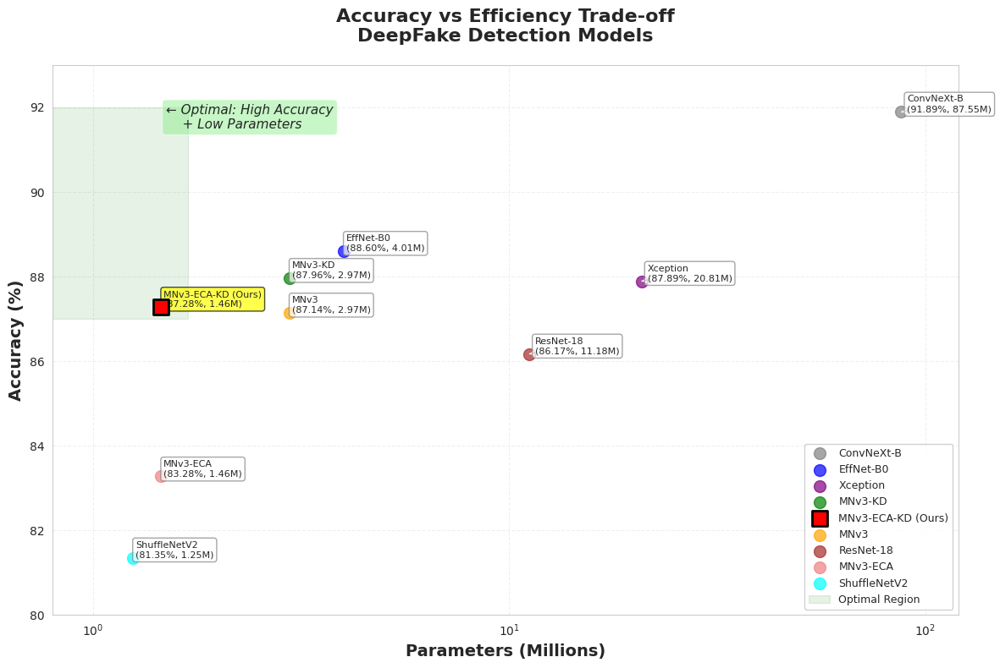

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = {
    'ConvNeXt-B': {'params': 87.55, 'acc': 91.89, 'color': 'gray', 'marker': 'o'},
    'EffNet-B0': {'params': 4.01, 'acc': 88.60, 'color': 'blue', 'marker': 'o'},
    'Xception': {'params': 20.81, 'acc': 87.89, 'color': 'purple', 'marker': 'o'},
    'MNv3-KD': {'params': 2.97, 'acc': 87.96, 'color': 'green', 'marker': 'o'},
    'MNv3-ECA-KD (Ours)': {'params': 1.46, 'acc': 87.28, 'color': 'red', 'marker': 's', 'size': 150},
    'MNv3': {'params': 2.97, 'acc': 87.14, 'color': 'orange', 'marker': 'o'},
    'ResNet-18': {'params': 11.18, 'acc': 86.17, 'color': 'brown', 'marker': 'o'},
    'MNv3-ECA': {'params': 1.46, 'acc': 83.28, 'color': 'lightcoral', 'marker': 'o'},
    'ShuffleNetV2': {'params': 1.25, 'acc': 81.35, 'color': 'cyan', 'marker': 'o'}
}

# Create figure
plt.figure(figsize=(12, 8))

# Plot each model
for model_name, data in models.items():
    size = data.get('size', 100)
    if 'Ours' in model_name:
        # Highlight our model
        plt.scatter(data['params'], data['acc'],
                   s=size, c=data['color'], marker=data['marker'],
                   edgecolors='black', linewidths=2, zorder=5,
                   label=model_name)
    else:
        plt.scatter(data['params'], data['acc'],
                   s=size, c=data['color'], marker=data['marker'],
                   alpha=0.7, label=model_name)

# Annotations
for model_name, data in models.items():
    offset_x = 2 if data['params'] < 10 else 5
    offset_y = -0.3 if 'ECA' in model_name and 'KD' not in model_name else 0.3

    plt.annotate(f"{model_name}\n({data['acc']:.2f}%, {data['params']:.2f}M)",
                xy=(data['params'], data['acc']),
                xytext=(offset_x, offset_y),
                textcoords='offset points',
                fontsize=8,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow' if 'Ours' in model_name else 'white',
                         alpha=0.7, edgecolor='black' if 'Ours' in model_name else 'gray'),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0', lw=1))

# Optimal region shading
plt.axhspan(87, 92, xmin=0, xmax=0.15, alpha=0.1, color='green', label='Optimal Region')

# Labels and title
plt.xlabel('Parameters (Millions)', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy (%)', fontsize=14, fontweight='bold')
plt.title('Accuracy vs Efficiency Trade-off\nDeepFake Detection Models',
         fontsize=16, fontweight='bold', pad=20)

# Grid
plt.grid(True, alpha=0.3, linestyle='--')

# X-axis log scale for better visualization
plt.xscale('log')
plt.xlim(0.8, 120)
plt.ylim(80, 93)

# Legend
plt.legend(loc='lower right', fontsize=9, framealpha=0.9)

# Add text annotation for insight
plt.text(1.5, 91.5, '← Optimal: High Accuracy\n    + Low Parameters',
        fontsize=11, style='italic',
        bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

plt.tight_layout()
plt.savefig('accuracy_vs_efficiency_tradeoff.png', dpi=300, bbox_inches='tight')
plt.show()

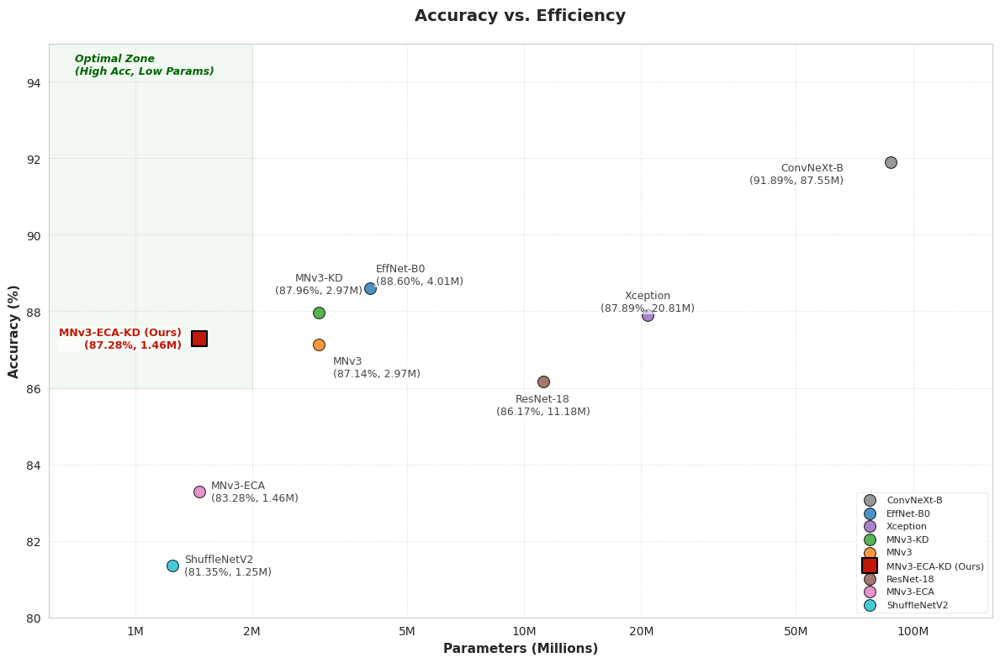

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import matplotlib.patches as patches

# === DATA AKURAT & PENGATURAN POSISI (VERTIKAL DIPERLEBAR) ===
# Nilai params & acc dikembalikan sesuai data asli Anda.
# Offset disesuaikan agar tulisan tidak bertabrakan.

models = {
    'ConvNeXt-B': {
        'params': 87.55, 'acc': 91.89,
        'color': '#7f7f7f', 'marker': 'o',  # Gray profesional
        'offset': (-40, -10), 'align': 'right'
    },
    'EffNet-B0': {
        'params': 4.01, 'acc': 88.60,
        'color': '#1f77b4', 'marker': 'o',  # Blue profesional
        'offset': (5, 12), 'align': 'left'
    },
    'Xception': {
        'params': 20.81, 'acc': 87.89,
        'color': '#9467bd', 'marker': 'o',  # Purple profesional
        'offset': (0, 12), 'align': 'center'
    },

    # --- CLUSTER TENGAH (DIPISAH SECARA VERTIKAL) ---

    'MNv3-KD': {
        'params': 2.97, 'acc': 87.96,
        'color': '#2ca02c', 'marker': 'o',  # Green profesional
        # Offset (0, 25) -> Ditarik tinggi ke atas
        'offset': (0, 25), 'align': 'center'
    },

    'MNv3': {
        'params': 2.97, 'acc': 87.14,
        'color': '#ff7f0e', 'marker': 'o',  # Orange profesional
        # Offset (12, -20) -> Ditarik ke bawah & kanan
        'offset': (12, -20), 'align': 'left'
    },

    'MNv3-ECA-KD (Ours)': {
        'params': 1.46, 'acc': 87.28,
        'color': '#c21807', 'marker': 's', 'size': 180, # Red profesional
        # Offset (-15, 0) -> Geser ke Kiri (Posisi aman)
        'offset': (-15, 0), 'align': 'right'
    },
    # -----------------------------------------------

    'ResNet-18': {
        'params': 11.18, 'acc': 86.17,
        'color': '#8c564b', 'marker': 'o',  # Brown profesional
        'offset': (0, -20), 'align': 'center'
    },
    'MNv3-ECA': {
        'params': 1.46, 'acc': 83.28,
        'color': '#e377c2', 'marker': 'o',  # Lightcoral tone
        'offset': (10, 0), 'align': 'left'
    },
    'ShuffleNetV2': {
        'params': 1.25, 'acc': 81.35,
        'color': '#17becf', 'marker': 'o',  # Cyan tone
        'offset': (10, 0), 'align': 'left'
    }
}

# === SETUP PLOT ===
fig, ax = plt.subplots(figsize=(12, 8))
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

# 1. OPTIMAL ZONE (x < 2M, y > 86%)
# Start: x=0.5, y=86
# Width: 1.5 (Total x = 2.0)
# Height: 9.0 (Total y = 95)
ax.add_patch(patches.Rectangle((0.5, 86), 1.5, 9.0, color='green', alpha=0.05, zorder=0))

# Label Zone
ax.text(0.7, 94.2, "Optimal Zone\n(High Acc, Low Params)",
        fontsize=9, style='italic', color='#006400', fontweight='bold')

# 2. Loop Data
for name, data in models.items():
    is_ours = 'Ours' in name
    size = data.get('size', 100)

    # Plot Titik
    ax.scatter(data['params'], data['acc'],
               s=size,
               c=data['color'],
               marker=data['marker'],
               edgecolors='black',
               linewidths=1.5 if is_ours else 0.8,
               alpha=1.0 if is_ours else 0.8,
               zorder=10 if is_ours else 5,
               label=name)

    # Siapkan Label
    label_text = f"{name}\n({data['acc']:.2f}%, {data['params']:.2f}M)" # Format 2 desimal sesuai data asli
    x_off, y_off = data['offset']
    align = data.get('align', 'left')

    # Style Teks
    if is_ours:
        font_weight = 'bold'
        font_color = '#c21807'
    else:
        font_weight = 'normal'
        font_color = '#444444'

    # Render Teks
    ax.annotate(label_text,
                xy=(data['params'], data['acc']),
                xytext=(x_off, y_off),
                textcoords='offset points',
                ha=align, va='center',
                fontsize=9,
                fontweight=font_weight,
                color=font_color,
                # Background putih transparan halus
                bbox=dict(boxstyle="square,pad=0.1", fc="white", ec="none", alpha=0.6),
                zorder=20)

# === AXIS & FORMATTING ===
ax.set_xscale('log')
ax.set_xlim(0.6, 160)
ax.set_ylim(80, 95)   # Y-limit diperbesar agar label atas tidak terpotong

# Format Axis
formatter = ScalarFormatter()
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
ax.set_xticks([1, 2, 5, 10, 20, 50, 100])
ax.set_xticklabels(['1M', '2M', '5M', '10M', '20M', '50M', '100M'])

# Labels
ax.set_xlabel('Parameters (Millions)', fontsize=11, fontweight='bold')
ax.set_ylabel('Accuracy (%)', fontsize=11, fontweight='bold')
ax.set_title('Accuracy vs. Efficiency', fontsize=14, fontweight='bold', pad=20)

# Grid
ax.grid(True, which="major", ls=":", color='gray', alpha=0.3)

# Legend
ax.legend(loc='lower right', fontsize=8, framealpha=0.95, edgecolor='#eee')

plt.tight_layout()
plt.savefig('accuracy_vs_efficiency_final_accurate.png', dpi=300, bbox_inches='tight')
plt.show()

###**MobileNetV3**

In [ ]:
BASELINE_HISTORY_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/logs/Stage-2/history.csv'

--- Generating and Saving Visualizations to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics ---
   Generating training history plot...


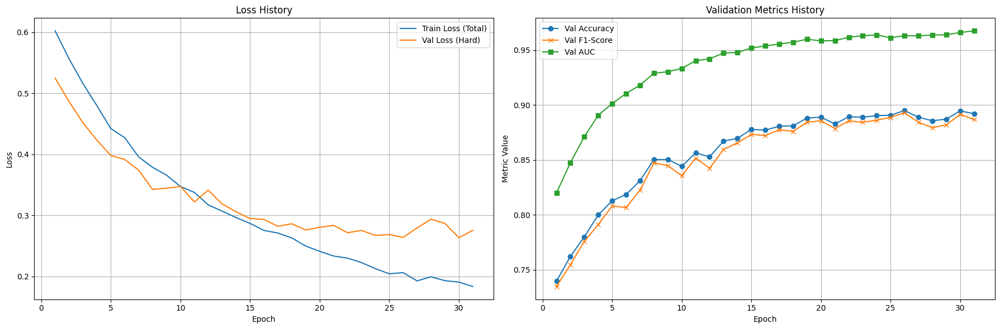

   Saved history plot to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/training_history.png
   Generating confusion matrix...


Generating Confusion Matrix:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1341148884.py:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


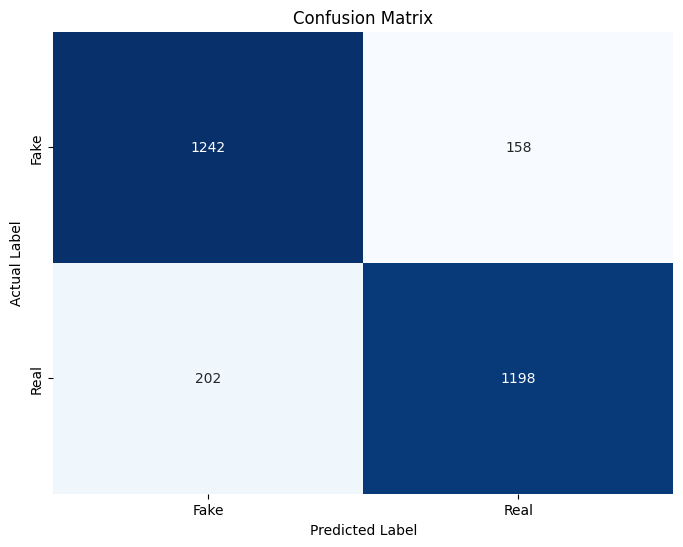

   Saved confusion matrix to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/metrics/confusion_matrix.png
--- Visualization Complete ---


In [ ]:
plot_and_save_visualizations(
    model=baseline_best,
    test_loader=test_loader,
    history_csv_path=BASELINE_HISTORY_PATH,
    METRIC_DIR=BASELINE_METRICS_DIR,
    device=DEVICE,
    class_names=CLASS_NAMES
)

###**MobileNetV3 ECA**

In [ ]:
ECA_HISTORY_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/logs/Stage-2/history.csv'

--- Generating and Saving Visualizations to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics ---
   Generating training history plot...


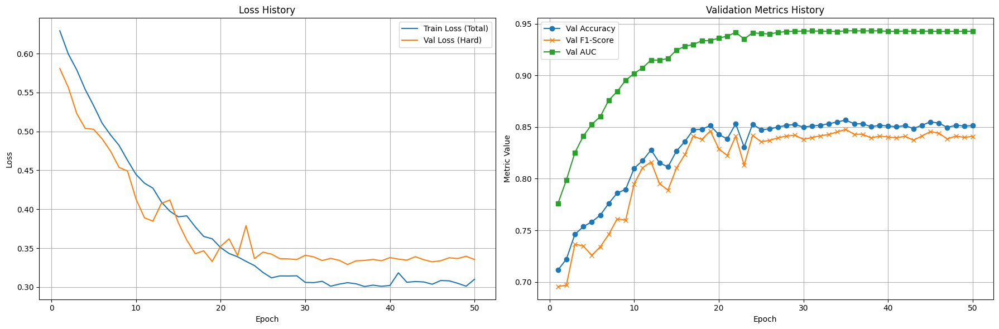

   Saved history plot to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/training_history.png
   Generating confusion matrix...


Generating Confusion Matrix:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1341148884.py:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


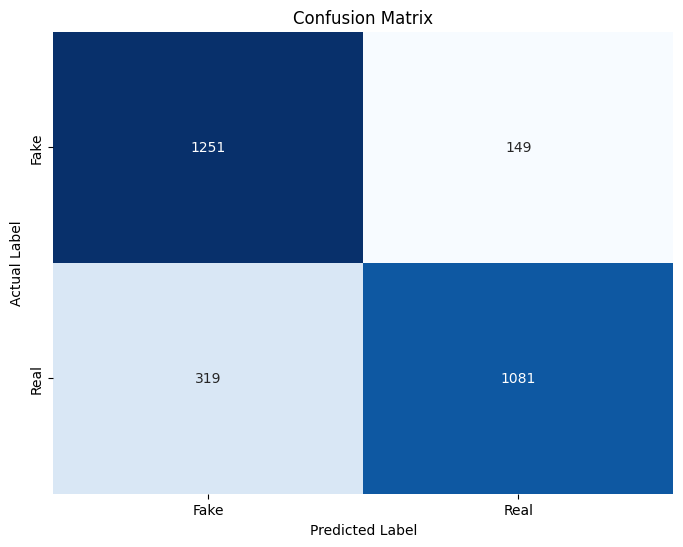

   Saved confusion matrix to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/metrics/confusion_matrix.png
--- Visualization Complete ---


In [ ]:
plot_and_save_visualizations(
    model=eca_best,
    test_loader=test_loader,
    history_csv_path=ECA_HISTORY_PATH,
    METRIC_DIR=ECA_METRICS_DIR,
    device=DEVICE,
    class_names=CLASS_NAMES
)

###**MobileNetV3 ECA KD**

In [ ]:
KD_HISTORY_PATH = '/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/logs/Stage-2/history.csv'

--- Generating and Saving Visualizations to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics ---
   Generating training history plot...


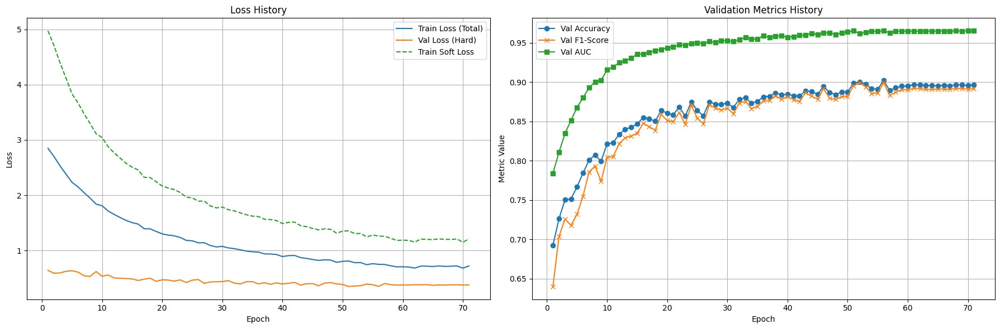

   Saved history plot to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics/training_history.png
   Generating confusion matrix...


Generating Confusion Matrix:   0%|          | 0/88 [00:00<?, ?batch/s]

/tmp/ipython-input-1341148884.py:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


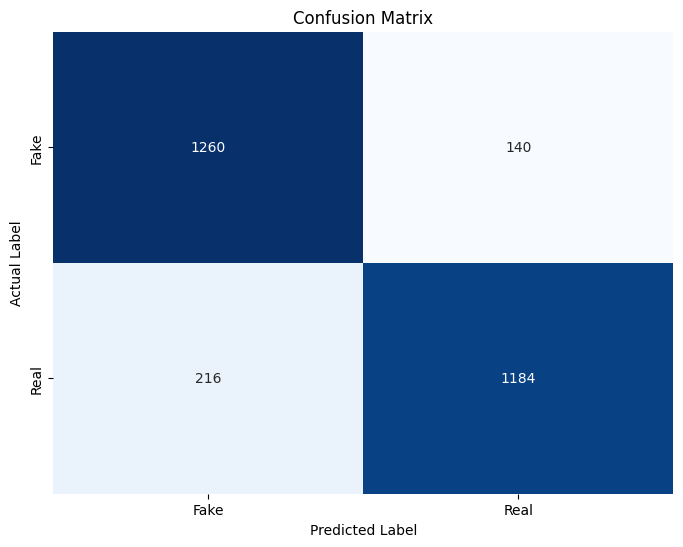

   Saved confusion matrix to /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/metrics/confusion_matrix.png
--- Visualization Complete ---


In [ ]:
plot_and_save_visualizations(
    model=kd_best,
    test_loader=test_loader,
    history_csv_path=KD_HISTORY_PATH,
    METRIC_DIR=KD_METRICS_DIR,
    device=DEVICE,
    class_names=CLASS_NAMES
)

##**Alternatives**

In [ ]:
def measure_inference_speed(model, device, dummy_input_size=(1, 3, 224, 224), num_runs=1000):
    """
    Mengukur waktu inferensi (ms/sample) dan throughput (FPS) secara robust.

    Args:
        model (nn.Module): Model yang telah dilatih (dalam mode eval).
        device (str): 'cuda' atau 'cpu'.
        dummy_input_size (tuple): Ukuran satu sample input.
        num_runs (int): Jumlah iterasi untuk dirata-rata.
    """
    print("--- ⚡ Mengukur Kecepatan Inferensi ---")
    model.to(device)
    model.eval()

    # Buat satu input dummy
    dummy_input = torch.randn(dummy_input_size, device=device)

    # --- 1. Warm-up (Sangat Penting) ---
    # Menjalankan beberapa iterasi pertama untuk "memanaskan"
    # cache CUDA dan kernel.
    print("Menjalankan warm-up (100 iterasi)...")
    for _ in range(100):
        with torch.no_grad():
            with autocast(enabled=(device == 'cuda')):
                _ = model(dummy_input)

    # Sinkronisasi CUDA (WAJIB untuk timing GPU yang akurat)
    if device == 'cuda':
        torch.cuda.synchronize()

    # --- 2. Pengukuran Waktu ---
    print(f"Menjalankan pengukuran {num_runs} iterasi...")
    start_time = time.perf_counter()

    for _ in range(num_runs):
        with torch.no_grad():
            with autocast(enabled=(device == 'cuda')):
                _ = model(dummy_input)

    # Sinkronisasi CUDA lagi di akhir
    if device == 'cuda':
        torch.cuda.synchronize()

    end_time = time.perf_counter()

    # --- 3. Perhitungan Hasil ---
    total_time_ms = (end_time - start_time) * 1000
    avg_inference_time = total_time_ms / num_runs
    throughput_fps = 1000.0 / avg_inference_time

    print(f"Waktu Inferensi Rata-rata: {avg_inference_time:.4f} ms per sample")
    print(f"Throughput:               {throughput_fps:.2f} FPS")
    print("-" * 37)
    return avg_inference_time, throughput_fps

def get_model_size(saved_model_path):
    """
    Mengukur ukuran file model dalam Megabyte (MB).

    Args:
        saved_model_path (str): Path ke file checkpoint .pth
    """
    try:
        size_bytes = os.path.getsize(saved_model_path)
        size_mb = size_bytes / (1024 * 1024)
        print("--- 🗜️ Ukuran Model ---")
        print(f"Ukuran file model: {size_mb:.2f} MB")
        print(f"Lokasi: {saved_model_path}")
        print("-" * 37)
        return size_mb
    except OSError as e:
        print(f"Gagal mengukur ukuran file: {e}")
        return None

def plot_confusion_matrix(model, dataloader, device, class_names):
    """
    Membuat, menghitung, dan menampilkan plot confusion matrix.

    Args:
        model (nn.Module): Model yang telah dilatih.
        dataloader (DataLoader): DataLoader untuk set tes (test_loader).
        device (str): 'cuda' atau 'cpu'.
        class_names (list): List nama kelas, cth: ['Asli', 'DeepFake'].
    """
    print("--- 📈 Membuat Confusion Matrix ---")
    model.to(device)
    model.eval()

    # Inisialisasi metrik CM (sesuai setup 'binary' Anda)
    confmat = ConfusionMatrix(task="binary", num_classes=2).to(device)

    print("Mengevaluasi model di set data...")
    for inputs, labels in tqdm(dataloader, desc="Test Set"):
        inputs, labels = inputs.to(device), labels.to(device)
        labels_unsqueezed = labels.float().unsqueeze(1) # Sesuai format 'binary'

        with torch.no_grad():
            with autocast(enabled=(device == 'cuda')):
                outputs = model(inputs)
                preds_sigmoid = outputs.sigmoid()

            # Update CM dengan batch
            confmat.update(preds_sigmoid, labels_unsqueezed)

    # Hitung CM final setelah semua batch
    try:
        cm = confmat.compute().cpu().numpy()

        print("\nConfusion Matrix (Raw):")
        print(cm)

        # Plotting
        df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
        plt.figure(figsize=(8, 6))
        sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
        plt.title('Confusion Matrix')
        plt.ylabel('Label Sebenarnya (Actual)')
        plt.xlabel('Label Prediksi (Predicted)')
        plt.show()

        # Simpan jika perlu
        # plt.savefig(os.path.join(LOG_DIR, 'confusion_matrix.png'))

    except Exception as e:
        print(f"\nGagal menghitung atau mem-plot Confusion Matrix: {e}")
        print("Pastikan dataloader tidak kosong.")

    print("-" * 37)
    return cm

MobileNetV3

--- 🗜️ Ukuran Model ---
Ukuran file model: 11.54 MB
Lokasi: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-2/cp-best-epoch-26.pth
-------------------------------------
--- ⚡ Mengukur Kecepatan Inferensi ---
Menjalankan warm-up (100 iterasi)...


/tmp/ipython-input-4061010895.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Menjalankan pengukuran 1000 iterasi...


/tmp/ipython-input-4061010895.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Waktu Inferensi Rata-rata: 8.7020 ms per sample
Throughput:               114.92 FPS
-------------------------------------
--- 📈 Membuat Confusion Matrix ---
Mengevaluasi model di set data...


Test Set:   0%|          | 0/88 [00:00<?, ?it/s]

/tmp/ipython-input-4061010895.py:98: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



Confusion Matrix (Raw):
[[1242  158]
 [ 202 1198]]


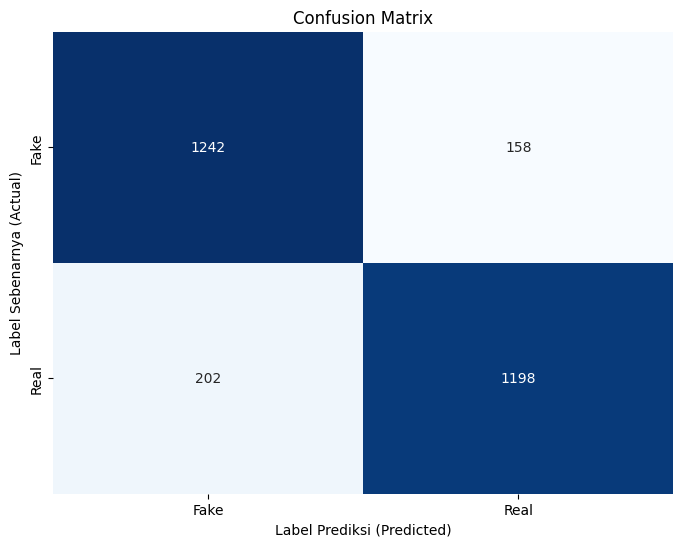

-------------------------------------


array([[1242,  158],
       [ 202, 1198]])

In [ ]:
# 1. Model Size
get_model_size('/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3/checkpoint/Stage-2/cp-best-epoch-26.pth')

# 2. Inference Time & Throughput
INPUT_DIM = (1, 3, IMG_SIZE[0], IMG_SIZE[1])
measure_inference_speed(baseline_best, DEVICE, INPUT_DIM)

# 3. Confusion Matrix
CLASS_NAMES = ['Fake', 'Real']
plot_confusion_matrix(baseline_best, test_loader, DEVICE, CLASS_NAMES)

In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

baseline_best.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = baseline_best(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.3436 | Test Acc: 0.8729 | Test AUC: 0.9435


MobileNetV3 ECA

--- 🗜️ Ukuran Model ---
Ukuran file model: 5.77 MB
Lokasi: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-2/cp-best-epoch-35.pth
-------------------------------------
--- ⚡ Mengukur Kecepatan Inferensi ---
Menjalankan warm-up (100 iterasi)...


/tmp/ipython-input-4061010895.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Menjalankan pengukuran 1000 iterasi...


/tmp/ipython-input-4061010895.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Waktu Inferensi Rata-rata: 8.2218 ms per sample
Throughput:               121.63 FPS
-------------------------------------
--- 📈 Membuat Confusion Matrix ---
Mengevaluasi model di set data...


Test Set:   0%|          | 0/88 [00:00<?, ?it/s]

/tmp/ipython-input-4061010895.py:98: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):



Confusion Matrix (Raw):
[[1255  145]
 [ 334 1066]]


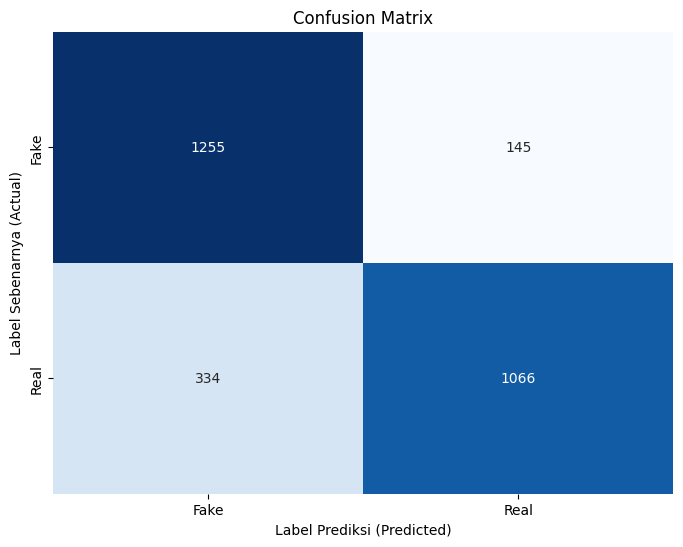

-------------------------------------


array([[1255,  145],
       [ 334, 1066]])

In [ ]:
# 1. Model Size
get_model_size('/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA/checkpoint/Stage-2/cp-best-epoch-35.pth')

# 2. Inference Time & Throughput
INPUT_DIM = (1, 3, IMG_SIZE[0], IMG_SIZE[1])
measure_inference_speed(eca_trained, DEVICE, INPUT_DIM)

# 3. Confusion Matrix
CLASS_NAMES = ['Fake', 'Real']
plot_confusion_matrix(eca_trained, test_loader, DEVICE, CLASS_NAMES)

In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

eca_best.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = eca_best(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7bbb50225440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7bbb50225440>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers

    Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers

         if w.is_alive(): 
  ^   ^ ^ ^ ^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^    
assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/lib/python

Hasil Test Set:
  Test Loss: 0.4018 | Test Acc: 0.8318 | Test AUC: 0.9211


MobileNetV3 ECA KD

--- 🗜️ Ukuran Model ---
Ukuran file model: 5.77 MB
Lokasi: /content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-2/cp-best-epoch-56.pth
-------------------------------------
--- ⚡ Mengukur Kecepatan Inferensi ---
Menjalankan warm-up (100 iterasi)...


/tmp/ipython-input-4061010895.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Menjalankan pengukuran 1000 iterasi...


/tmp/ipython-input-4061010895.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):


Waktu Inferensi Rata-rata: 7.7979 ms per sample
Throughput:               128.24 FPS
-------------------------------------
--- 📈 Membuat Confusion Matrix ---
Mengevaluasi model di set data...


Test Set:   0%|          | 0/88 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7bbb50225440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
/tmp/ipython-input-4061010895.py:98: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device == 'cuda')):
       ^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7bbb50225440>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
^^    ^self._shutdown_workers()

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/local/lib/python3.12/dist-packages/


Confusion Matrix (Raw):
[[1281  119]
 [ 247 1153]]


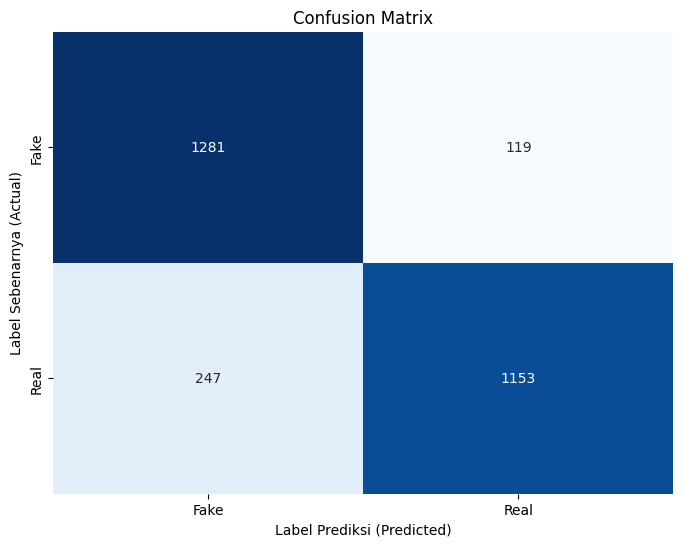

-------------------------------------


array([[1281,  119],
       [ 247, 1153]])

In [ ]:
# 1. Model Size
get_model_size('/content/drive/MyDrive/Tugas-Akhir/Model/MobileNetV3_ECA_KD/checkpoint/Stage-2/cp-best-epoch-56.pth')

# 2. Inference Time & Throughput
INPUT_DIM = (1, 3, IMG_SIZE[0], IMG_SIZE[1])
measure_inference_speed(kd_trained, DEVICE, INPUT_DIM)


# 3. Confusion Matrix
CLASS_NAMES = ['Fake', 'Real']
plot_confusion_matrix(kd_trained, test_loader, DEVICE, CLASS_NAMES)

In [ ]:
criterion = nn.BCEWithLogitsLoss()
print("--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---")

test_acc_metric = torchmetrics.Accuracy(task='binary').to(DEVICE)
test_auc_metric = torchmetrics.AUROC(task='binary').to(DEVICE)
test_loss = 0.0

kd_best.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="[Test]", unit="batch"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        labels = labels.float().unsqueeze(1)

        outputs = kd_best(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item()
        test_acc_metric.update(outputs.sigmoid(), labels)
        test_auc_metric.update(outputs.sigmoid(), labels)

avg_test_loss = test_loss / len(test_loader)
final_test_acc = test_acc_metric.compute()
final_test_auc = test_auc_metric.compute()

print(f"Hasil Test Set:")
print(f"  Test Loss: {avg_test_loss:.4f} | Test Acc: {final_test_acc:.4f} | Test AUC: {final_test_auc:.4f}")

--- Mengevaluasi Model pada Test Set (dengan bobot terbaik) ---


[Test]:   0%|          | 0/88 [00:00<?, ?batch/s]

Hasil Test Set:
  Test Loss: 0.4828 | Test Acc: 0.8729 | Test AUC: 0.9478
